In [24]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import scipy.ndimage as ndimage
from datetime import datetime, timedelta
from netCDF4 import num2date
from siphon.catalog import TDSCatalog
from siphon.ncss import NCSS
#from __future__ import print_function
from metpy.units import units
from metpy.calc import wind_speed, wind_direction
import numpy.ma as ma
import matplotlib
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
from cartopy.io.shapereader import Reader
from cartopy.feature import ShapelyFeature
import os
from shapely.geometry import polygon as sp
import pyproj 
import shapely.ops as ops
from shapely.ops import transform
from shapely.geometry.polygon import Polygon
from functools import partial
from shapely import geometry
import nexradaws
import pyart
import pandas as pd
from scipy import stats
from matplotlib.patches import PathPatch
import geopandas
from scipy import ndimage as ndi
from kdp_section import kdp_genesis
from pyproj import Geod

In [25]:
#Bring in Homeyer rainbow colormap. This line will not be needed once the next version of PyART comes out, 
#but is commented out here since I'm defaulting it to run without it at the moment.
#%run code_colormaps_CVD/colormap_generator.py

In [26]:
# arc_outlines = pd.read_pickle('ZDRoutlines2016331KINX.pkl')
# arc_outlines2 = pd.read_pickle('ZDRoutlines3502016331KINX.pkl')
# arc_outlines3 = pd.read_pickle('ZDRoutlines3502016330KINX.pkl')
arc_outlines4 = pd.read_pickle('ZDR_KPOE121619_newforest.pkl')

foot_outlines1 = pd.read_pickle('KDP1_KPOE121619.pkl')

In [27]:
#Create a projection for use in area calculations
#Set up projection for area calculations
proj = partial(pyproj.transform, pyproj.Proj(init='epsg:4326'),
           pyproj.Proj(init='epsg:3857'))

In [28]:
#print(foot_outlines1[0][0].to_polygons())

foot_out1 = foot_outlines1[0][0].vertices
#print(foot_out1)

print(sp.asPolygon(foot_out1).centroid.bounds)
print(sp.asPolygon(foot_out1).area)
print(transform(proj, sp.asPolygon(foot_out1)).area/(1000*1000))


(-93.51316620824876, 30.77899830162223, -93.51316620824876, 30.77899830162223)
0.00286100448061516
41.2660842947983


In [29]:
#Get all kdp foot and zdr arc algorithm centroids

foot_alg_cenlons = []
foot_alg_cenlats = []
foot_alg_areas = []
for i in range(len(foot_outlines1)):
    print(i)
    foot_alg_ilons = []
    foot_alg_ilats = []
    foot_alg_iareas = []
    for k in range(len(foot_outlines1[i])):
        foot_out1 = foot_outlines1[i][k].vertices
        foot_cent1 = sp.asPolygon(foot_out1).centroid.bounds
        foot_alg_iareas.append(transform(proj, sp.asPolygon(foot_out1)).area/(1000*1000))
        foot_alg_ilons.append(foot_cent1[0])
        foot_alg_ilats.append(foot_cent1[1])
    foot_cenloni = np.sum(np.asarray(foot_alg_ilons) * np.asarray(foot_alg_iareas)) / np.sum(np.asarray(foot_alg_iareas))
    foot_cenlati = np.sum(np.asarray(foot_alg_ilats) * np.asarray(foot_alg_iareas)) / np.sum(np.asarray(foot_alg_iareas))
    foot_areat = np.sum(np.asarray(foot_alg_iareas))
    foot_alg_areas.append(foot_areat)
    foot_alg_cenlons.append(foot_cenloni)
    foot_alg_cenlats.append(foot_cenlati)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35


In [30]:
print(foot_alg_cenlons)

[-93.50543238260208, -93.50374202577675, -93.4863640807522, -93.47041647969405, -93.45872125313342, -93.43817765322075, -93.4327562080027, -93.41666399566208, -93.39787668616607, -93.3876367781161, -93.37876714031464, -93.37655665060736, -93.34612024191622, -93.34148056181989, -93.32616467457596, -93.31587274133587, -93.29735941186502, -93.27788274494046, -93.26458696684612, -93.2541045969091, -93.25293769654581, -93.24362984898121, -93.23034746822732, -93.22175181064449, -93.20497921240506, -93.18579704466893, -93.18059920762437, -93.17518279368315, -93.15955585392393, -93.14607336011015, -93.13193710128145, -93.11228081526143, -93.09153536964975, -93.09739213811226, -93.08157274141901, -93.05935165667641]


In [31]:
#Get all kdp foot and zdr arc algorithm centroids

arc_alg_cenlons = []
arc_alg_cenlats = []

for i in range(len(arc_outlines4)):
    print(i)
    arc_alg_ilons = []
    arc_alg_ilats = []
    arc_alg_iareas = []
    for k in range(len(arc_outlines4[i])):
        arc_out1 = arc_outlines4[i][k].vertices
        arc_cent1 = sp.asPolygon(arc_out1).centroid.bounds
        arc_alg_iareas.append(transform(proj, sp.asPolygon(arc_out1)).area/(1000*1000))
        arc_alg_ilons.append(arc_cent1[0])
        arc_alg_ilats.append(arc_cent1[1])
    arc_cenloni = np.sum(np.asarray(arc_alg_ilons) * np.asarray(arc_alg_iareas)) / np.sum(np.asarray(arc_alg_iareas))
    arc_cenlati = np.sum(np.asarray(arc_alg_ilats) * np.asarray(arc_alg_iareas)) / np.sum(np.asarray(arc_alg_iareas))
    arc_alg_cenlons.append(arc_cenloni)
    arc_alg_cenlats.append(arc_cenlati)


0
1
2
3
4
5
6
7
8
9
10
11


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in double_scalars


12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35


In [32]:
print(arc_alg_cenlons)

[nan, nan, nan, nan, nan, nan, -93.37875112822539, -93.35101544363286, -93.3280752474095, -93.30570097701361, -93.2854453010594, -93.30060815490215, -93.29088837934955, -93.2879305350074, -93.27063933640676, -93.26529967630262, -93.25555725113114, -93.22547773615348, -93.19522059811042, -93.16854563287352, -93.13357800702725, -93.11719585713504, -93.1093694673185, -93.10231800687798, -93.09213407692654, -93.110510214143, -93.09488694894017, -93.06181872986204, -93.05953287092834, -93.02941725368544, -93.01621638511898, -92.99372160774966, -92.97072520972202, -92.95604460652471, -93.011060123258, -92.97060280476168]


In [33]:
print(arc_outlines4[3])

[]


In [34]:
#Create a projection for use in area calculations
#Set up projection for area calculations
proj = partial(pyproj.transform, pyproj.Proj(init='epsg:4326'),
           pyproj.Proj(init='epsg:3857'))

In [35]:
arcshapefiles = []
areas = []
arctext = []
arc_clats = []
arc_clons = []
for file in os.listdir('Deridder_storm/MW_arcs'):
    if file.endswith('.shp'):
        print(file)
        arctext.append(file)
        arc0001 = 'Deridder_storm/MW_arcs/'+file
        Arc0001 = ShapelyFeature(Reader(arc0001).geometries(),ccrs.PlateCarree(), facecolor = 'none', edgecolor = 'red')
        arcshapefiles.append(Arc0001)
        
        file1 = geopandas.read_file('Deridder_storm/MW_arcs/'+file)  
        filematrix = file1['geometry']
        pr_area1 = (transform(proj, filematrix[0]).area * units('m^2')).to('km^2')
        centroid = filematrix[0].centroid
        arc_clons.append(centroid.bounds[0])
        arc_clats.append(centroid.bounds[1])
        #print(centroid)
        areas.append(pr_area1.magnitude)

arcscan01.shp
arcscan02.shp
arcscan03.shp
arcscan04.shp
arcscan05.shp
arcscan06.shp
arcscan07.shp
arcscan08.shp
arcscan09.shp
arcscan10.shp
arcscan11.shp
arcscan12.shp
arcscan13.shp
arcscan14.shp
arcscan15.shp
arcscan16.shp
arcscan17.shp
arcscan18.shp
arcscan19.shp
arcscan20.shp
arcscan21.shp
arcscan22.shp
arcscan23.shp
arcscan24.shp
arcscan25.shp
arcscan26.shp
arcscan27.shp
arcscan28.shp
arcscan29.shp
arcscan30.shp


In [36]:
print(centroid.bounds[0])
print(centroid.bounds[1])
print(centroid.bounds)


-92.98373297263794
31.02614656155374
(-92.98373297263794, 31.02614656155374, -92.98373297263794, 31.02614656155374)


In [37]:
footshapefiles = []
footareas = []
foottext = []
foot_clats = []
foot_clons = []
for file in os.listdir('Deridder_storm/KDPfeet'):
    if file.endswith('.shp'):
        print(file)
        foottext.append(file)
        foot0001 = 'Deridder_storm/KDPfeet/'+file
        Foot0001 = ShapelyFeature(Reader(foot0001).geometries(),ccrs.PlateCarree(), facecolor = 'none', edgecolor = 'green')
        footshapefiles.append(Foot0001)
        
        file1 = geopandas.read_file('Deridder_storm/KDPfeet/'+file)  
        filematrix = file1['geometry']
        pr_area1 = (transform(proj, filematrix[0]).area * units('m^2')).to('km^2')
        centroid = filematrix[0].centroid
        foot_clons.append(centroid.bounds[0])
        foot_clats.append(centroid.bounds[1])
        footareas.append(pr_area1.magnitude)

KDPfoot01.shp
KDPfoot02.shp
KDPfoot03.shp
KDPfoot04.shp
KDPfoot05.shp
KDPfoot06.shp
KDPfoot07.shp
KDPfoot08.shp
KDPfoot09.shp
KDPfoot10.shp
KDPfoot11.shp
KDPfoot12.shp
KDPfoot13.shp
KDPfoot14.shp
KDPfoot15.shp
KDPfoot16.shp
KDPfoot17.shp
KDPfoot18.shp
KDPfoot19.shp
KDPfoot20.shp
KDPfoot21.shp
KDPfoot22.shp
KDPfoot23.shp
KDPfoot24.shp
KDPfoot25.shp
KDPfoot26.shp
KDPfoot27.shp
KDPfoot28.shp
KDPfoot29.shp
KDPfoot30.shp


In [38]:
arcshapefilesc = arcshapefiles
areasc = areas
arctextc = arctext
arc_clatsc = arc_clats
arc_clonsc = arc_clons

In [39]:
footshapefilesc = footshapefiles
footareasc = footareas
foottextc = foottext
foot_clatsc = foot_clats
foot_clonsc = foot_clons

In [40]:
print(len(footshapefiles))
print(arctext[21])
print(foottext[18])

30
arcscan22.shp
KDPfoot19.shp


In [41]:
#print(arcshapefiles)
# #Rearrange the manual shapefiles so they're in correct order
# arcshapefilesc = []
# areasc = []
# arctextc = []
# arc_clatsc = []
# arc_clonsc = []
# m = 21
# for i in range(19):
#     print(i)
#     arcshapefilesc.append(arcshapefiles[m])
#     areasc.append(areas[m])
#     arctextc.append(arctext[m])
#     arc_clatsc.append(arc_clats[m])
#     arc_clonsc.append(arc_clons[m])
#     m = m+1
# for i in range(21):
#     arcshapefilesc.append(arcshapefiles[i])
#     areasc.append(areas[i])
#     arctextc.append(arctext[i])
#     arc_clatsc.append(arc_clats[i])
#     arc_clonsc.append(arc_clons[i])

In [42]:
#print(arcshapefiles)
#Rearrange the manual shapefiles so they're in correct order
# footshapefilesc = []
# footareasc = []
# foottextc = []
# foot_clatsc = []
# foot_clonsc = []
# m = 19
# for i in range(17):
#     print(i)
#     footshapefilesc.append(footshapefiles[m])
#     footareasc.append(footareas[m])
#     foottextc.append(foottext[m])
#     foot_clatsc.append(foot_clats[m])
#     foot_clonsc.append(foot_clons[m])
#     m = m+1
# for i in range(19):
#     footshapefilesc.append(footshapefiles[i])
#     footareasc.append(footareas[i])
#     foottextc.append(foottext[i])
#     foot_clatsc.append(foot_clats[i])
#     foot_clonsc.append(foot_clons[i])

# footshapefilesc.insert(4,[np.nan])
# footareasc.insert(4,np.nan)
# foottextc.insert(4,[np.nan])
# foot_clatsc.insert(4,np.nan)
# foot_clonsc.insert(4,np.nan)

# footshapefilesc.insert(18,[np.nan])
# footareasc.insert(18,np.nan)
# foottextc.insert(18,[np.nan])
# foot_clatsc.insert(18,np.nan)
# foot_clonsc.insert(18,np.nan)

# footshapefilesc.insert(19,[np.nan])
# footareasc.insert(19,np.nan)
# foottextc.insert(19,[np.nan])
# foot_clatsc.insert(19,np.nan)
# foot_clonsc.insert(19,np.nan)

# footshapefilesc.insert(37,[np.nan])
# footareasc.insert(37,np.nan)
# foottextc.insert(37,[np.nan])
# foot_clatsc.insert(37,np.nan)
# foot_clonsc.insert(37,np.nan)

In [43]:
print(arctextc[11])
print(foottextc[11])

arcscan12.shp
KDPfoot12.shp


In [44]:
# print(arctextc[37])
# print(foottextc[34])

In [45]:
print(len(footshapefilesc))
print(len(arcshapefilesc))

#add the proper null items into the KDP list
#footshapefilesc.insert(4,[np.nan])
#print(footshapefilesc[37])

30
30


In [46]:
folder = 'Deridder_storm/KPOE121619'

In [47]:
radarfiles = []
for radar_file in os.listdir(folder):
    radarfiles.append(radar_file)

In [48]:
print(radarfiles[0])
radar1 = pyart.io.nexrad_archive.read_nexrad_archive(folder+'/'+radarfiles[0])

KPOE20191216_164143_V06


In [49]:
radar = radar1.extract_sweeps([0])

In [50]:
refl_arrays = []
zdr_arrays = []
kdp_arrays = []
lon_arrays = []
lat_arrays = []
grids = []
s = 1
for radar_file in os.listdir(folder):
    radar1 = pyart.io.nexrad_archive.read_nexrad_archive(folder+'/'+radar_file)
    print('file number', s)
    s = s + 1
    for i in range(radar1.nsweeps):
        #print('in loop')
        radar = radar1.extract_sweeps([i])
        #print(((np.mean(radar.elevation['data']))))
        if ((np.mean(radar.elevation['data']) < .65) and (np.max(np.asarray(radar.fields['differential_reflectivity']['data'])) != np.min(np.asarray(radar.fields['differential_reflectivity']['data'])))):
            #print('yep')
            ref_ungridded = radar.fields['reflectivity']['data']
            #Mask out everything with reflectivity below Z=20 dBZ for Z and ZDR
            refl_c = np.copy(ref_ungridded)
            ref_c = ma.masked_where(refl_c < 20., refl_c)
            ungrid_lons = radar.gate_longitude['data']
            ungrid_lats = radar.gate_latitude['data']
            zdr_ungridded = radar.fields['differential_reflectivity']['data']
            zdrl_c = np.copy(zdr_ungridded)
            zdr_c = ma.masked_where(refl_c < 20, zdrl_c)
            zdr_arrays.append(zdr_c)
            refl_arrays.append(ref_c)
            lon_arrays.append(ungrid_lons)
            lat_arrays.append(ungrid_lats)
            #Calling kdp_section; Using NWS method, creating ungridded, smoothed KDP field
            kdp_nwsdict = kdp_genesis(radar)

            #Add field to radar
            radar.add_field('KDP', kdp_nwsdict)
            kdp_ungridded_nws = radar.fields['KDP']['data']
            kdp_arrays.append(kdp_ungridded_nws)
            grid = pyart.map.grid_from_radars(
                (radar,),
                grid_shape=(1, 500, 500),
                grid_limits=((200, 200), (-123000.0, 123000.0), (-123000.0, 123000.0)),
                fields=['differential_reflectivity','reflectivity','cross_correlation_ratio', 'KDP'])
            grids.append(grid)

file number 1
KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


file number 2
KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


file number 3
KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


file number 4
KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


file number 5
KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


file number 6
KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


file number 7
KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


file number 8
KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


KDP Section


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\pyart\map\gates_to_grid.py:177: DeprecationWarning: Barnes weighting function is deprecated. Please use Barnes 2 to be consistent with Pauley and Wu 1990.
  " Pauley and Wu 1990.", DeprecationWarning)


In [51]:
ref_ungridded = radar.fields['reflectivity']['data']
#Mask out everything with reflectivity below Z=20 dBZ for Z and ZDR
refl_c = np.copy(ref_ungridded)
ref_c = ma.masked_where(refl_c < 20., refl_c)
zdr_ungridded = radar.fields['differential_reflectivity']['data']
zdrl_c = np.copy(zdr_ungridded)
zdr_c = ma.masked_where(refl_c < 20, zdrl_c)
ungrid_lons = radar.gate_longitude['data']
ungrid_lats = radar.gate_latitude['data']


In [52]:
print(np.max(ref_c))
print(ungrid_lons)
print(ungrid_lats)

64.5
[[-92.95514545 -92.95267893 -92.95021245 ... -88.51204007 -88.50965186
  -88.50726234]
 [-92.95511926 -92.95264967 -92.95018012 ... -88.50977913 -88.50739067
  -88.50500156]
 [-92.95509982 -92.95262796 -92.95015613 ... -88.50896288 -88.50657555
  -88.50418789]
 ...
 [-92.95528394 -92.95283369 -92.95038347 ... -88.53227668 -88.5298936
  -88.52751018]
 [-92.95523318 -92.95277697 -92.95032078 ... -88.52457275 -88.52218724
  -88.5198014 ]
 [-92.95518871 -92.95272727 -92.95026587 ... -88.51822094 -88.51583372
  -88.51344617]]
[[31.15700193 31.15720459 31.1574072  ... 31.44463095 31.44474398
  31.44485703]
 [31.15668908 31.15685493 31.15702074 ... 31.37814879 31.37822639
  31.37830397]
 [31.15637595 31.15650497 31.15663394 ... 31.31166202 31.31170417
  31.31174629]
 ...
 [31.15793695 31.15824961 31.15856222 ... 31.64373885 31.64395837
  31.64417788]
 [31.15762726 31.15790349 31.15817966 ... 31.57775407 31.5779383
  31.5781225 ]
 [31.15731686 31.15755657 31.15779623 ... 31.51166525 31.51

In [53]:
print(len(lon_arrays))
#print(grids[35])

32


In [54]:
#Get the data out of the grid object we need
#Get the data from the grid
ZDR = grids[20].fields['differential_reflectivity']['data'][0]
REF = grids[20].fields['reflectivity']['data'][0]
CC = grids[20].fields['cross_correlation_ratio']['data'][0]
KDP = grids[20].fields['KDP']['data'][0]
#Mask everything below 20dbz on the grid
ZDRmasked1 = ma.masked_where(REF < 20, ZDR)
REFmasked = ma.masked_where(REF < 20, REF)
CCmasked = ma.masked_where(REF < 20, CC)
KDPmasked = ma.masked_where(REF < 35, KDP)
KDPmasked = ma.filled(KDPmasked, fill_value=-2)

In [55]:
#Extract the gridded lats and lons
rlons = grid.point_longitude['data']
rlats = grid.point_latitude['data']
rlons_2d = rlons[0,:,:]
rlats_2d = rlats[0,:,:]

In [56]:
lat = 30.93
lon = -93.10
cenlat = float(lat)
cenlon = float(lon)

#Let's set up the map projection!
# Set up our projection
crs = ccrs.LambertConformal(central_longitude=-100.0, central_latitude=45.0)
# Limit the extent of the map area, must convert to proper coords.
LL = crs.transform_point(cenlon-0.55,cenlat-0.12,ccrs.PlateCarree())
UR = crs.transform_point(cenlon+0.25,cenlat+0.12,ccrs.PlateCarree())

fname = 'cb_2016_us_county_20m/cb_2016_us_county_20m.shp'
fname2 = 'cb_2016_us_state_20m/cb_2016_us_state_20m.shp'

counties = ShapelyFeature(Reader(fname).geometries(),ccrs.PlateCarree(), facecolor = 'none', edgecolor = 'black')
states = ShapelyFeature(Reader(fname2).geometries(),ccrs.PlateCarree(), facecolor = 'none', edgecolor = 'black')

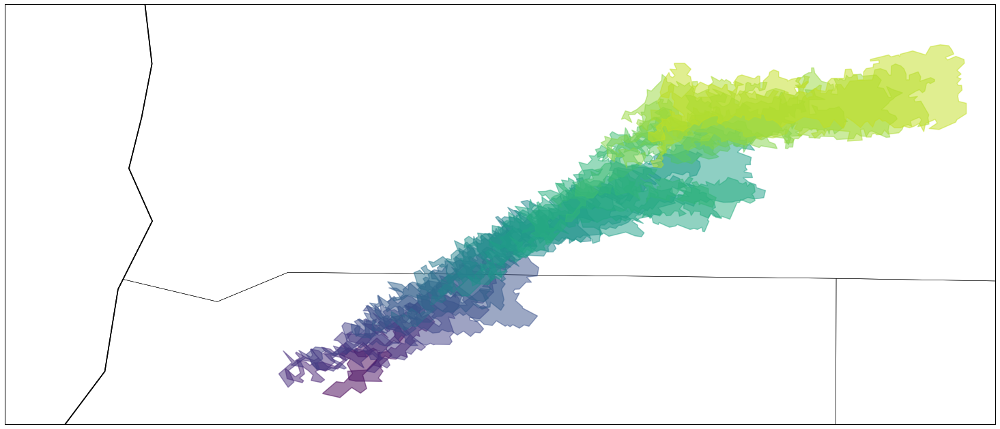

In [57]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL[0],UR[0],LL[1],UR[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
polygons = []
for i in range(len(arcshapefiles)):
    arc = ax.add_feature(arcshapefilesc[i], edgecolor = plt.cm.viridis(i*8), facecolor = plt.cm.viridis(i*8), linewidth=1.5, alpha=0.5)
    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73, alpha=0.5, zorder=10)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)

#ax.add_feature(arcshapefiles[0], edgecolor = 'green', linewidth = 1.5)
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

In [58]:
# LL1 = crs.transform_point(cenlon-0.40,cenlat-0.10,ccrs.PlateCarree())
# UR1 = crs.transform_point(cenlon+0.23,cenlat+0.16,ccrs.PlateCarree())
LL1 = crs.transform_point(cenlon-0.60,cenlat-0.20,ccrs.PlateCarree())
UR1 = crs.transform_point(cenlon+0.03,cenlat+0.06,ccrs.PlateCarree())

0


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:46: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


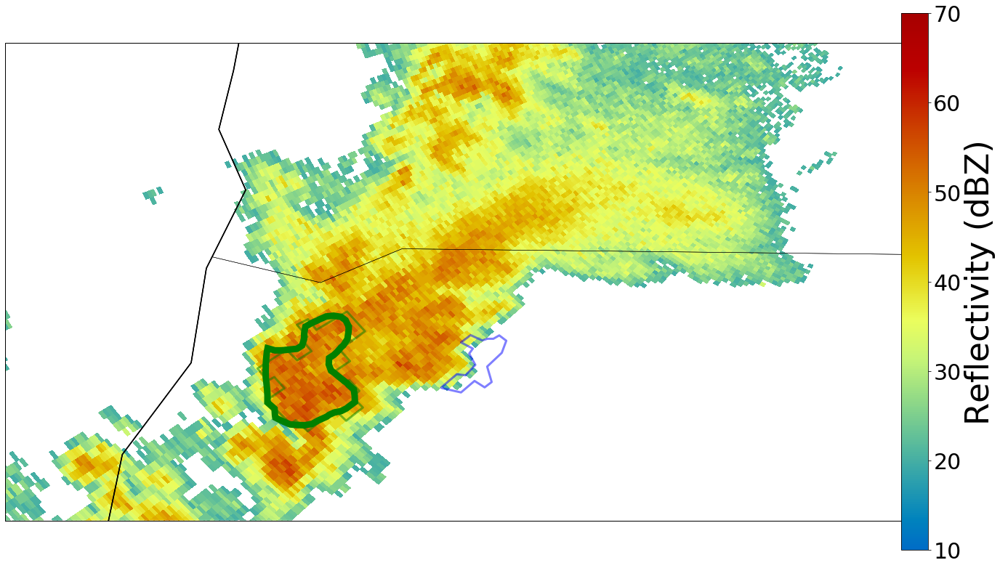

In [59]:
ik = 0

%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
refp = ax.pcolormesh(lon_arrays[ik+2], lat_arrays[ik+2], refl_arrays[ik+2], cmap=pyart.graph.cm_colorblind.HomeyerRainbow, vmin = 10, vmax = 70)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.viridis, vmin = 1, vmax = 7)
cg1 = plt.colorbar(refp, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Reflectivity (dBZ)",size = 45)

#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)

ax.add_feature(arcshapefiles[ik], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 3)
ax.add_feature(footshapefiles[ik], edgecolor = 'green', facecolor='none', alpha=0.5, linewidth = 3)

try:
    for k in range(len(arc_outlines4[ik+2])):
        print(k)
        patch = PathPatch(arc_outlines4[ik+2][k], facecolor = 'none', edgecolor='purple', linewidth=9)
        ax.add_patch(patch)
except:
    print('oops')
    
try:
    for k in range(len(foot_outlines1[ik+2])):
        print(k)
        patch = PathPatch(foot_outlines1[ik+2][k], facecolor = 'none', edgecolor='green', linewidth=9)
        ax.add_patch(patch)
except:
    print('oops')
plt.tight_layout()
#plt.savefig('PaperRefl.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

In [60]:
print(len(arc_outlines4[ik+2]))

0


In [61]:
print(polygons[0])

0
0
1


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:49: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


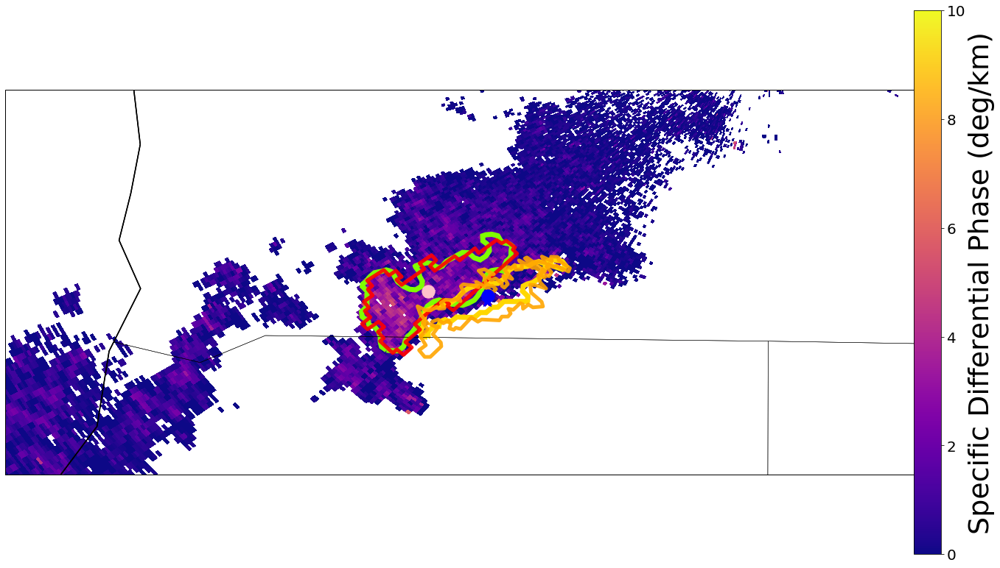

In [62]:
#Let's figure out which times don't have overlap
#Missing index 1 but should be able to recreate it
#Actually missing index 4 (2335), 18 (2358), 19 (0000), 37 (0029) 
LL = crs.transform_point(cenlon-0.55,cenlat-0.12,ccrs.PlateCarree())
UR = crs.transform_point(cenlon+0.25,cenlat+0.12,ccrs.PlateCarree())
ind_kdp = 15
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL[0],UR[0],LL[1],UR[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
refp = ax.pcolormesh(lon_arrays[ind_kdp+2], lat_arrays[ind_kdp+2], kdp_arrays[ind_kdp+2], cmap=plt.cm.plasma, vmin = 0, vmax = 10)
cg = plt.colorbar(refp, shrink=0.80, pad=0)
cg.ax.tick_params(labelsize=20)
cg.set_label("Specific Differential Phase (deg/km)",size = 38)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
foot = ax.add_feature(footshapefilesc[ind_kdp], edgecolor = 'red', linewidth=5, alpha=0.9)
arc = ax.add_feature(arcshapefilesc[ind_kdp], edgecolor = 'orange', linewidth=5, alpha=0.9)

#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
for i in range(len(foot_outlines1[ind_kdp+2])):
    print(i)
    patch = PathPatch(foot_outlines1[ind_kdp+2][i], facecolor = 'none', edgecolor='chartreuse', linewidth=7)
    ax.add_patch(patch)
for k in range(len(arc_outlines4[ind_kdp+2])):
    print(k)
    patch = PathPatch(arc_outlines4[ind_kdp+2][k], facecolor = 'none', edgecolor='gold', linewidth=7)
    ax.add_patch(patch)
plt.scatter(arc_clonsc[ind_kdp], arc_clatsc[ind_kdp], s=300, marker='*', color='blue', zorder=13)
plt.scatter(foot_clonsc[ind_kdp], foot_clatsc[ind_kdp], s=300, marker='*', color='pink', zorder=13)

plt.scatter(arc_alg_cenlons[ind_kdp+2], arc_alg_cenlats[ind_kdp+2], s=300, marker='o', color='blue', zorder=13)
plt.scatter(foot_alg_cenlons[ind_kdp+2], foot_alg_cenlats[ind_kdp+2], s=300, marker='o', color='pink', zorder=13)

plt.tight_layout()
#plt.savefig('TalkZDR.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


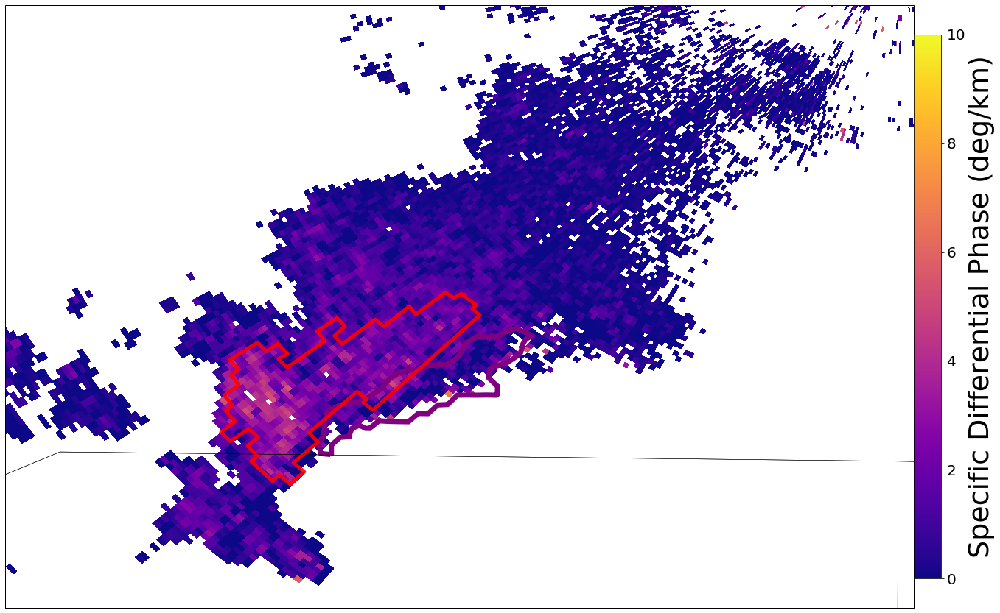

In [63]:
LL1 = crs.transform_point(cenlon-0.35,cenlat-0.10,ccrs.PlateCarree())
UR1 = crs.transform_point(cenlon+0.13,cenlat+0.16,ccrs.PlateCarree())
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
refp = ax.pcolormesh(lon_arrays[17], lat_arrays[17], kdp_arrays[17], cmap=plt.cm.plasma, vmin = 0, vmax = 10)
cg = plt.colorbar(refp, shrink=0.80, pad=0)
cg.ax.tick_params(labelsize=20)
cg.set_label("Specific Differential Phase (deg/km)",size = 38)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
arc = ax.add_feature(footshapefilesc[15], edgecolor = 'red', linewidth=5, alpha=0.9)
#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
patch = PathPatch(arc_outlines4[17][0], facecolor = 'none', edgecolor='purple', linewidth=7)
ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('TalkZDR.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:29: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


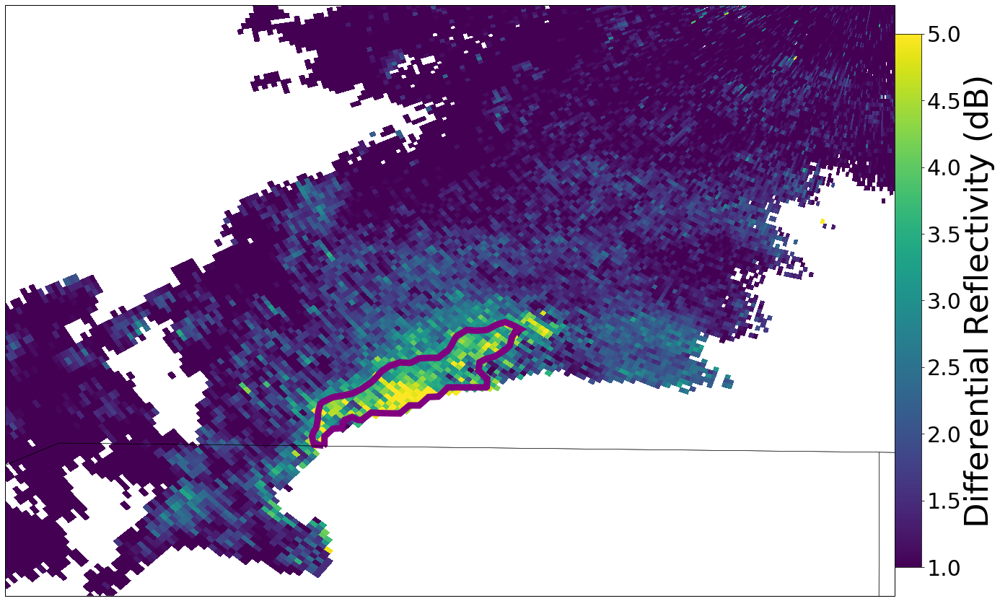

In [64]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
refp = ax.pcolormesh(lon_arrays[17], lat_arrays[17], zdr_arrays[17], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
cg = plt.colorbar(refp, shrink=0.80, pad=0)
cg.ax.tick_params(labelsize=30)
cg.set_label("Differential Reflectivity (dB)",size = 45)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)

#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
patch = PathPatch(arc_outlines4[17][0], facecolor = 'none', edgecolor='purple', linewidth=9)
ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('PaperZDR.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


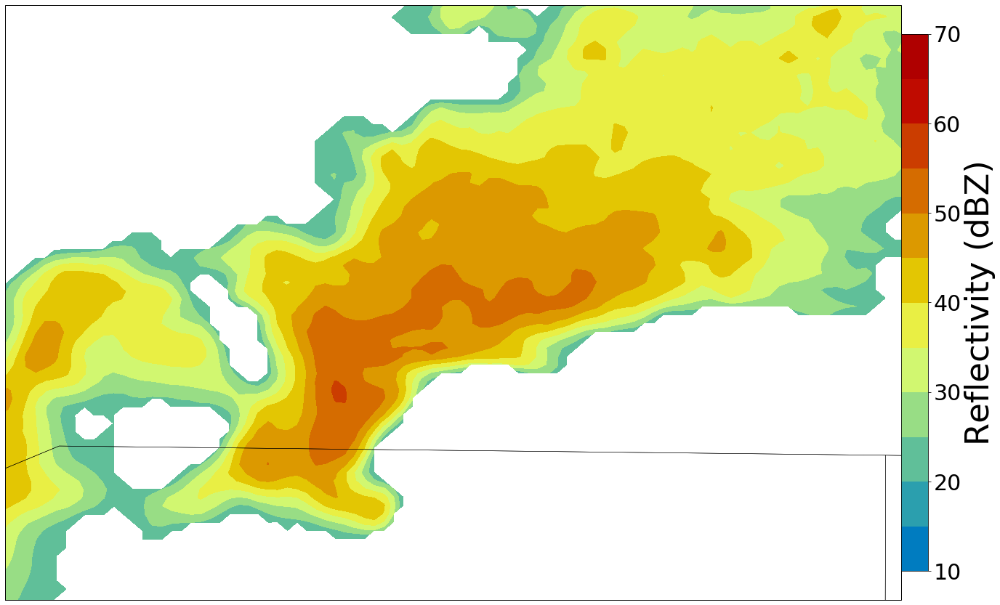

In [65]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
#refp = ax.pcolormesh(lon_arrays[51], lat_arrays[51], zdr_arrays[51], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
reflevs = np.arange(10, 75, 5)
refg = ax.contourf(rlons_2d, rlats_2d, REFmasked, reflevs, cmap=pyart.graph.cm_colorblind.HomeyerRainbow)
cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Reflectivity (dBZ)",size = 45)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)

#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
#patch = PathPatch(arc_outlines4[35][0], facecolor = 'none', edgecolor='purple', linewidth=7)
#ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('PapergridZ.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:36: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


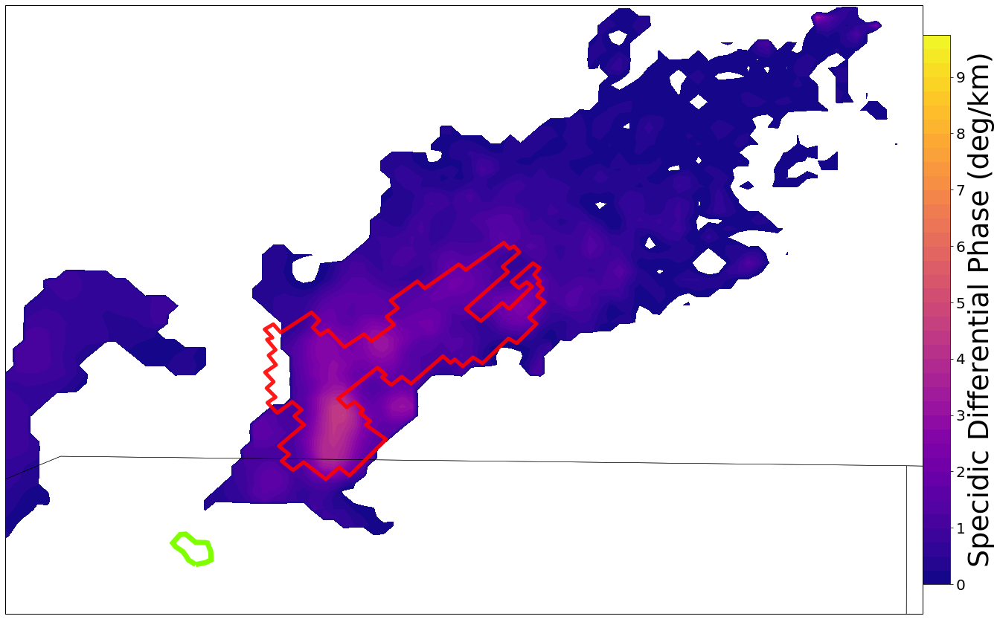

In [66]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
ind_kdp=15
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
#refp = ax.pcolormesh(lon_arrays[51], lat_arrays[51], zdr_arrays[51], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
kdplevs = np.arange(0, 10, 0.25)
kdp_clev = [1.5]
refg = ax.contourf(rlons_2d, rlats_2d, KDPmasked, kdplevs, cmap=plt.cm.plasma)
cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=20)
cg1.set_label("Specidic Differential Phase (deg/km)",size = 38)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
arc = ax.add_feature(footshapefilesc[ind_kdp+2], edgecolor = 'red', linewidth=5, alpha=0.9)
patch = PathPatch(foot_outlines1[ind_kdp][0], facecolor = 'none', edgecolor='chartreuse', linewidth=7)
ax.add_patch(patch)
#ax.contour(rlons_2d, rlats_2d, KDPmasked, kdp_clev, colors='green', linewidths=5)
#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
#patch = PathPatch(arc_outlines4[35][0], facecolor = 'none', edgecolor='purple', linewidth=7)
#ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('TalkgridZDR.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


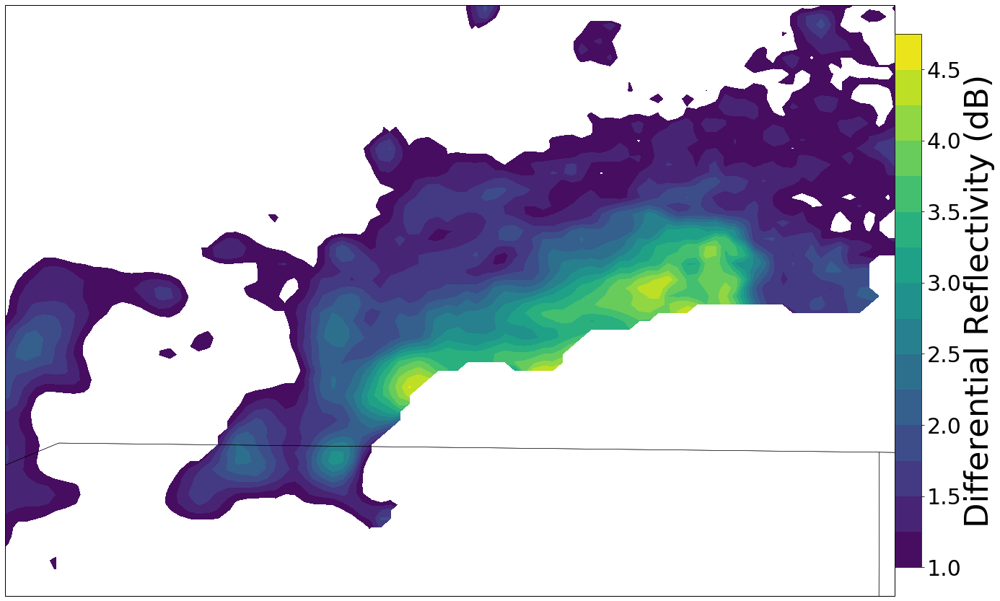

In [67]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
#refp = ax.pcolormesh(lon_arrays[51], lat_arrays[51], zdr_arrays[51], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
zdrlevs = np.arange(1, 5, 0.25)
refg = ax.contourf(rlons_2d, rlats_2d, ZDRmasked1, zdrlevs, cmap=plt.cm.viridis)
cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Differential Reflectivity (dB)",size = 45)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)

#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
#patch = PathPatch(arc_outlines4[35][0], facecolor = 'none', edgecolor='purple', linewidth=7)
#ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('PapergridZDR.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


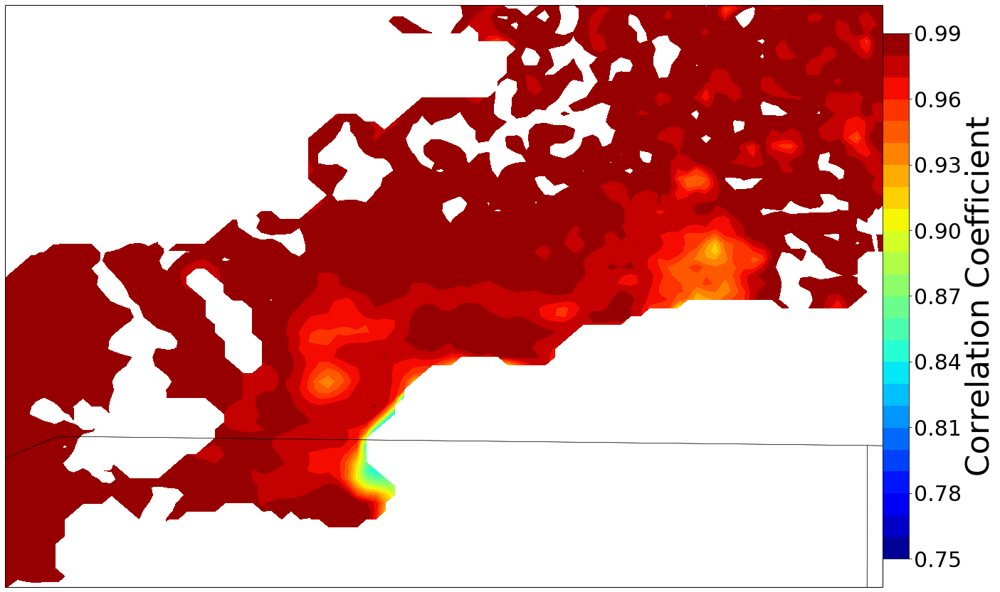

In [68]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
#refp = ax.pcolormesh(lon_arrays[51], lat_arrays[51], zdr_arrays[51], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
CClevs = np.arange(0.75, 1, 0.01)
refg = ax.contourf(rlons_2d, rlats_2d, CCmasked, CClevs, cmap=plt.cm.jet)
cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Correlation Coefficient",size = 45)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)

#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
#patch = PathPatch(arc_outlines4[35][0], facecolor = 'none', edgecolor='purple', linewidth=7)
#ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('PapergridCC.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

In [69]:
smoothed_ref1 = ndi.gaussian_filter(REFmasked, sigma = 2, order = 0)
#      smoothed_ref1 = ndi.gaussian_filter(REF, sigma = 2, order = 0)
#     print ('smoothed')
REFgradient = np.asarray(np.gradient(smoothed_ref1))

# REFgradient = np.asarray(np.gradient(REF))
# REFgradient[0,:,:] = ma.masked_where(REF < 20., REFgradient[0,:,:])
#REFgradient[1,:,:] = ma.masked_where(REF < 20., REFgradient[1,:,:])
#    print('made it through gradient')
grad_dir1 = wind_direction(REFgradient[1,:,:] * units('m/s'), REFgradient[0,:,:] * units('m/s'))
grad_mag = wind_speed(REFgradient[1,:,:] * units('m/s'), REFgradient[0,:,:] * units('m/s'))
grad_dir = ma.masked_where(REF < 20, grad_dir1)
#Get difference between the gradient direction and the FFD gradient direction calculated earlier
srdir = 155
srirad = np.copy(srdir)*units('degrees').to('radian')
grad_dir = grad_dir*units('degrees').to('radian')
grad_ffd = np.abs(np.arctan2(np.sin(grad_dir-srirad), np.cos(grad_dir-srirad)))
#  print(grad_ffd)
#  print(np.max(grad_ffd))
#  print(np.min(grad_ffd))
grad_ffd = np.asarray(grad_ffd)*units('radian')
grad_ex = np.copy(grad_ffd)
grad_ffd = grad_ffd.to('degrees')
grad_ffd = ma.masked_where(REF < 20, grad_ffd)
grad_ffd = ma.filled(grad_ffd, fill_value=np.nan)

In [70]:
print(grad_ffd)

[[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:32: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


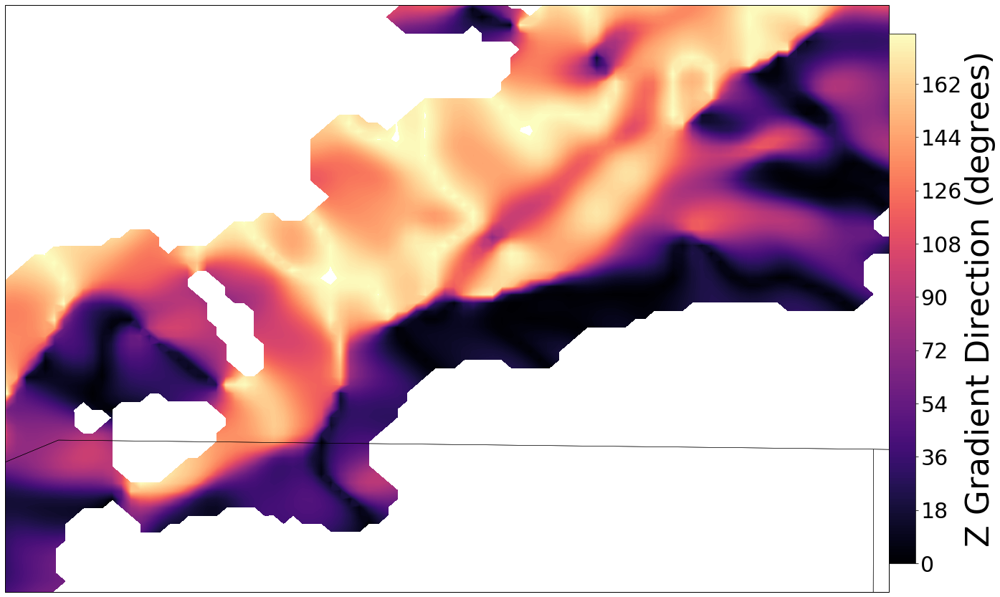

In [71]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
#refp = ax.pcolormesh(lon_arrays[51], lat_arrays[51], zdr_arrays[51], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
ffdlevs = np.arange(0, 180, 1)
refg = ax.contourf(rlons_2d, rlats_2d, grad_ffd, ffdlevs, cmap=plt.cm.magma)
cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Z Gradient Direction (degrees)",size = 45)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refc = ax.contour(rlons_2d, rlats_2d, grad_ffd, [60], color='purple', linewidths=7)

#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
#patch = PathPatch(arc_outlines4[35][0], facecolor = 'none', edgecolor='purple', linewidth=7)
#ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('PapergridGrad.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\cartopy\mpl\geoaxes.py:1366: UserWarning: The following kwargs were not used by contour: 'color'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:32: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


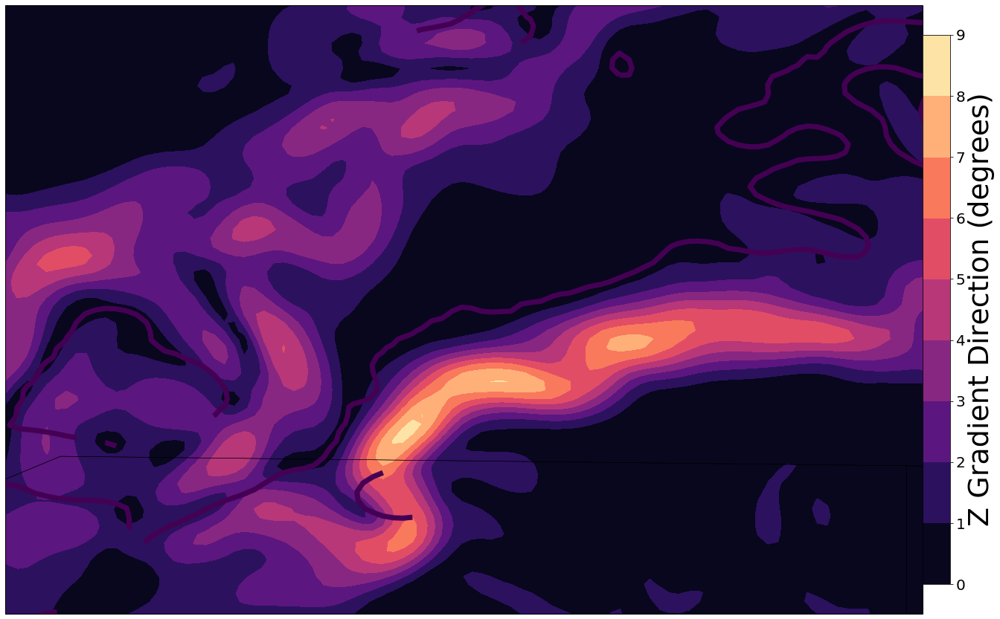

In [72]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
#refp = ax.pcolormesh(lon_arrays[51], lat_arrays[51], zdr_arrays[51], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
ffdlevs = np.arange(0, 10, 1)
refg = ax.contourf(rlons_2d, rlats_2d, grad_mag, ffdlevs, cmap=plt.cm.magma)
cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=20)
cg1.set_label("Z Gradient Direction (degrees)",size = 38)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
refc = ax.contour(rlons_2d, rlats_2d, grad_ffd, [60], color='purple', linewidths=7)

#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
#patch = PathPatch(arc_outlines4[35][0], facecolor = 'none', edgecolor='purple', linewidth=7)
#ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('TalkgridGrad.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

In [73]:
print(grad_ffd)

[[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]


In [74]:
#Mask out areas where the difference between the two is too large and the ZDR is likely not in the forward flank
ZDRmasked2 = ma.masked_where(grad_ffd > 120, ZDRmasked1)
ZDRmasked = ma.masked_where(CC < .60, ZDRmasked2)
#Add a fill value for the ZDR mask so that contours will be closed
ZDRmasked3 = ma.filled(ZDRmasked, fill_value = -2)

C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


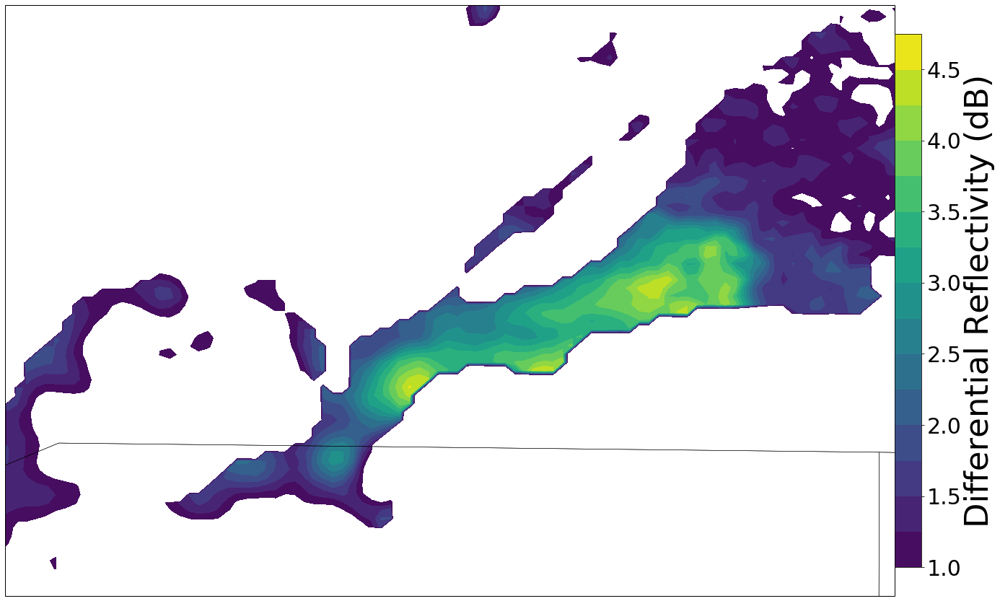

In [75]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
#refp = ax.pcolormesh(lon_arrays[51], lat_arrays[51], zdr_arrays[51], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
zdrlevs = np.arange(1, 5, 0.25)
refg = ax.contourf(rlons_2d, rlats_2d, ZDRmasked3, zdrlevs, cmap=plt.cm.viridis)
cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Differential Reflectivity (dB)",size = 45)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)

#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
#patch = PathPatch(arc_outlines4[35][0], facecolor = 'none', edgecolor='purple', linewidth=7)
#ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('PapergridZDRmask.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:32: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


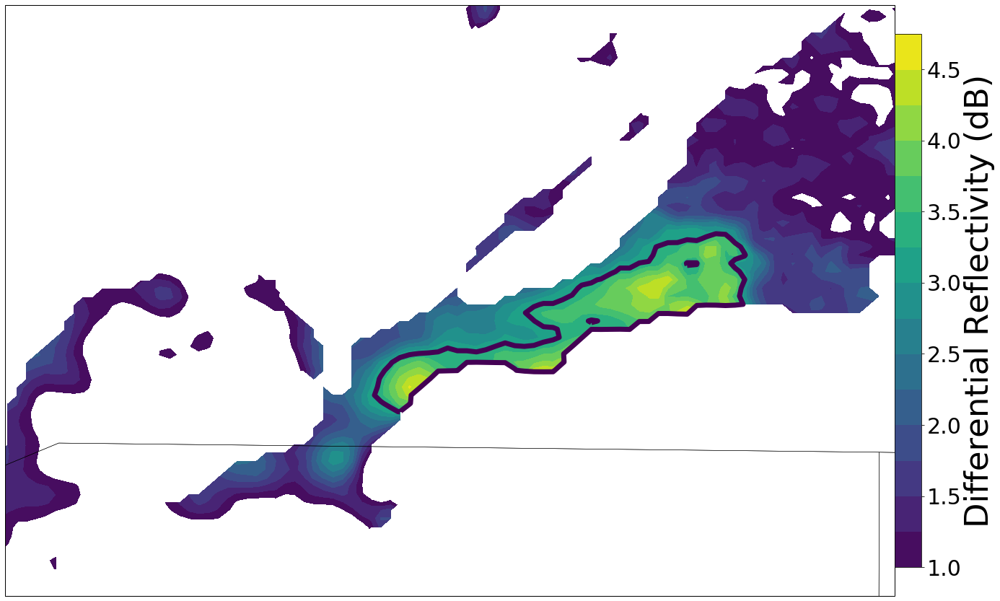

In [76]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
#refp = ax.pcolormesh(lon_arrays[51], lat_arrays[51], zdr_arrays[51], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
zdrlevs = np.arange(1, 5, 0.25)
refg = ax.contourf(rlons_2d, rlats_2d, ZDRmasked, zdrlevs, cmap=plt.cm.viridis)
cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Differential Reflectivity (dB)",size = 45)
refc = ax.contour(rlons_2d, rlats_2d, ZDRmasked3, [3.25], color='purple', linewidths=7)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)

#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
#patch = PathPatch(arc_outlines4[35][0], facecolor = 'none', edgecolor='purple', linewidth=7)
#ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('PapergridZDRmaskc.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

In [77]:
#pr_area1 = (transform(proj, arcshapefiles[1]).area * units('m^2')).to('km^2')

In [78]:
import geopandas
file1 = geopandas.read_file('ZDRarcshapefiles/ARCKINX0001.shp')

In [79]:
filematrix = file1['geometry']

In [80]:
print(filematrix[0])

POLYGON ((-96.00969805384136 36.3278398552242, -95.99947618252472 36.3278398552242, -95.99509538053188 36.31761798390756, -95.99436524686641 36.3081262462564, -95.99144471220451 36.29717424127429, -95.99144471220451 36.2854921026267, -96.00458711818304 36.27234969664817, -96.02065005882348 36.26504835999343, -96.03817326679486 36.25628675600774, -96.05715674209718 36.24752515202205, -96.07614021739953 36.23876354803636, -96.09731409369826 36.23219234504709, -96.10899623234585 36.22927181038519, -96.10534556401848 36.24022381536731, -96.09950449469468 36.24752515202205, -96.10388529668752 36.25044568668395, -96.11994823732796 36.24095394903278, -96.12359890565533 36.24679501835657, -96.10534556401848 36.25482648867679, -96.09293329170541 36.25993742433511, -96.08052101939235 36.26431822632795, -96.06591834608287 36.27307983031364, -96.05058553910791 36.28330170163028, -96.03890340046033 36.29206330561597, -96.03233219747106 36.30447557792903, -96.02503086081632 36.30885637992188, -96.00

In [81]:
pr_area1 = (transform(proj, filematrix[0]).area * units('m^2')).to('km^2')

In [82]:
print(pr_area1)

65.46454533525565 kilometer ** 2


In [185]:
#Read the pickle file from the algorithm for this case
alg_325 = pd.read_pickle('ARCDEV_newforest20191216KPOE.pkl')
storm1 = alg_325.xs(2, level = 1)
storm1_alg_f = np.asarray(storm1['zdr_area'].iloc[:])
storm1_mean_f = np.asarray(storm1['zdr_mean'].iloc[:])
storm1_max_f = np.asarray(storm1['zdr_10max'].iloc[:])

#Read the pickle file from the algorithm for this case
# alg_350 = pd.read_pickle('Shape_Comparison_Case3502016331KINX.pkl')
# storm2 = alg_350.xs(1, level = 1)
# storm2_alg_f = np.asarray(storm2['zdr_area'].iloc[:])

# #Read the pickle file from the algorithm for this case
# alg_3503 = pd.read_pickle('Shape_Comparison_Case3502016330KINX.pkl')
# storm3 = alg_3503.xs(2, level = 1)
# storm3_alg_f = np.asarray(storm3['zdr_area'].iloc[:])

# #Read the pickle file from the algorithm for this case
# alg_3253 = pd.read_pickle('Shape_Comparison_Case2016330KINX.pkl')
# storm4 = alg_3253.xs(2, level = 1)
# storm4_alg_f = np.asarray(storm4['zdr_area'].iloc[:])

# #Read the pickle file from the algorithm for this case
# alg_32590 = pd.read_pickle('CI_TOR902016330KINX.pkl')
# storm5 = alg_32590.xs(2, level = 1)
# storm5_alg_f = np.asarray(storm5['zdr_area'].iloc[:])

In [186]:
print(alg_3253.xs(35, level=0)['storm_lon'])
storm_lons = alg_3253.xs(35, level=0)['storm_lon']
storm_lats = alg_3253.xs(35, level=0)['storm_lat']

storm_id
2    -95.824665
26   -95.801351
11   -95.658850
25   -96.321912
21   -96.212078
6    -95.665000
23   -96.062670
23   -96.051166
24   -95.888923
14   -95.482947
5    -96.037217
Name: storm_lon, dtype: float64


In [187]:
print(storm_lons.index.values)
storm_ids = storm_lons.index.values

[ 2 26 11 25 21  6 23 23 24 14  5]


In [188]:
print(storm_lons.values[0])

-95.82466497908534


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:36: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


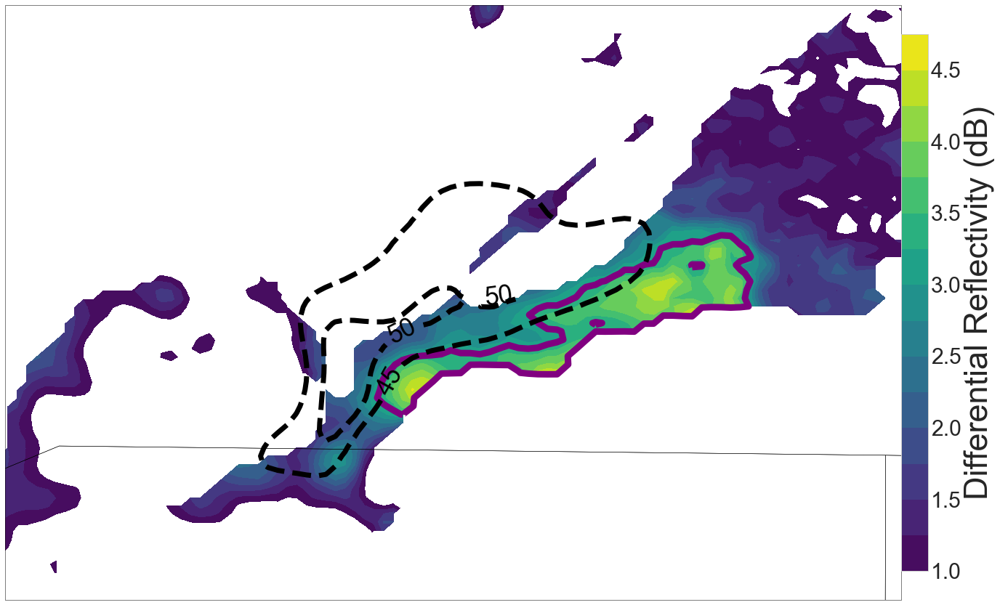

In [189]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
#refp = ax.pcolormesh(lon_arrays[51], lat_arrays[51], zdr_arrays[51], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
zdrlevs = np.arange(1, 5, 0.25)
refg = ax.contourf(rlons_2d, rlats_2d, ZDRmasked, zdrlevs, cmap=plt.cm.viridis)
cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Differential Reflectivity (dB)",size = 45)
refc = ax.contour(rlons_2d, rlats_2d, ZDRmasked3, [3.25], colors='purple', linewidths=9)
z =  ax.contour(rlons_2d, rlats_2d, smoothed_ref1, [45, 50], colors='k', linewidths=7, linestyles = '--')
plt.clabel(z, fontsize=35, inline=1, inline_spacing=10, fmt='%i', rightside_up=True, use_clabeltext=True)

#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.scatter(storm_lons, storm_lats, s=2000, color='k', zorder=10)
#ax.text(storm_lons.values[0]+0.0095, storm_lats.values[0]+0.0095, 'Storm '+str(storm_ids[0]), size = 40, color='red')
#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
#patch = PathPatch(arc_outlines4[35][0], facecolor = 'none', edgecolor='purple', linewidth=7)
#ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('PapergridZDRmaskcstorms.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

In [190]:
print(storm3_alg_f.shape)
print(storm3)

(40,)
      kdp_zdr_angle  kdp_zdr_sep  storm_id1  storm_lat  storm_lon  \
scan                                                                
0          0.000000     0.000000          2  36.273842 -96.330436   
1         32.470352     6.687935          2  36.278076 -96.317956   
2        -19.875502     5.659109          2  36.282260 -96.299022   
3        -68.036342     6.285633          2  36.290632 -96.279615   
4        -36.447610     4.373318          2  36.300293 -96.259575   
5        -52.601871     6.239279          2  36.304565 -96.244920   
6          0.000000     0.000000          2  36.307068 -96.235513   
7          0.000000     0.000000          2  36.304999 -96.229923   
8          0.000000     0.000000          2  36.298661 -96.221792   
9        -60.954116     7.136868          2  36.299098 -96.209316   
10       -63.194358     8.110257          2  36.299486 -96.201950   
11       -65.507861     9.426191          2  36.301148 -96.192103   
12         0.000000     0.00

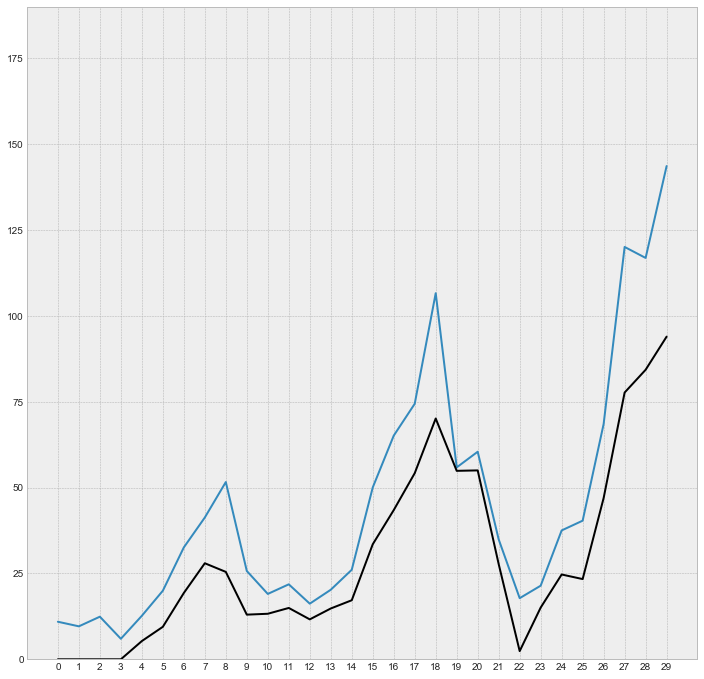

In [191]:
plt.style.use('bmh')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(arcshapefiles), 1)
x2 = np.arange(0, len(storm1_alg_f), 1)
plt.plot(x, np.asarray(areas))
plt.plot(x2[2:32]-2, storm1_alg_f[2:32], color='k')
#plt.plot(x, storm2_alg_f[0:20])
#plt.plot(x, storm5_alg_f[0:20])


#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])

plt.ylim(0, 190)
plt.xticks(x)
plt.show()

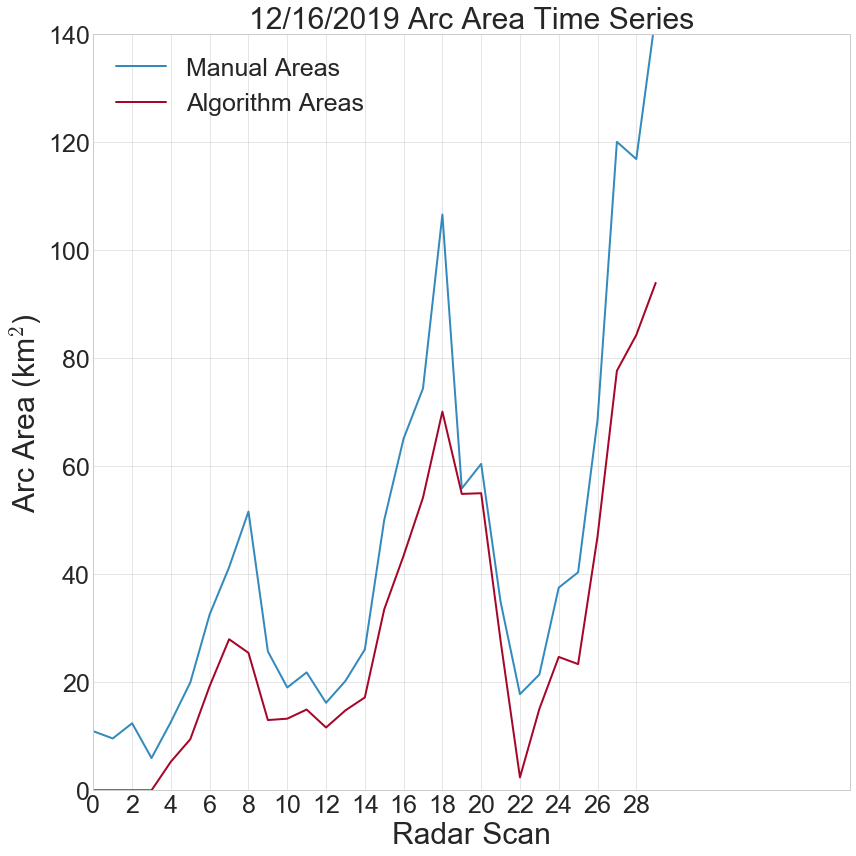

In [192]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(arcshapefilesc), 1)
x2 = np.arange(0, len(storm1_alg_f), 1)
plt.plot(x, np.asarray(areasc), label='Manual Areas')
#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
plt.plot(x2[2:32]-2, storm1_alg_f[2:32], label='Algorithm Areas')
#plt.plot(x, storm5_alg_f[0:40], label='Algorithm Areas')

plt.title('12/16/2019 Arc Area Time Series', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('Radar Scan', size=30)
plt.ylabel('Arc Area (km$^2$)', size=30)
plt.ylim(0, 140)
plt.xlim(0, 39)
plt.xticks(x[::2], size=25)
plt.yticks(size=25)
plt.legend(fontsize=25)
plt.tight_layout()
#plt.savefig('PaperArcTimeSeries.png')
plt.show()

In [193]:
print(arctextc)
print(len(arctextc))

['arcscan01.shp', 'arcscan02.shp', 'arcscan03.shp', 'arcscan04.shp', 'arcscan05.shp', 'arcscan06.shp', 'arcscan07.shp', 'arcscan08.shp', 'arcscan09.shp', 'arcscan10.shp', 'arcscan11.shp', 'arcscan12.shp', 'arcscan13.shp', 'arcscan14.shp', 'arcscan15.shp', 'arcscan16.shp', 'arcscan17.shp', 'arcscan18.shp', 'arcscan19.shp', 'arcscan20.shp', 'arcscan21.shp', 'arcscan22.shp', 'arcscan23.shp', 'arcscan24.shp', 'arcscan25.shp', 'arcscan26.shp', 'arcscan27.shp', 'arcscan28.shp', 'arcscan29.shp', 'arcscan30.shp']
30


In [194]:
print(storm3['times'].iloc[:])

scan
0    2016-03-30 23:29:00.664
1    2016-03-30 23:30:22.717
2    2016-03-30 23:32:15.255
3    2016-03-30 23:33:53.287
4    2016-03-30 23:35:51.688
5    2016-03-30 23:37:40.281
6    2016-03-30 23:39:00.713
7    2016-03-30 23:40:33.013
8    2016-03-30 23:42:13.109
9    2016-03-30 23:44:06.118
10   2016-03-30 23:45:28.196
11   2016-03-30 23:47:04.379
12   2016-03-30 23:48:44.572
13   2016-03-30 23:50:33.159
14   2016-03-30 23:51:53.553
15   2016-03-30 23:53:26.341
16   2016-03-30 23:55:07.043
17   2016-03-30 23:57:05.075
18   2016-03-30 23:58:14.451
19   2016-03-31 00:00:05.646
20   2016-03-31 00:01:50.283
21   2016-03-31 00:03:43.475
22   2016-03-31 00:05:05.472
23   2016-03-31 00:06:39.348
24   2016-03-31 00:08:20.865
25   2016-03-31 00:10:14.024
26   2016-03-31 00:11:36.134
27   2016-03-31 00:13:11.593
28   2016-03-31 00:14:53.413
29   2016-03-31 00:16:41.832
30   2016-03-31 00:18:02.568
31   2016-03-31 00:19:36.634
32   2016-03-31 00:21:16.770
33   2016-03-31 00:23:14.778
34   2016

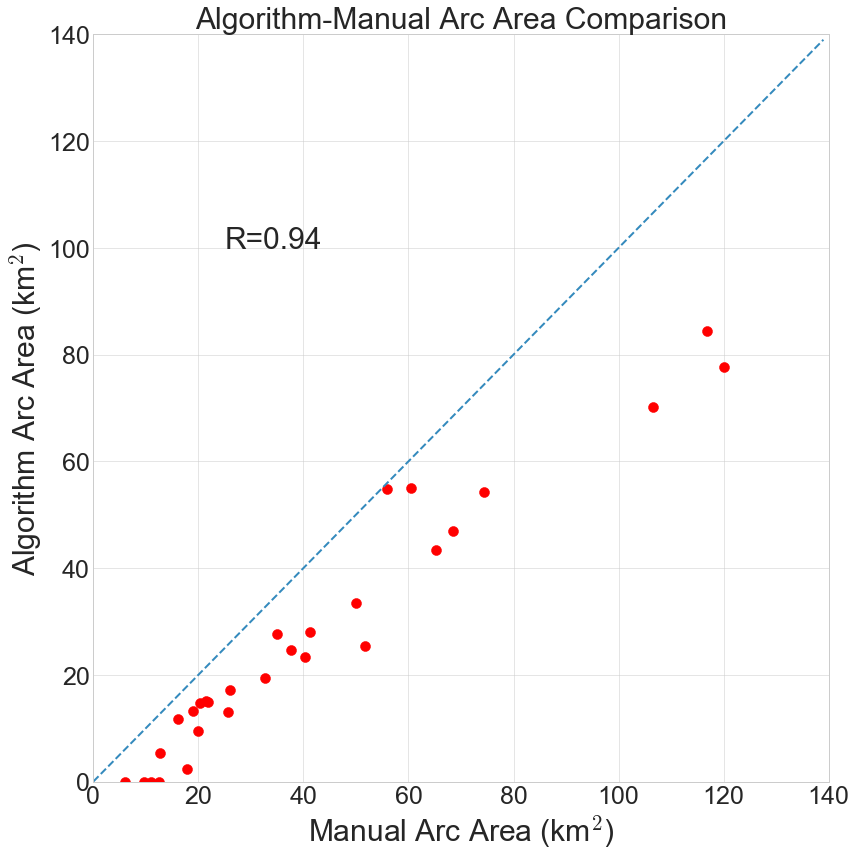

In [195]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
#x = np.arange(0, len(arcshapefiles[1:21]), 1)
#plt.scatter(np.asarray(areasc), storm3_alg_f[0:40], label='3.5 dB Alg')
plt.scatter(np.asarray(areasc), storm1_alg_f[2:32], color='r', s=100, alpha=1.0)
#plt.scatter(np.asarray(areasc), storm5_alg_f[0:40], color='g', s=100, alpha=0.5)

plt.xlim(0,140)
plt.ylim(0,140)
plt.xticks(size=25)
plt.yticks(size=25)
plt.xlabel('Manual Arc Area (km$^2$)', size=30)
plt.ylabel('Algorithm Arc Area (km$^2$)', size=30)
plt.title('Algorithm-Manual Arc Area Comparison', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
line = np.arange(0, 140, 1)
plt.plot(line, line, linestyle='--', linewidth=2)
plt.text(25, 100, 'R=0.94', size=30)
plt.tight_layout()
#plt.savefig('PaperAlgScatterVerif.png')
plt.show()

In [196]:
print(foot_alg_areas[2:32])

[46.51640661170878, 57.544092824393495, 59.85209115711176, 56.490319492135946, 45.31263027718928, 51.257802701722554, 58.338701975454235, 56.885220093309215, 63.16522578313504, 45.77796492401103, 55.29684075933228, 57.06812314559847, 69.26074218047374, 67.9036362439494, 67.66058889013443, 75.70953578622489, 86.07314540093485, 99.02487103826621, 87.40217923835583, 82.43222151576435, 94.9891504753549, 94.38898881756857, 105.44142617793405, 89.08049503735063, 83.05381444081104, 77.82724628266847, 71.18000327530613, 75.73009766048456, 66.0188989393182, 73.38542895784246]


In [197]:
print(footareasc)

[48.15237109945028, 59.30415356338226, 58.60647971901203, 54.56830590806896, 49.26288966579233, 57.81858518148776, 58.822892969608745, 45.94961039109062, 51.054165891388415, 41.08434700052287, 54.2842502673338, 62.96889235350593, 66.44587385897698, 60.85288666916136, 66.7619756866298, 77.94946829175646, 84.13429324407919, 96.31225277761895, 86.80399730536962, 89.41659992314243, 97.32802008212165, 97.13761570166592, 100.46627270605893, 92.35345494137351, 73.50242306256733, 79.84035920089072, 72.95409492844942, 87.2138791634836, 72.95734767708096, 74.02897930296544]


In [198]:
#print(np.asarray(footareasc) - np.asarray(foot_alg_areas))

In [199]:
import scipy.stats as stats

In [200]:
foot_areas_arr = np.asarray(np.asarray(footareasc))
foot_areas_arr1 = foot_areas_arr[~np.isnan(foot_areas_arr)]
foot_alg_areas1 = np.asarray(foot_alg_areas[2:32])
foot_alg_areas2 = foot_alg_areas1[~np.isnan(foot_areas_arr)]
foot_spr = stats.spearmanr(foot_areas_arr1, foot_alg_areas2)
print(foot_spr)

SpearmanrResult(correlation=0.9483870967741934, pvalue=1.6980999814928685e-15)


In [201]:
arc_spr = stats.spearmanr(np.asarray(areasc), storm1_alg_f[2:32])
print(arc_spr)

SpearmanrResult(correlation=0.9779516085931567, pvalue=1.3734253931749466e-20)


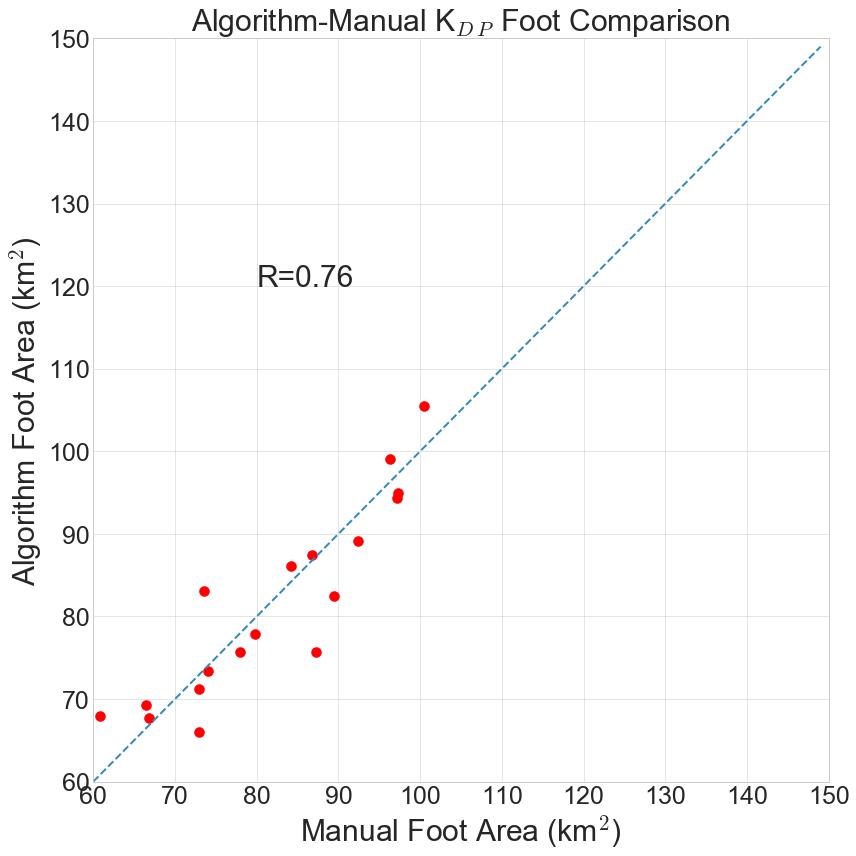

In [202]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
#x = np.arange(0, len(arcshapefiles[1:21]), 1)
#plt.scatter(np.asarray(areasc), storm3_alg_f[0:40], label='3.5 dB Alg')
plt.scatter(np.asarray(footareasc), foot_alg_areas[2:32], color='r', s=100, alpha=1.0)
#plt.scatter(np.asarray(areasc), storm5_alg_f[0:40], color='g', s=100, alpha=0.5)

plt.xlim(60,150)
plt.ylim(60,150)
plt.xticks(size=25)
plt.yticks(size=25)
plt.xlabel('Manual Foot Area (km$^2$)', size=30)
plt.ylabel('Algorithm Foot Area (km$^2$)', size=30)
plt.title('Algorithm-Manual K$_D$$_P$ Foot Comparison', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
line = np.arange(0, 150, 1)
plt.plot(line, line, linestyle='--', linewidth=2)
plt.text(80, 120, 'R=0.76', size=30)
plt.tight_layout()
#plt.savefig('PaperFootScatterVerif.png')
plt.show()

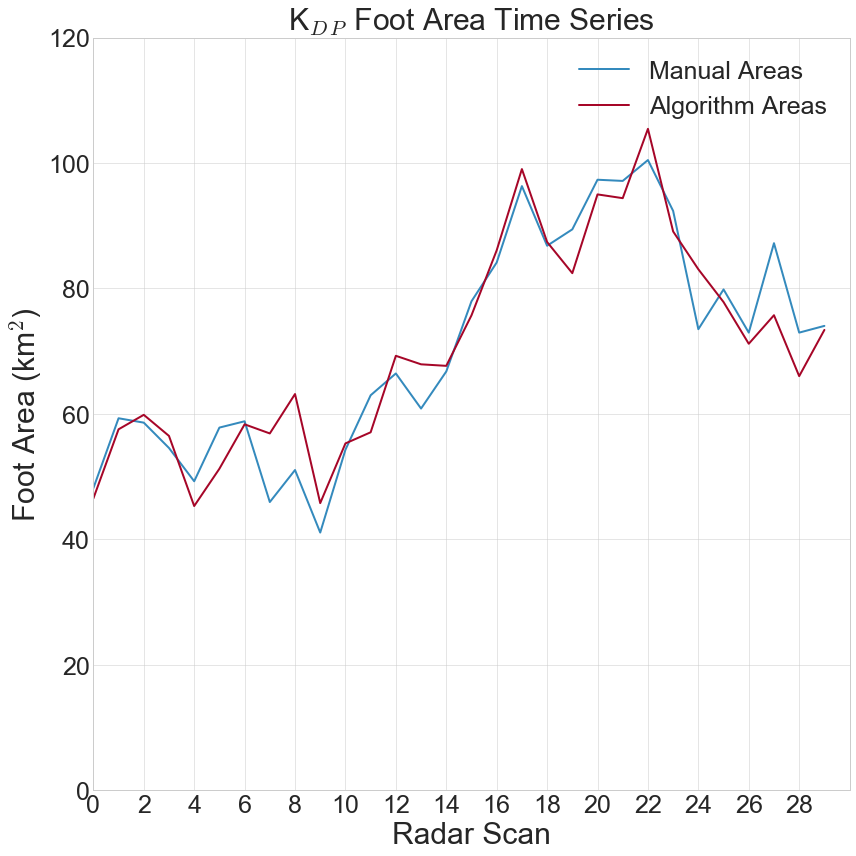

In [203]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(footshapefilesc), 1)
x2 = np.arange(0, len(foot_alg_areas), 1)
plt.plot(x, np.asarray(footareasc), label='Manual Areas')
#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
#plt.plot(x, storm4_alg_f[0:40], label='Algorithm Areas')
plt.plot(x2[2:32]-2, foot_alg_areas[2:32], label='Algorithm Areas')

plt.title('K$_D$$_P$ Foot Area Time Series', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('Radar Scan', size=30)
plt.ylabel('Foot Area (km$^2$)', size=30)
plt.ylim(0, 120)
plt.xlim(0, 30)
plt.xticks(x[::2], size=25)
plt.yticks(size=25)
plt.legend(fontsize=25)
plt.tight_layout()
#plt.savefig('PaperFootTimeSeries.png')
plt.show()

In [204]:
# print(stats.linregress(np.asarray(areasc), storm3_alg_f[0:40]))
# print(stats.linregress(np.asarray(areasc), storm4_alg_f[0:40]))
# print(stats.linregress(np.asarray(areasc), storm5_alg_f[0:40]))

In [205]:
# arc_outlines = pd.read_pickle('ZDRoutlines2016331KINX.pkl')
# arc_outlines2 = pd.read_pickle('ZDRoutlines3502016331KINX.pkl')
# arc_outlines3 = pd.read_pickle('ZDRoutlines3502016330KINX.pkl')
# arc_outlines4 = pd.read_pickle('ZDRoutlines2016330KINX.pkl')

In [206]:
print(len(arc_outlines4))

36


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:36: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


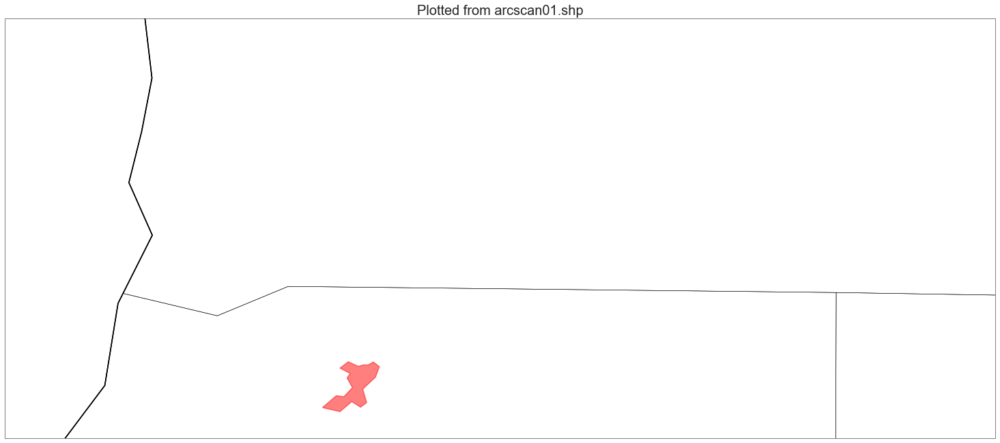

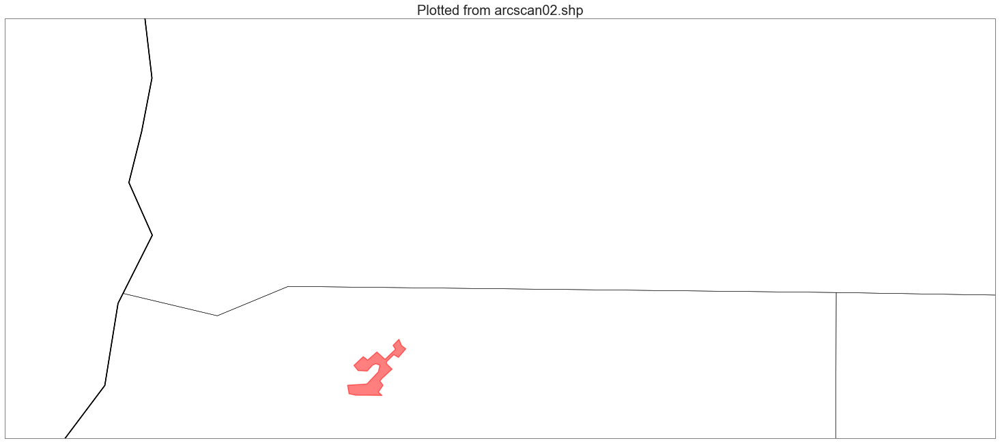

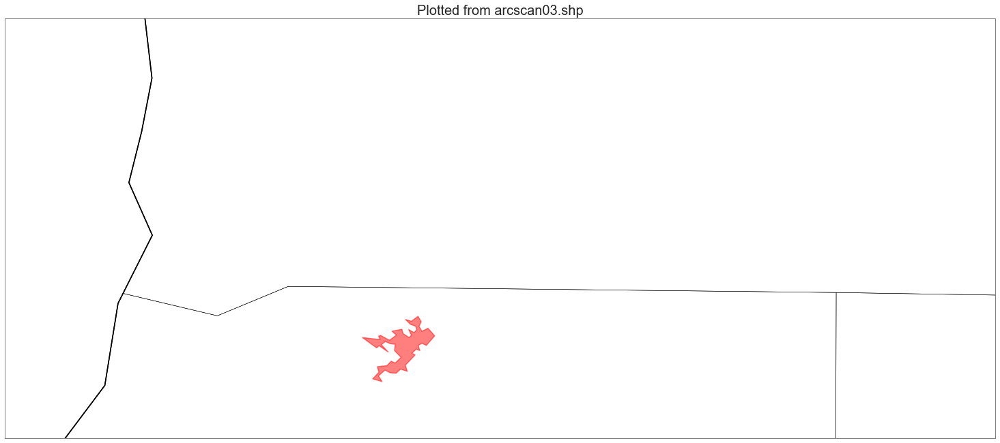

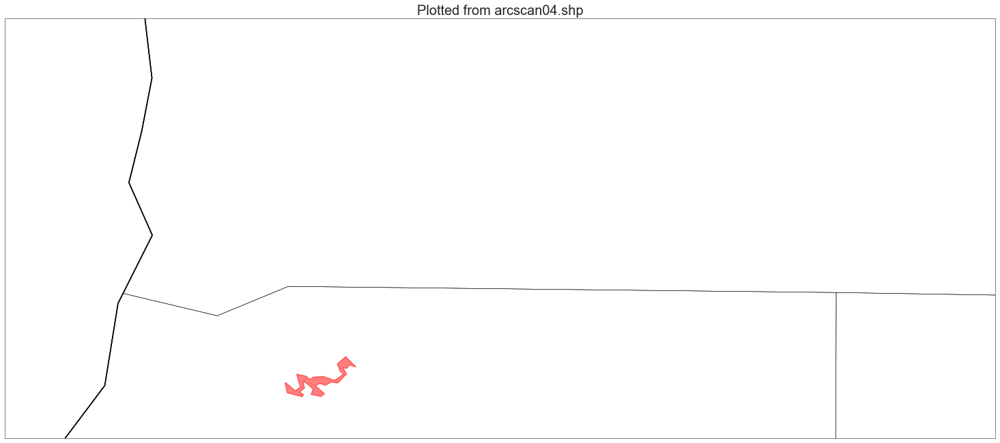

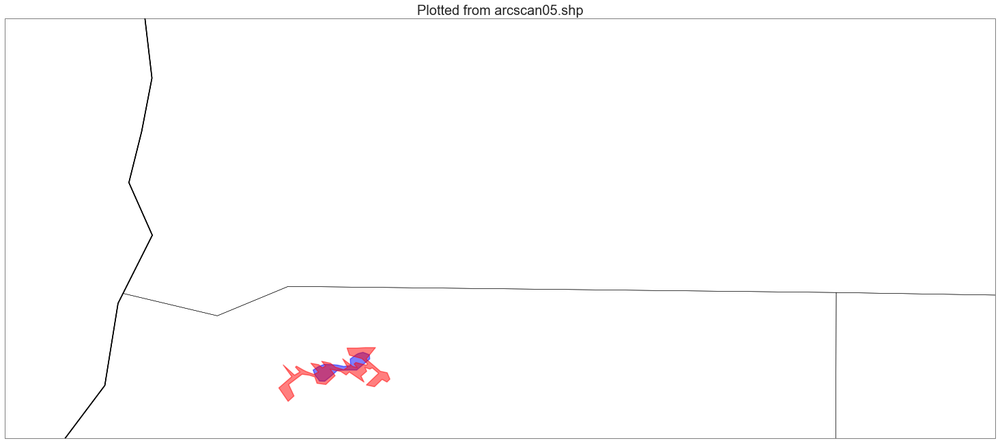

...

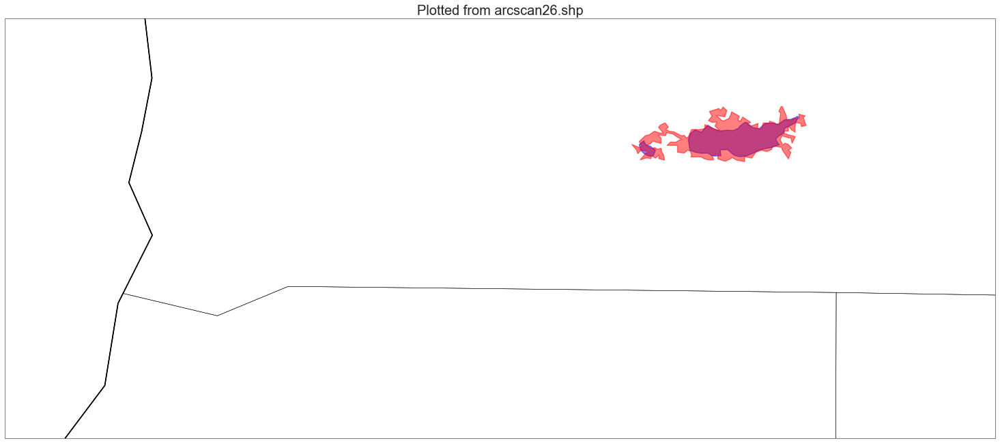

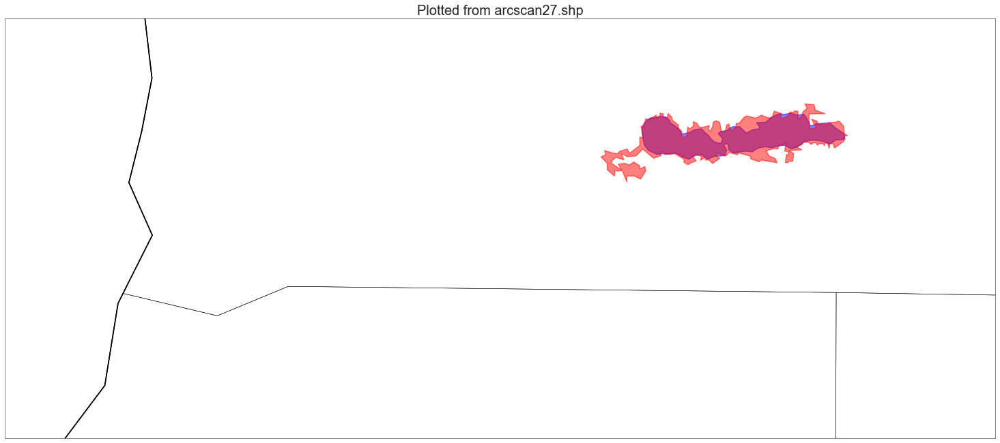

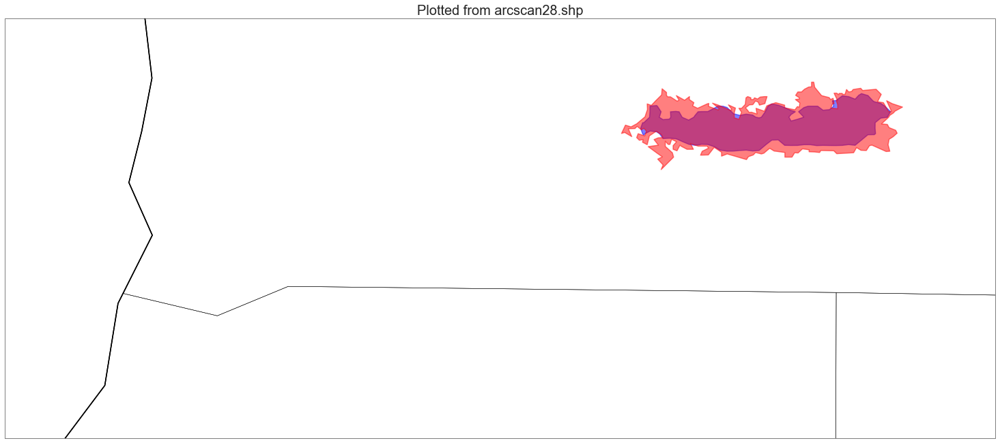

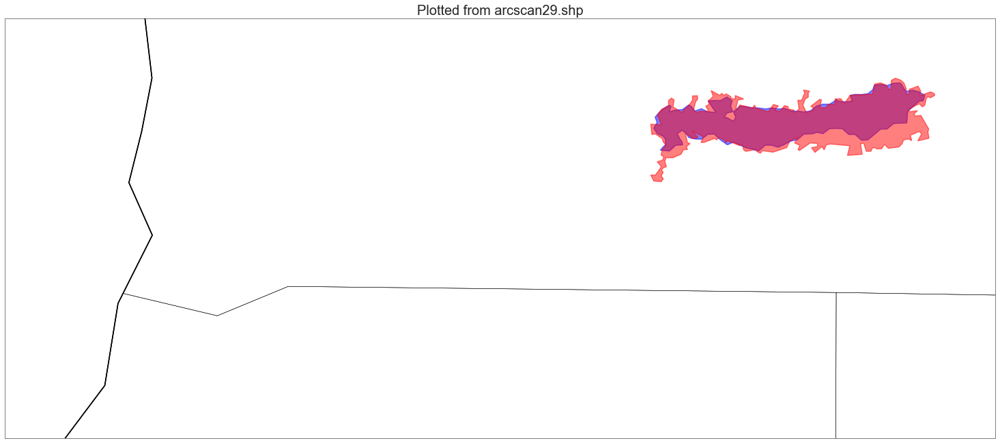

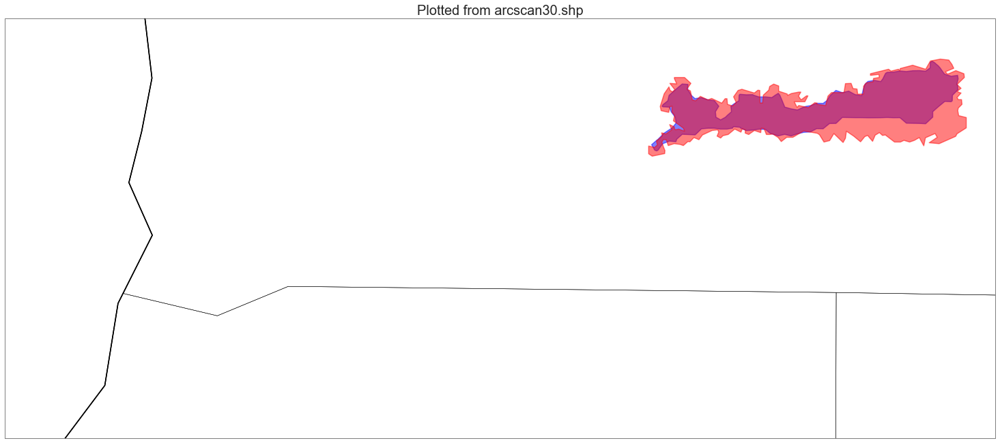

In [207]:
%matplotlib inline
#plt.style.use('bmh')
for l in range(len(arcshapefilesc)):

    fig=plt.figure(l+1,figsize=(26.,17.))
    ax = plt.subplot(111,projection=ccrs.PlateCarree())
    #   ax.set_extent([west long, east long, south lat, north lat])
    ax.set_extent([LL[0],UR[0],LL[1],UR[1]],crs)
    ax.coastlines('50m',edgecolor='black',linewidth=0.75)
    ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
    ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
    #ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
    #polygons = []
    #for i in range(len(arcshapefiles)):
    for i in [l]:
        arc = ax.add_feature(arcshapefilesc[i], edgecolor = 'red', facecolor = 'red', linewidth=1.5, alpha=0.5)
        polygons.append(arc)
    #refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73, alpha=0.5, zorder=10)
    #refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)

    #ax.add_feature(arcshapefiles[0], edgecolor = 'green', linewidth = 1.5)
    #ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
    #ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
    #ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
    k = 0
    #for i in range(len(arc_outlines)):
    try:
        for i in [l]:
            for j in range(len(arc_outlines4[i+2])):
                patch = PathPatch(arc_outlines4[i+2][j], facecolor = 'blue', alpha=0.5, edgecolor='blue', linewidth=1.5)
                ax.add_patch(patch)
                k = k + 1
    except:
        print('oops')
    plt.title('Plotted from '+str(arctextc[l]), size=20)
    plt.tight_layout()
    #plt.savefig('AlgObsCompF'+str(l)+'.png')
plt.show()

In [208]:
print(len(arc_outlines4[3]))

0


In [209]:
# %matplotlib inline
# #plt.style.use('bmh')
# for l in range(len(arcshapefiles)):

#     fig=plt.figure(l+1,figsize=(26.,17.))
#     ax = plt.subplot(111,projection=ccrs.PlateCarree())
#     #   ax.set_extent([west long, east long, south lat, north lat])
#     ax.set_extent([LL[0],UR[0],LL[1],UR[1]],crs)
#     ax.coastlines('50m',edgecolor='black',linewidth=0.75)
#     ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
#     ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#     #ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#     #polygons = []
#     #for i in range(len(arcshapefiles)):
#     for i in [l]:
#         arc = ax.add_feature(arcshapefiles[i], edgecolor = 'red', facecolor = 'red', linewidth=1.5, alpha=0.5)
#         polygons.append(arc)
#     #refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73, alpha=0.5, zorder=10)
#     #refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)

#     #ax.add_feature(arcshapefiles[0], edgecolor = 'green', linewidth = 1.5)
#     #ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#     #ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#     #ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
#     k = 0
#     #for i in range(len(arc_outlines)):
#     for i in [l]:
#         for j in range(len(arc_outlines2[0])):
#             patch = PathPatch(arc_outlines2[i][j], facecolor = 'green', alpha=0.5, edgecolor='green', linewidth=1.5)
#             ax.add_patch(patch)
#             k = k + 1
#     plt.tight_layout()
#     plt.savefig('AlgObsComp350'+str(l)+'.png')
# plt.show()

In [210]:
import pickle

In [211]:
VDB_arc_outlines = pickle.load( open( "VDB_arc_outlines.pkl", "rb" ) )
VDB_foot_outlines = pickle.load( open( "VDB_foot_outlines.pkl", "rb" ) )

VDB_arc_clons = pickle.load( open( "VDB_arc_lons.pkl", "rb" ) )
VDB_arc_clats = pickle.load( open( "VDB_arc_lats.pkl", "rb" ) )
VDB_foot_clons = pickle.load( open( "VDB_foot_lons.pkl", "rb" ) )
VDB_foot_clats = pickle.load( open( "VDB_foot_lats.pkl", "rb" ) )

Text(0.5, 1.0, '16:54 UTC / Scan 6')

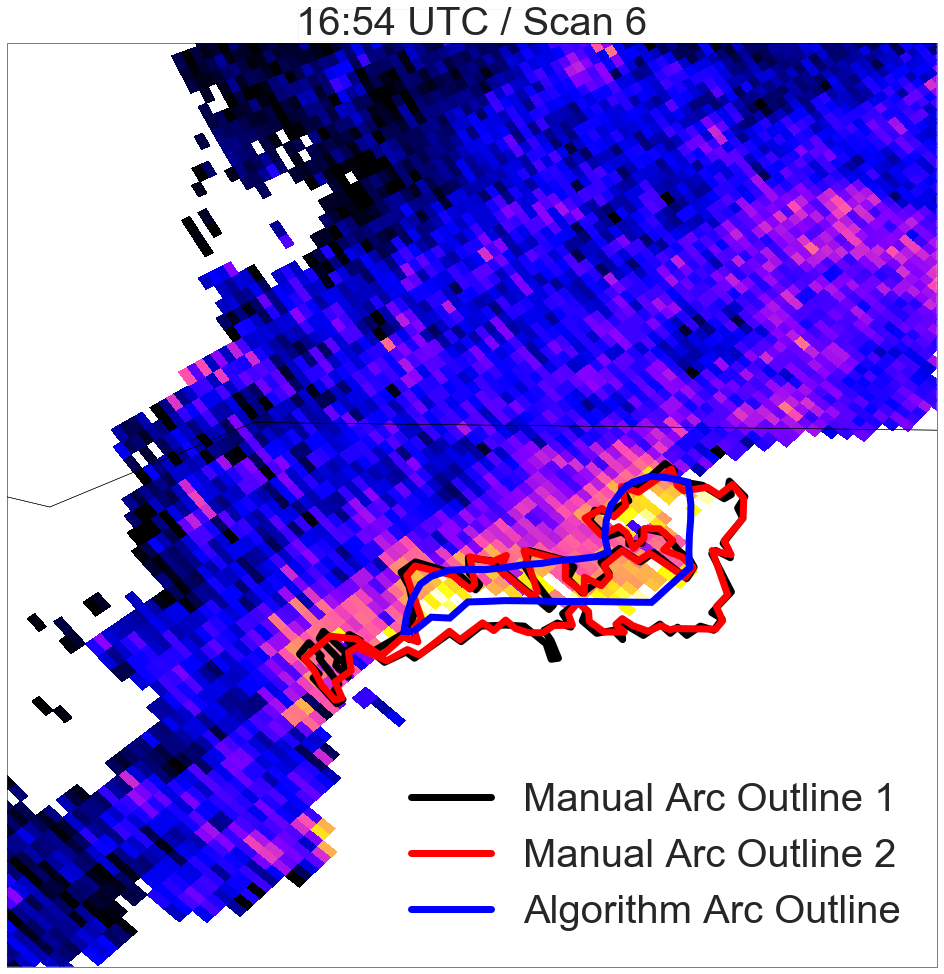

In [212]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.15,cenlat-0.20,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon-0.37,cenlat+0.06,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 6
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], zdr_arrays[time1+2], cmap=plt.cm.gnuplot2, vmin = 0, vmax = 5)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(arcshapefilesc[time1], edgecolor = 'red', facecolor='none', alpha=1.0, linewidth = 7, zorder=4)
ax.add_feature(VDB_arc_outlines[time1], edgecolor = 'k', facecolor='none', alpha=1.0, linewidth = 7, zorder=3)
for j in range(len(arc_outlines4[time1+2])):
            patch = PathPatch(arc_outlines4[time1+2][j], facecolor = 'none', alpha=1.0, edgecolor='blue', linewidth=7, zorder=10)
            ax.add_patch(patch)
            
manual = mlines.Line2D([], [], color='red', linewidth = 7,linestyle = 'solid', label='Manual Arc Outline 2')
manual1 = mlines.Line2D([], [], color='k', linewidth = 7,linestyle = 'solid', label='Manual Arc Outline 1')
algorithm = mlines.Line2D([], [], color='blue', linewidth = 7, label='Algorithm Arc Outline')
plt.legend(handles=[manual1, manual, algorithm], loc = 4, fontsize = 40)
plt.title('16:54 UTC / Scan 6', size = 40, bbox={'facecolor':'white','pad':-2})
# cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
# cg1.ax.tick_params(labelsize=30)
# cg1.set_label("Differential Reflectivity (dB)",size = 45)
#plt.legend()
#plt.savefig("PaperArcOutlines6_revised_gnu.png")

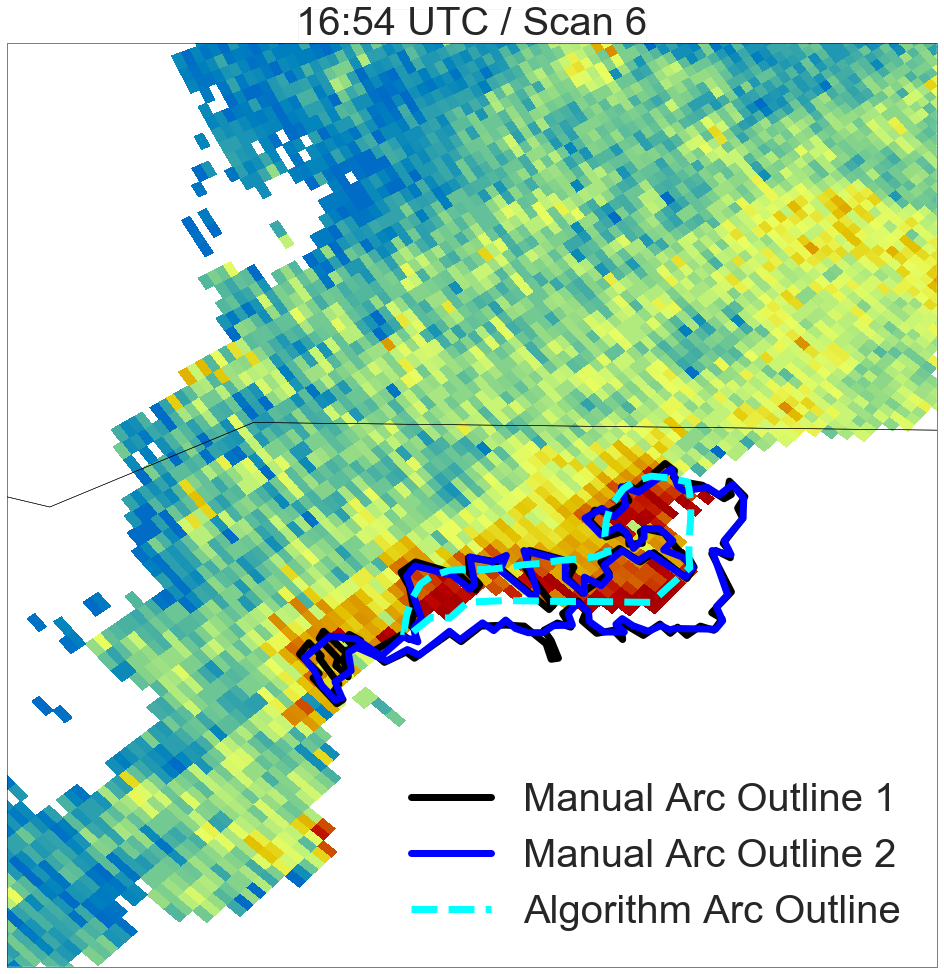

In [328]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.15,cenlat-0.20,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon-0.37,cenlat+0.06,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 6
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], zdr_arrays[time1+2], cmap=pyart.graph.cm_colorblind.HomeyerRainbow, vmin = 0, vmax = 5)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(arcshapefilesc[time1], edgecolor = 'blue', facecolor='none', alpha=1.0, linewidth = 7, zorder=4)
ax.add_feature(VDB_arc_outlines[time1], edgecolor = 'k', facecolor='none', alpha=1.0, linewidth = 7, zorder=3)
for j in range(len(arc_outlines4[time1+2])):
            patch = PathPatch(arc_outlines4[time1+2][j], facecolor = 'none', alpha=1.0, edgecolor='cyan', linewidth=7, linestyle='--', zorder=10)
            ax.add_patch(patch)
            
manual = mlines.Line2D([], [], color='blue', linewidth = 7,linestyle = 'solid', label='Manual Arc Outline 2')
manual1 = mlines.Line2D([], [], color='k', linewidth = 7,linestyle = 'solid', label='Manual Arc Outline 1')
algorithm = mlines.Line2D([], [], color='cyan', linewidth = 7,linestyle = '--', label='Algorithm Arc Outline')
plt.legend(handles=[manual1, manual, algorithm], loc = 4, fontsize = 40)
plt.title('16:54 UTC / Scan 6', size = 40, bbox={'facecolor':'white','pad':-2})
# cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
# cg1.ax.tick_params(labelsize=30)
# cg1.set_label("Differential Reflectivity (dB)",size = 45)
#plt.legend()
#plt.savefig("PaperArcOutlines6_newforest_Homeyer.png")

Text(0.5, 1.0, '16:54 UTC / Scan 6')

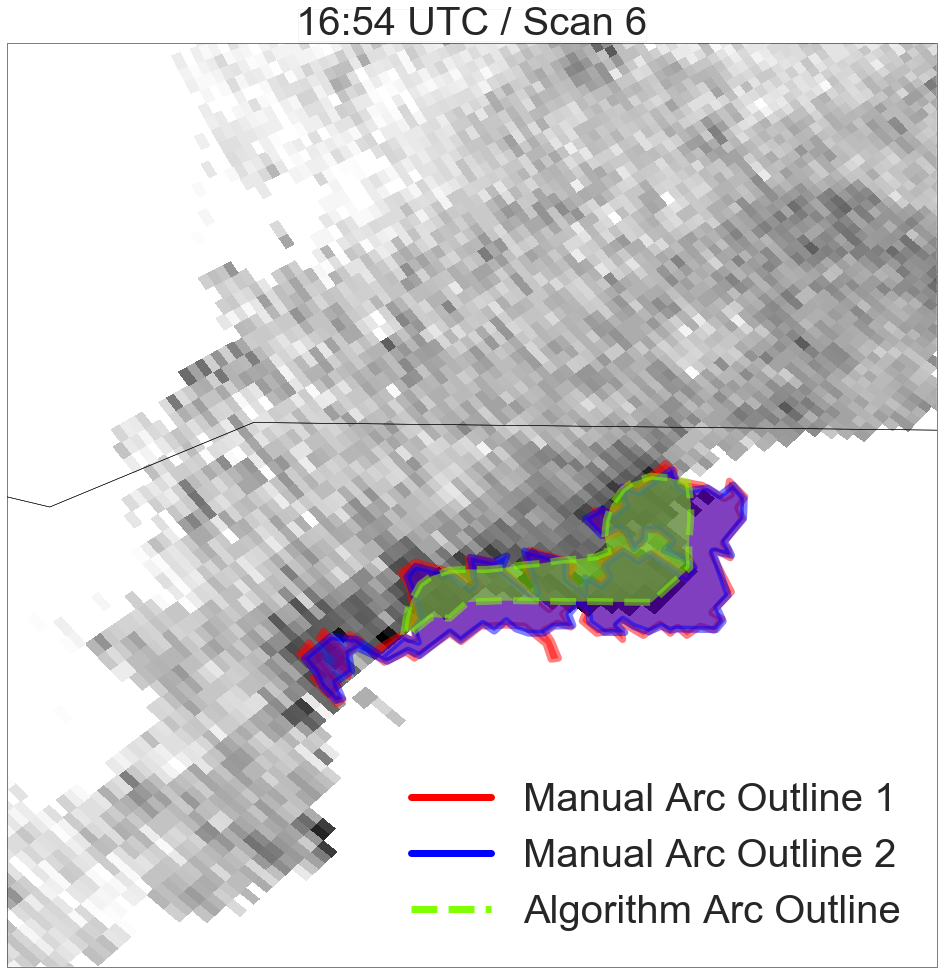

In [214]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.15,cenlat-0.20,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon-0.37,cenlat+0.06,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 6
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], zdr_arrays[time1+2], cmap=plt.cm.gray_r, vmin = 0, vmax = 5)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(arcshapefilesc[time1], edgecolor = 'blue', facecolor='blue', alpha=0.5, linewidth = 7, zorder=4)
ax.add_feature(VDB_arc_outlines[time1], edgecolor = 'red', facecolor='red', alpha=0.5, linewidth = 7, zorder=3)
for j in range(len(arc_outlines4[time1+2])):
            patch = PathPatch(arc_outlines4[time1+2][j], facecolor = 'chartreuse', alpha=0.5, edgecolor='chartreuse', linewidth=7, linestyle='--', zorder=10)
            ax.add_patch(patch)
            
manual = mlines.Line2D([], [], color='blue', linewidth = 7,linestyle = 'solid', label='Manual Arc Outline 2')
manual1 = mlines.Line2D([], [], color='red', linewidth = 7,linestyle = 'solid', label='Manual Arc Outline 1')
algorithm = mlines.Line2D([], [], color='chartreuse', linewidth = 7,linestyle = '--', label='Algorithm Arc Outline')
plt.legend(handles=[manual1, manual, algorithm], loc = 4, fontsize = 40)
plt.title('16:54 UTC / Scan 6', size = 40, bbox={'facecolor':'white','pad':-2})
# cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
# cg1.ax.tick_params(labelsize=30)
# cg1.set_label("Differential Reflectivity (dB)",size = 45)
#plt.legend()
#plt.savefig("PaperArcOutlines6_revised_grey.png")

Text(0.5, 1.0, '17:17 UTC / Scan 20')

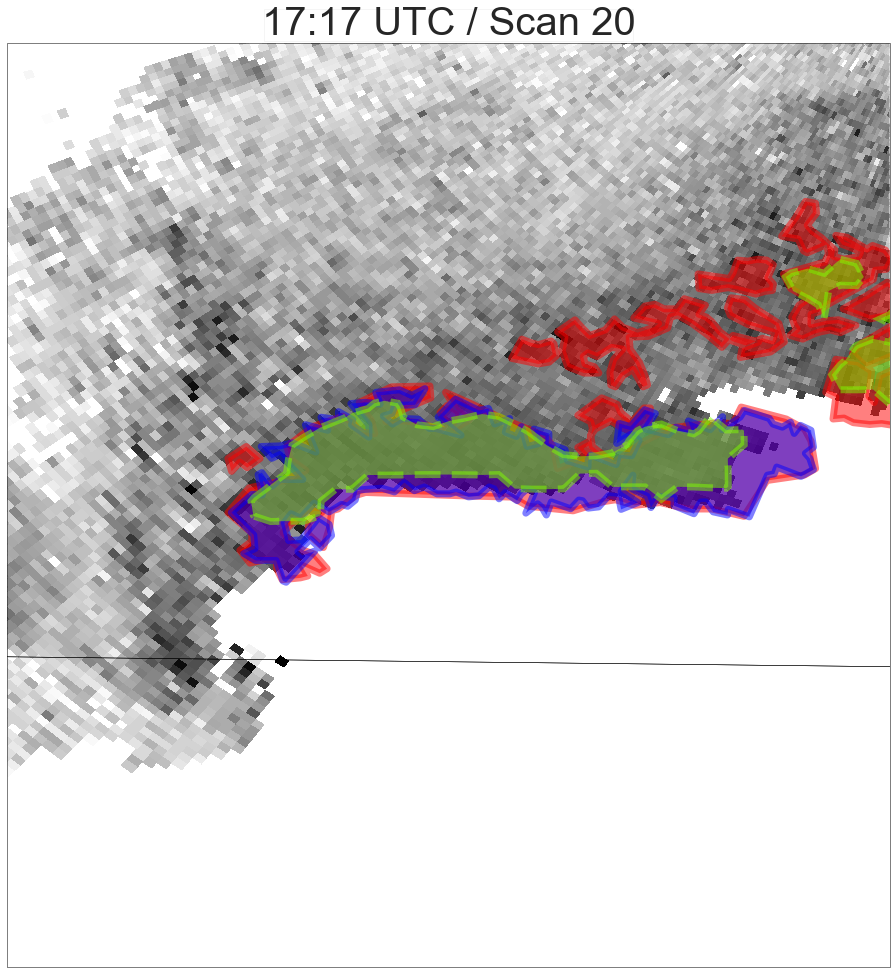

In [215]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.20,cenlat-0.13,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon+0.08,cenlat+0.13,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 20
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], zdr_arrays[time1+2], cmap=plt.cm.gray_r, vmin = 0, vmax = 5)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(arcshapefilesc[time1], edgecolor = 'blue', facecolor='blue', alpha=0.5, linewidth = 7, zorder=4)
ax.add_feature(VDB_arc_outlines[time1], edgecolor = 'red', facecolor='red', alpha=0.5, linewidth = 7, zorder=3)
for j in range(len(arc_outlines4[time1+2])):
            patch = PathPatch(arc_outlines4[time1+2][j], facecolor = 'chartreuse', alpha=0.5, edgecolor='chartreuse', linewidth=7, linestyle='--', zorder=10)
            ax.add_patch(patch)
plt.title('17:17 UTC / Scan 20', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("PaperArcOutlines20_revised_gray.png")

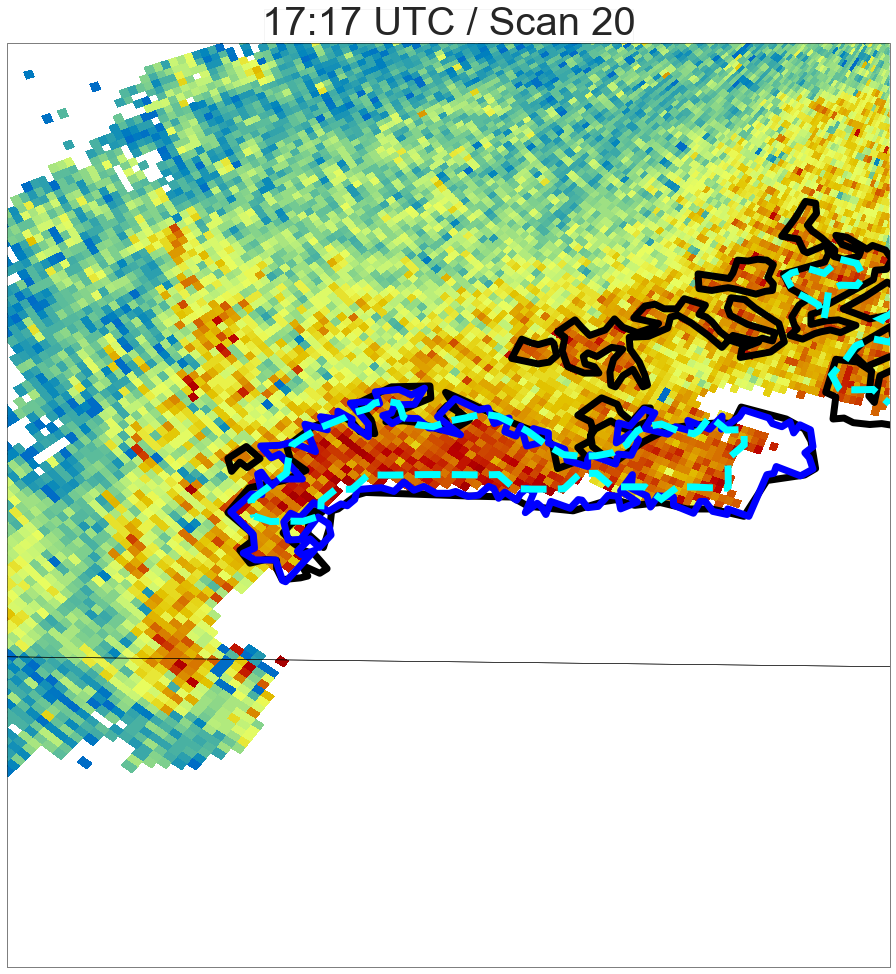

In [329]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.20,cenlat-0.13,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon+0.08,cenlat+0.13,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 20
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], zdr_arrays[time1+2], cmap=pyart.graph.cm_colorblind.HomeyerRainbow, vmin = 0, vmax = 5)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(arcshapefilesc[time1], edgecolor = 'blue', facecolor='none', alpha=1.0, linewidth = 7, zorder=4)
ax.add_feature(VDB_arc_outlines[time1], edgecolor = 'k', facecolor='none', alpha=1.0, linewidth = 7, zorder=3)
for j in range(len(arc_outlines4[time1+2])):
            patch = PathPatch(arc_outlines4[time1+2][j], facecolor = 'none', alpha=1.0, edgecolor='cyan', linewidth=7, linestyle='--', zorder=10)
            ax.add_patch(patch)
plt.title('17:17 UTC / Scan 20', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("PaperArcOutlines20_newforest_Homeyer.png")

Text(0.5, 1.0, '17:30 UTC / Scan 28')

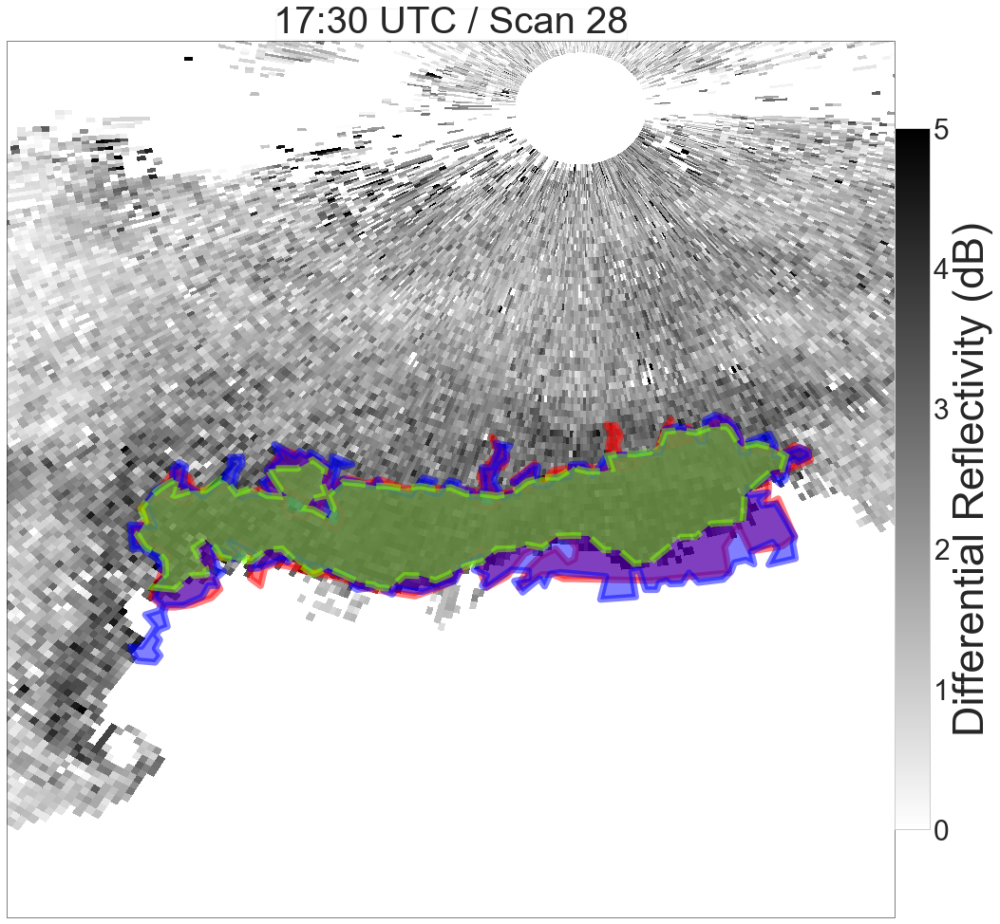

In [217]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.07,cenlat-0.03,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon+0.23,cenlat+0.23,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 28
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], zdr_arrays[time1+2], cmap=plt.cm.gray_r, vmin = 0, vmax = 5)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(arcshapefilesc[time1], edgecolor = 'blue', facecolor='blue', alpha=0.5, linewidth = 7, zorder=4)
ax.add_feature(VDB_arc_outlines[time1], edgecolor = 'red', facecolor='red', alpha=0.5, linewidth = 7, zorder=3)
for j in range(len(arc_outlines4[time1+2])):
            patch = PathPatch(arc_outlines4[time1+2][j], facecolor = 'chartreuse', alpha=0.5, edgecolor='chartreuse', linewidth=7, linestyle='--', zorder=10)
            ax.add_patch(patch)
cg1 = plt.colorbar(refp, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Differential Reflectivity (dB)",size = 45)
plt.title('17:30 UTC / Scan 28', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("PaperArcOutlines28_revised.png")

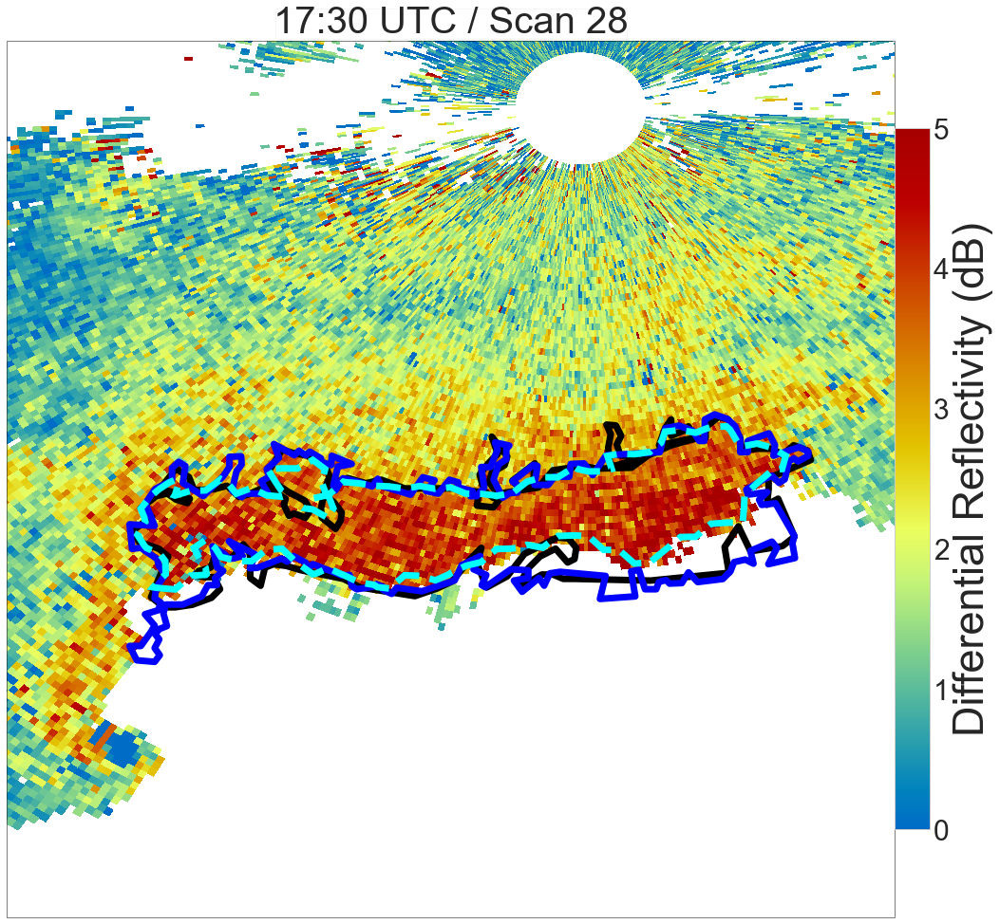

In [330]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.07,cenlat-0.03,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon+0.23,cenlat+0.23,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 28
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], zdr_arrays[time1+2], cmap=pyart.graph.cm_colorblind.HomeyerRainbow, vmin = 0, vmax = 5)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(arcshapefilesc[time1], edgecolor = 'blue', facecolor='none', alpha=1.0, linewidth = 7, zorder=4)
ax.add_feature(VDB_arc_outlines[time1], edgecolor = 'k', facecolor='none', alpha=1.0, linewidth = 7, zorder=3)
for j in range(len(arc_outlines4[time1+2])):
            patch = PathPatch(arc_outlines4[time1+2][j], facecolor = 'none', alpha=1.0, edgecolor='cyan', linewidth=7, linestyle='--', zorder=10)
            ax.add_patch(patch)
cg1 = plt.colorbar(refp, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Differential Reflectivity (dB)",size = 45)
plt.title('17:30 UTC / Scan 28', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("PaperArcOutlines28_newforest_Homeyer.png")

Text(0.5, 1.0, '17:30 UTC / Scan 28')

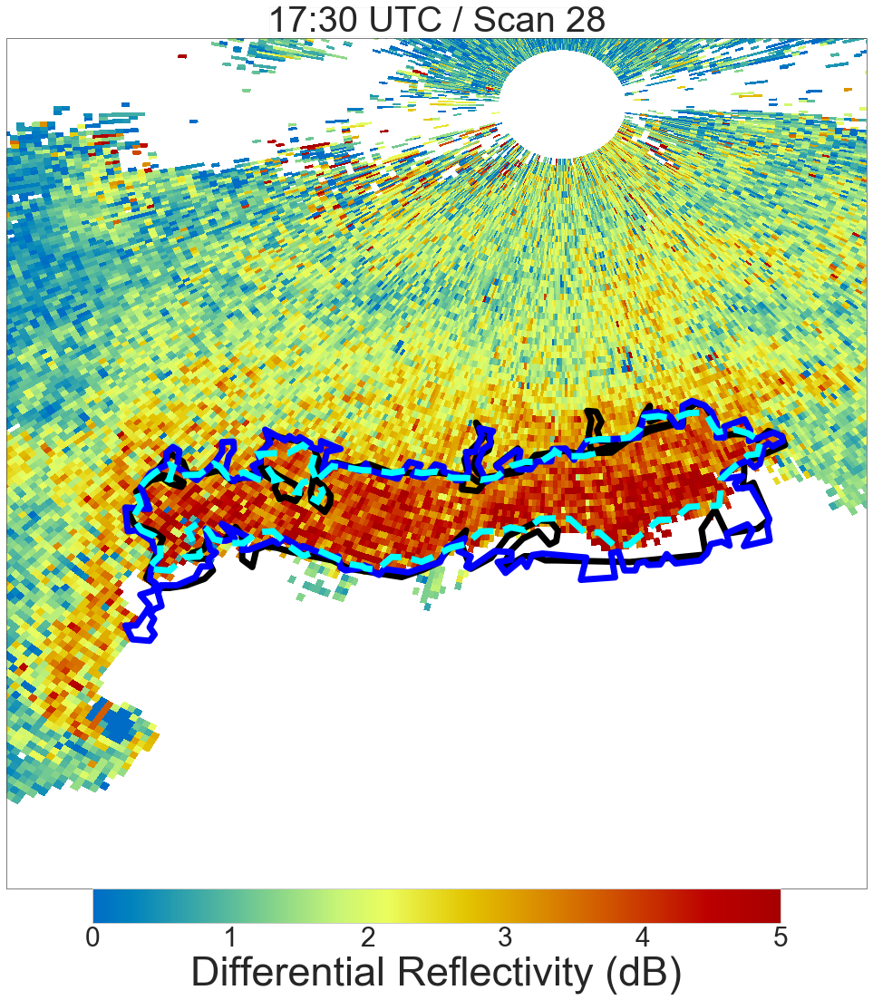

In [219]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.07,cenlat-0.03,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon+0.23,cenlat+0.23,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(17.,26.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 28
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], zdr_arrays[time1+2], cmap=pyart.graph.cm_colorblind.HomeyerRainbow, vmin = 0, vmax = 5)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(arcshapefilesc[time1], edgecolor = 'blue', facecolor='none', alpha=1.0, linewidth = 7, zorder=4)
ax.add_feature(VDB_arc_outlines[time1], edgecolor = 'k', facecolor='none', alpha=1.0, linewidth = 7, zorder=3)
for j in range(len(arc_outlines4[time1+2])):
            patch = PathPatch(arc_outlines4[time1+2][j], facecolor = 'none', alpha=1.0, edgecolor='cyan', linewidth=7, linestyle='--', zorder=10)
            ax.add_patch(patch)
cg1 = plt.colorbar(refp, shrink=0.80, pad=0, orientation='horizontal')
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Differential Reflectivity (dB)",size = 45)
plt.title('17:30 UTC / Scan 28', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("PaperArcOutlines28_revised_Homeyer.png")

0


Text(0.5, 1.0, '16:54 UTC / Scan 6')

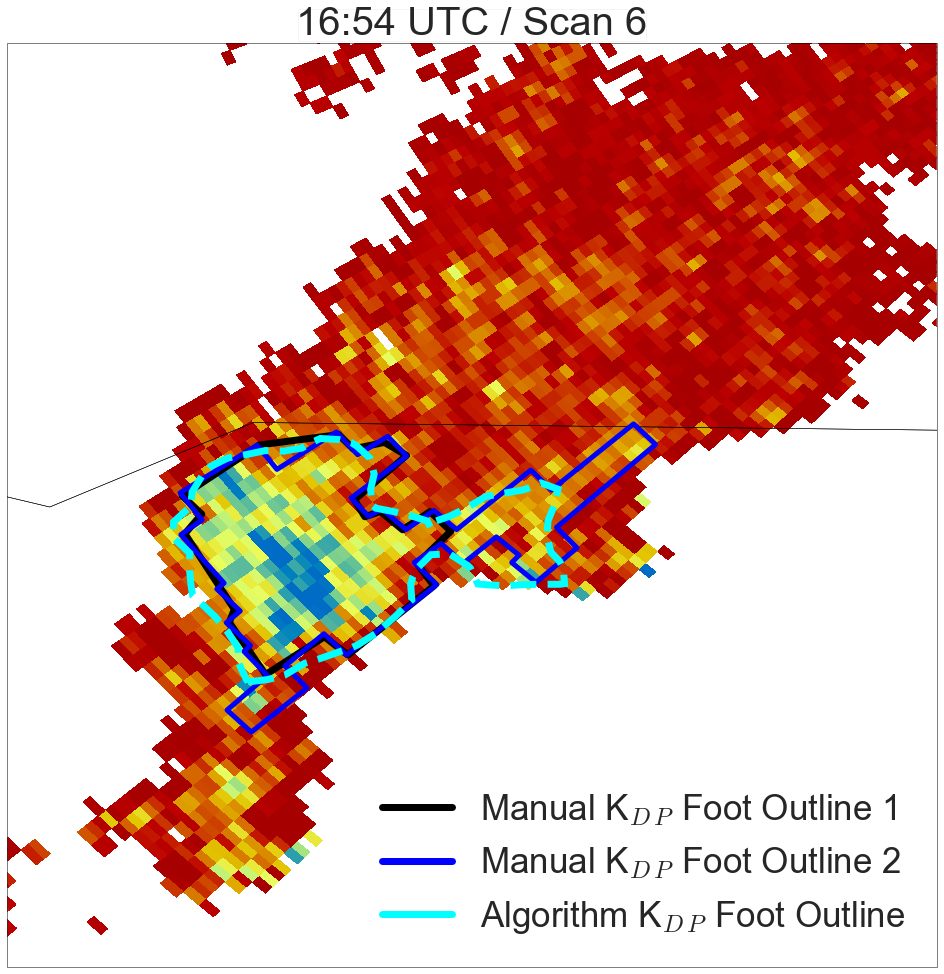

In [220]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.15,cenlat-0.20,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon-0.37,cenlat+0.06,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 6
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], kdp_arrays[time1+2], cmap=pyart.graph.cm_colorblind.HomeyerRainbow_r, vmin = 0, vmax = 5)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
arc = ax.add_feature(footshapefilesc[time1], edgecolor = 'blue', facecolor='none', linewidth=5, alpha=1.0, zorder=4)
ax.add_feature(VDB_foot_outlines[time1], edgecolor = 'k', facecolor='none', alpha=1.0, linewidth = 7, zorder=3)
for i in range(len(foot_outlines1[time1+2])):
    print(i)
    patch = PathPatch(foot_outlines1[time1+2][i], facecolor = 'none', edgecolor='cyan', alpha=1.0, linewidth=7, linestyle='--', zorder=10)
    ax.add_patch(patch)
#m_arcc = plt.scatter(arc_clonsc[time1], arc_clatsc[time1], s=1200, marker='*', color='blue', label = 'Manual Arc Centroid', zorder=14)
#m_footc = plt.scatter(foot_clonsc[time1], foot_clatsc[time1], s=1200, marker='*', color='red', label = "Manual Foot Centroid", zorder=14)

#a_arcc = plt.scatter(arc_alg_cenlons[time1], arc_alg_cenlats[time1], s=800, marker='o', color='gold', label="Algorithm Arc Centroid", zorder=13)
#a_footc = plt.scatter(foot_alg_cenlons[time1], foot_alg_cenlats[time1], s=800, marker='o', color='chartreuse', label="Algorithm Foot Centroid", zorder=13)

manual = mlines.Line2D([], [], color='blue', linewidth = 7,linestyle = 'solid', label='Manual K$_D$$_P$ Foot Outline 2')
manual1 = mlines.Line2D([], [], color='k', linewidth = 7,linestyle = 'solid', label='Manual K$_D$$_P$ Foot Outline 1')
algorithm = mlines.Line2D([], [], color='cyan', linewidth = 7,linestyle = 'solid', label='Algorithm K$_D$$_P$ Foot Outline')
plt.legend(handles=[manual1, manual, algorithm], loc = 4, fontsize = 35)
plt.title('16:54 UTC / Scan 6', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("NewPaperFootOutlines6_revised_1r.png")

0
1
2


Text(0.5, 1.0, '17:17 UTC / Scan 20')

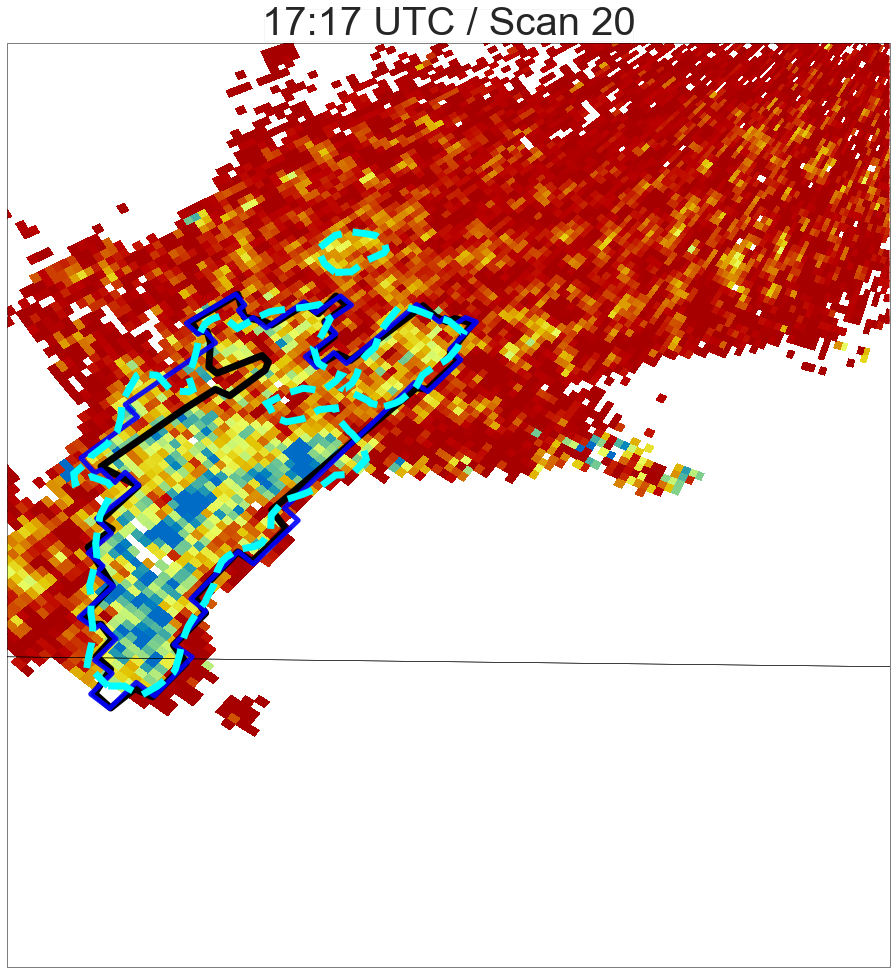

In [221]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.20,cenlat-0.13,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon+0.08,cenlat+0.13,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 20
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], kdp_arrays[time1+2], cmap=pyart.graph.cm_colorblind.HomeyerRainbow_r, vmin = 0, vmax = 5)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
arc = ax.add_feature(footshapefilesc[time1], edgecolor = 'blue', linewidth=5, alpha=0.9, zorder=4)
ax.add_feature(VDB_foot_outlines[time1], edgecolor = 'k', facecolor='none', alpha=1.0, linewidth = 7, zorder=3)
for i in range(len(foot_outlines1[time1+2])):
    print(i)
    patch = PathPatch(foot_outlines1[time1+2][i], facecolor = 'none', edgecolor='cyan', linewidth=7, linestyle='--', zorder=10)
    ax.add_patch(patch)
#plt.scatter(arc_clonsc[time1], arc_clatsc[time1], s=1200, marker='*', color='blue', zorder=14)
#plt.scatter(foot_clonsc[time1], foot_clatsc[time1], s=1200, marker='*', color='red', zorder=14)

#plt.scatter(arc_alg_cenlons[time1], arc_alg_cenlats[time1], s=800, marker='o', color='gold', zorder=13)
#plt.scatter(foot_alg_cenlons[time1], foot_alg_cenlats[time1], s=800, marker='o', color='chartreuse', zorder=13)
plt.title('17:17 UTC / Scan 20', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("NewPaperFootOutlines20_revised_1r.png")

0
1
2
3


Text(0.5, 1.0, '17:30 UTC / Scan 28')

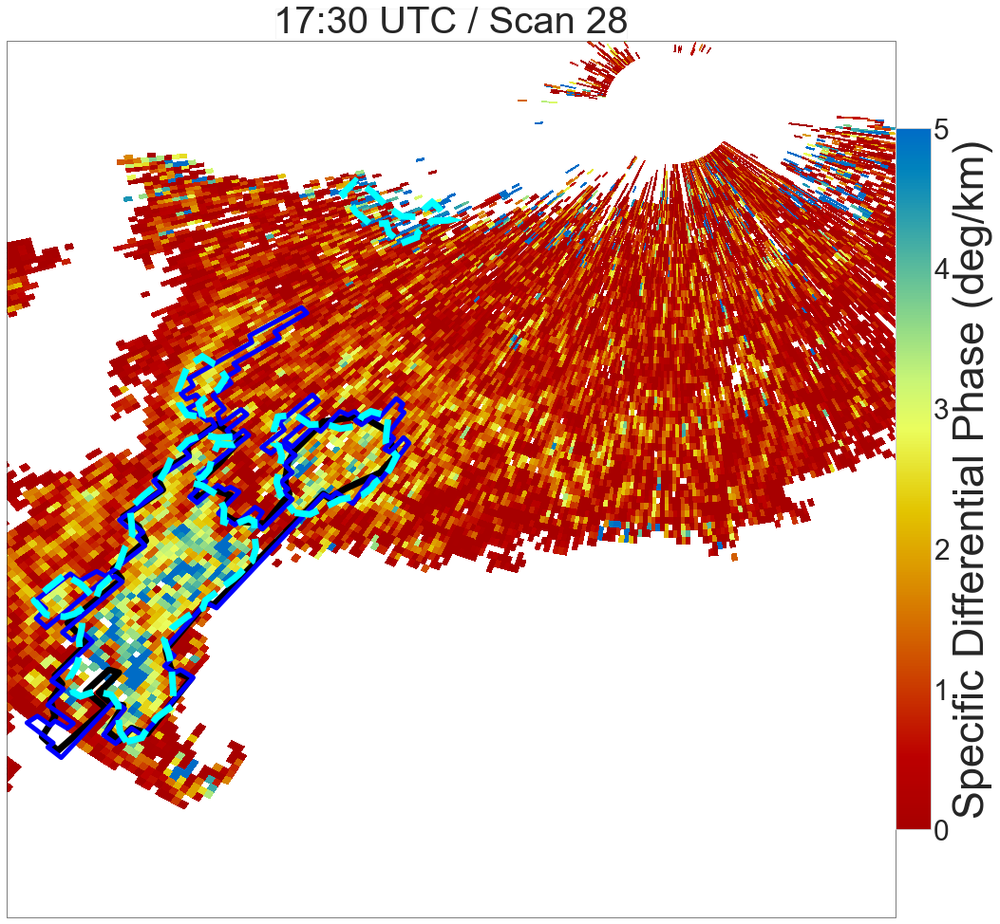

In [222]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.10,cenlat-0.03,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon+0.20,cenlat+0.23,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 28
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], kdp_arrays[time1+2], cmap=pyart.graph.cm_colorblind.HomeyerRainbow_r, vmin = 0, vmax = 5)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
arc = ax.add_feature(footshapefilesc[time1], edgecolor = 'blue', linewidth=5, alpha=1.0, zorder=4)
ax.add_feature(VDB_foot_outlines[time1], edgecolor = 'k', facecolor='none', alpha=1.0, linewidth = 7, zorder=3)
for i in range(len(foot_outlines1[time1+2])):
    print(i)
    patch = PathPatch(foot_outlines1[time1+2][i], facecolor = 'none', edgecolor='cyan', linewidth=7, linestyle='--', zorder=10)
    ax.add_patch(patch)
#plt.scatter(arc_clonsc[time1], arc_clatsc[time1], s=1200, marker='*', color='blue', zorder=14)
#plt.scatter(foot_clonsc[time1], foot_clatsc[time1], s=1200, marker='*', color='red', zorder=14)

#plt.scatter(arc_alg_cenlons[time1], arc_alg_cenlats[time1], s=800, marker='o', color='gold', zorder=13)
#plt.scatter(foot_alg_cenlons[time1], foot_alg_cenlats[time1], s=800, marker='o', color='chartreuse', zorder=13)
cg1 = plt.colorbar(refp, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Specific Differential Phase (deg/km)",size = 45)
plt.title('17:30 UTC / Scan 28', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("NewPaperFootOutlines28_revised_1r.png")

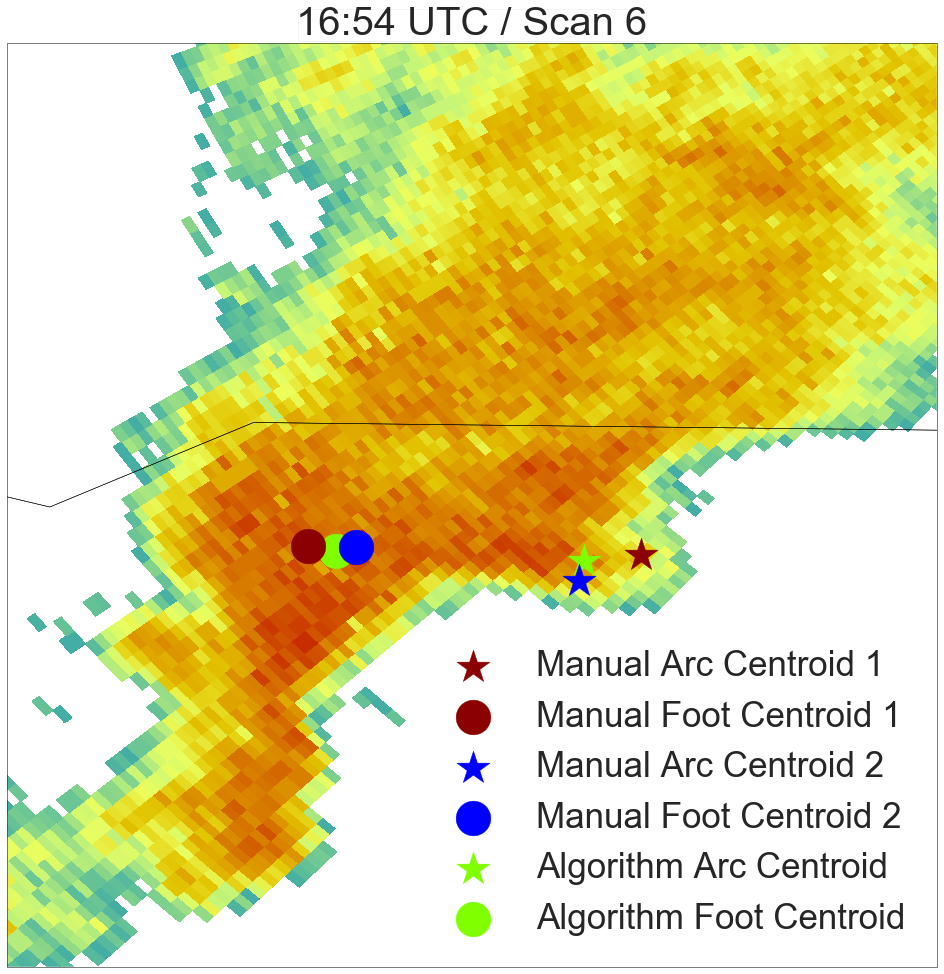

In [331]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.15,cenlat-0.20,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon-0.37,cenlat+0.06,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 6
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], refl_arrays[time1+2], cmap=pyart.graph.cm_colorblind.HomeyerRainbow, vmin = 10, vmax = 70)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
# arc = ax.add_feature(footshapefilesc[time1], edgecolor = 'red', linewidth=5, alpha=0.9)
# for i in range(len(foot_outlines1[time1])):
#     print(i)
#     patch = PathPatch(foot_outlines1[time1][i], facecolor = 'none', edgecolor='chartreuse', linewidth=7)
#     ax.add_patch(patch)
m_arcc = plt.scatter(arc_clonsc[time1], arc_clatsc[time1], s=1200, marker='*', color='blue', label = 'Manual Arc Centroid 2', zorder=14)
m_footc = plt.scatter(foot_clonsc[time1], foot_clatsc[time1], s=1200, marker='o', color='blue', label = "Manual Foot Centroid 2", zorder=14)

m_arcc1 = plt.scatter(VDB_arc_clons[time1], VDB_arc_clats[time1], s=1200, marker='*', color='darkred', label = 'Manual Arc Centroid 1', zorder=14)
m_footc1 = plt.scatter(VDB_foot_clons[time1], VDB_foot_clats[time1], s=1200, marker='o', color='darkred', label = "Manual Foot Centroid 1", zorder=14)

a_arcc = plt.scatter(arc_alg_cenlons[time1+2], arc_alg_cenlats[time1+2], s=1200, marker='*', color='chartreuse', label="Algorithm Arc Centroid", zorder=13)
a_footc = plt.scatter(foot_alg_cenlons[time1+2], foot_alg_cenlats[time1+2], s=1200, marker='o', color='chartreuse', label="Algorithm Foot Centroid", zorder=13)

#manual = mlines.Line2D([], [], color='red', linewidth = 7,linestyle = 'solid', label='Manual K$_D$$_P$ Foot Outline')
#algorithm = mlines.Line2D([], [], color='chartreuse', linewidth = 7,linestyle = 'solid', label='Algorithm K$_D$$_P$ Foot Outline')
plt.legend(handles=[m_arcc1, m_footc1, m_arcc, m_footc, a_arcc, a_footc], loc = 4, fontsize = 35)
plt.title('16:54 UTC / Scan 6', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("NewCentroidOutlines0_newforest.png")

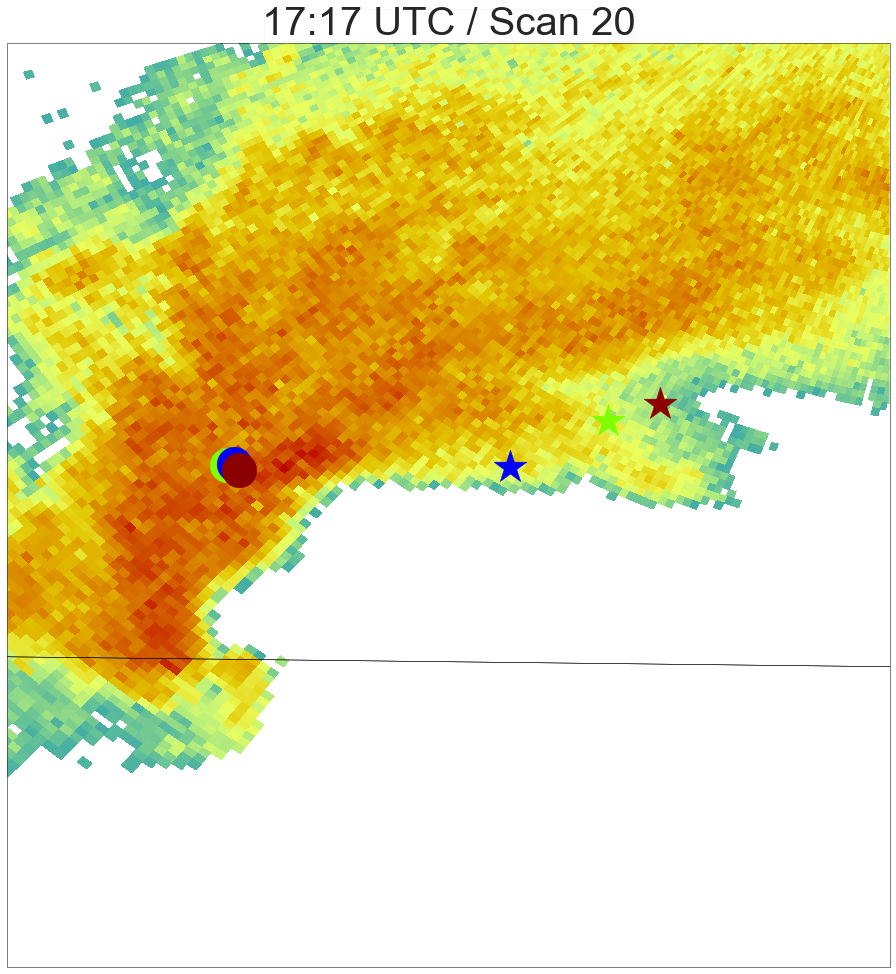

In [332]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.20,cenlat-0.13,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon+0.08,cenlat+0.13,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 20
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], refl_arrays[time1+2], cmap=pyart.graph.cm_colorblind.HomeyerRainbow, vmin = 10, vmax = 70)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
# arc = ax.add_feature(footshapefilesc[time1], edgecolor = 'red', linewidth=5, alpha=0.9)
# for i in range(len(foot_outlines1[time1])):
#     print(i)
#     patch = PathPatch(foot_outlines1[time1][i], facecolor = 'none', edgecolor='chartreuse', linewidth=7)
#     ax.add_patch(patch)
plt.scatter(arc_clonsc[time1], arc_clatsc[time1], s=1200, marker='*', color='blue', zorder=14)
plt.scatter(foot_clonsc[time1], foot_clatsc[time1], s=1200, marker='o', color='blue', zorder=14)

m_arcc1 = plt.scatter(VDB_arc_clons[time1], VDB_arc_clats[time1], s=1200, marker='*', color='darkred', label = 'Manual Arc Centroid 1', zorder=14)
m_footc1 = plt.scatter(VDB_foot_clons[time1], VDB_foot_clats[time1], s=1200, marker='o', color='darkred', label = "Manual Foot Centroid 1", zorder=14)

plt.scatter(arc_alg_cenlons[time1+2], arc_alg_cenlats[time1+2], s=1200, marker='*', color='chartreuse', zorder=13)
plt.scatter(foot_alg_cenlons[time1+2], foot_alg_cenlats[time1+2], s=1200, marker='o', color='chartreuse', zorder=13)
plt.title('17:17 UTC / Scan 20', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("NewCentroidOutlines20_newforest.png")

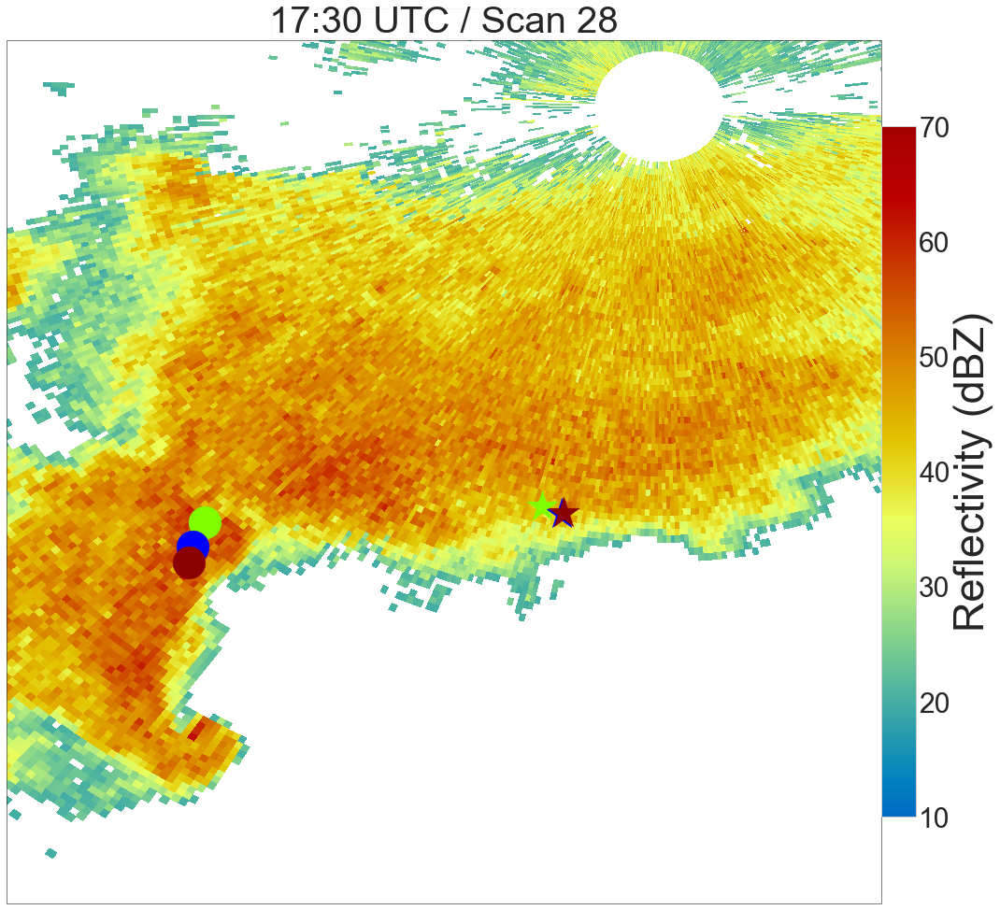

In [333]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
LL2 = crs.transform_point(cenlon-0.10,cenlat-0.03,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon+0.20,cenlat+0.23,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 28
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], refl_arrays[time1+2], cmap=pyart.graph.cm_colorblind.HomeyerRainbow, vmin = 10, vmax = 70)
#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
# arc = ax.add_feature(footshapefilesc[time1], edgecolor = 'red', linewidth=5, alpha=0.9)
# for i in range(len(foot_outlines1[time1])):
#     print(i)
#     patch = PathPatch(foot_outlines1[time1][i], facecolor = 'none', edgecolor='chartreuse', linewidth=7)
#     ax.add_patch(patch)
plt.scatter(arc_clonsc[time1], arc_clatsc[time1], s=1200, marker='*', color='blue', zorder=14)
plt.scatter(foot_clonsc[time1], foot_clatsc[time1], s=1200, marker='o', color='blue', zorder=14)

m_arcc1 = plt.scatter(VDB_arc_clons[time1], VDB_arc_clats[time1], s=1200, marker='*', color='darkred', label = 'Manual Arc Centroid 1', zorder=14)
m_footc1 = plt.scatter(VDB_foot_clons[time1], VDB_foot_clats[time1], s=1200, marker='o', color='darkred', label = "Manual Foot Centroid 1", zorder=14)

plt.scatter(arc_alg_cenlons[time1+2], arc_alg_cenlats[time1+2], s=1200, marker='*', color='chartreuse', zorder=13)
plt.scatter(foot_alg_cenlons[time1+2], foot_alg_cenlats[time1+2], s=1200, marker='o', color='chartreuse', zorder=13)
cg1 = plt.colorbar(refp, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Reflectivity (dBZ)",size = 45)
plt.title('17:30 UTC / Scan 28', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("NewCentroidOutlines28_newforest.png")

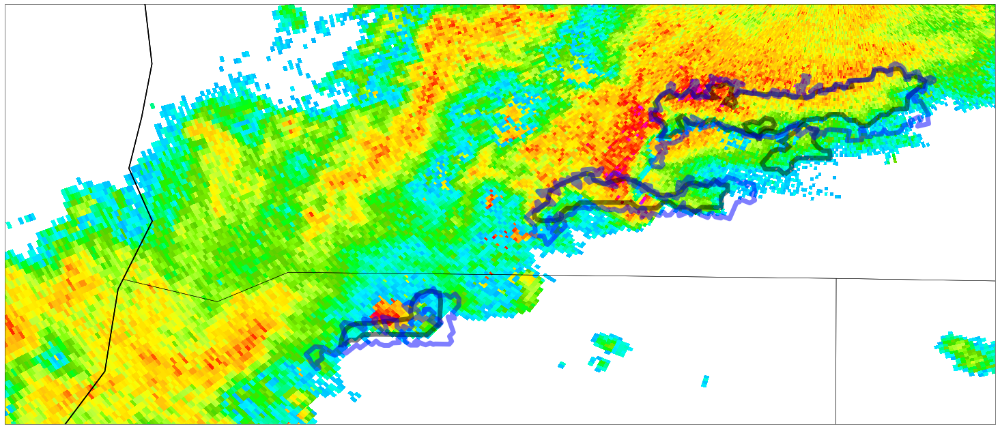

In [226]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL[0],UR[0],LL[1],UR[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
time1 = 6
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], refl_arrays[time1+2], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(arcshapefilesc[time1], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
for j in range(len(arc_outlines4[time1+2])):
            patch = PathPatch(arc_outlines4[time1+2][j], facecolor = 'none', alpha=0.5, edgecolor='k', linewidth=7)
            ax.add_patch(patch)

time2 = 20
refp = ax.pcolormesh(lon_arrays[time2+2], lat_arrays[time2+2], refl_arrays[time2+2], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(arcshapefilesc[time2], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
for j in range(len(arc_outlines4[time2+2])):
            patch = PathPatch(arc_outlines4[time2+2][j], facecolor = 'none', alpha=0.5, edgecolor='k', linewidth=7)
            ax.add_patch(patch)
            
time3 = 28
refp = ax.pcolormesh(lon_arrays[time3+2], lat_arrays[time3+2], refl_arrays[time3+2], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(arcshapefilesc[time3], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
for j in range(len(arc_outlines4[time3+2])):
            patch = PathPatch(arc_outlines4[time3+2][j], facecolor = 'none', alpha=0.5, edgecolor='k', linewidth=7)
            ax.add_patch(patch)
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
plt.show()

In [227]:
g = Geod(ellps='sphere')

In [228]:
foot_clonsa = np.asarray(foot_clonsc)
foot_clatsa = np.asarray(foot_clatsc)
arc_clonsa = np.asarray(arc_clonsc)
arc_clatsa = np.asarray(arc_clatsc)

foot_alg_cenlonsa = np.asarray(foot_alg_cenlons[2:32])
foot_alg_cenlatsa = np.asarray(foot_alg_cenlats[2:32])
arc_alg_cenlonsa = np.asarray(arc_alg_cenlons[2:32])
arc_alg_cenlatsa = np.asarray(arc_alg_cenlats[2:32])

distance_kdp_zdr_obs = g.inv(foot_clonsa, foot_clatsa, arc_clonsa, arc_clatsa)
dist_kdp_zdr_obs = distance_kdp_zdr_obs[2] / 1000.

distance_kdp_zdr_alg = g.inv(foot_alg_cenlonsa, foot_alg_cenlatsa, arc_alg_cenlonsa, arc_alg_cenlatsa)
dist_kdp_zdr_alg = distance_kdp_zdr_alg[2] / 1000.
print(dist_kdp_zdr_obs)
print(dist_kdp_zdr_alg)

print(dist_kdp_zdr_obs.shape)
print(dist_kdp_zdr_alg.shape)

back_kobs = distance_kdp_zdr_obs[1]
#print('Raw back angle', back[i])
for i in range(back_kobs.shape[0]):
    #print('loop is ok')
    if distance_kdp_zdr_obs[1][i] < 0:
        #print('if is ok')
        back_kobs[i] = distance_kdp_zdr_obs[1][i] + 360
print(back_kobs)

back_kalg = distance_kdp_zdr_alg[1]
#print('Raw back angle', back[i])
for i in range(back_kalg.shape[0]):
    #print('loop is ok')
    if distance_kdp_zdr_alg[1][i] < 0:
        #print('if is ok')
        back_kalg[i] = distance_kdp_zdr_alg[1][i] + 360
print(back_kalg)

[10.93481527 10.96243761 11.94670235  4.19920219  5.16232469  6.01694632
  6.08595135  8.91998912 10.03057898  7.11904353  5.33904087  4.50508849
  4.00366594  4.38797854  3.74165071  4.98490681  6.240327    7.41660264
 11.74237835  7.9522521   8.3709889   6.76260031  4.55308779  7.42333262
  8.79195123 10.19540442  8.54570081 11.18065927 12.13528049 12.62629081]
[        nan         nan         nan         nan  5.31696349  6.33459197
  6.67105469  7.84244298  8.969324    7.24896886  5.27938287  5.11775448
  5.32942612  4.84622741  4.02788404  5.01778674  6.61777844  8.22950669
 11.62213358 12.2199955  11.63905969 11.67573077 10.76549777  7.40608557
  8.48385369 11.13185412  9.6840501  11.22787932 11.04516054 11.30452043]
(30,)
(30,)
[265.03326132 264.97308137 259.21101481 309.30849131 288.87306196
 287.7411065  280.08136737 271.20584383 273.58488853 279.75031812
 276.79106397 283.60996073 274.69294487 274.73410864 280.84316929
 279.97602005 274.27939661 270.19339514 261.34930789 275.4

In [229]:
print(back_kobs[20])
print(back_kalg[20])

sep_obs = back_kobs - 231
sep_alg = back_kalg - 231
print(sep_obs)
print(sep_alg)

sep_obs[sep_obs < -180] = (sep_obs[sep_obs < -180] * -1) - 180 
sep_alg[sep_alg < -180] = (sep_alg[sep_alg < -180] * -1) - 180 

print(sep_obs)
print(sep_alg)


270.79948911621295
262.43074946828494
[34.03326132 33.97308137 28.21101481 78.30849131 57.87306196 56.7411065
 49.08136737 40.20584383 42.58488853 48.75031812 45.79106397 52.60996073
 43.69294487 43.73410864 49.84316929 48.97602005 43.27939661 39.19339514
 30.34930789 44.42141309 39.79948912 30.82148252 22.46561663 22.81290347
 21.94154298 23.78434369 34.02109095 30.07418266 33.16685254 34.39019744]
[        nan         nan         nan         nan 53.11024429 47.33668251
 41.7066846  34.82934225 32.30454114 38.97120279 42.22018184 35.9589338
 32.84828839 33.69669412 47.07484823 43.96740844 37.79766181 31.58894245
 27.39602278 29.68502047 31.43074947 26.30220683 37.1664994  24.7422124
 23.41105124 25.13547099 28.9196092  31.01099214 35.82286484 36.94287807]
[34.03326132 33.97308137 28.21101481 78.30849131 57.87306196 56.7411065
 49.08136737 40.20584383 42.58488853 48.75031812 45.79106397 52.60996073
 43.69294487 43.73410864 49.84316929 48.97602005 43.27939661 39.19339514
 30.34930789 44

C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in less
  # Remove the CWD from sys.path while we load stuff.


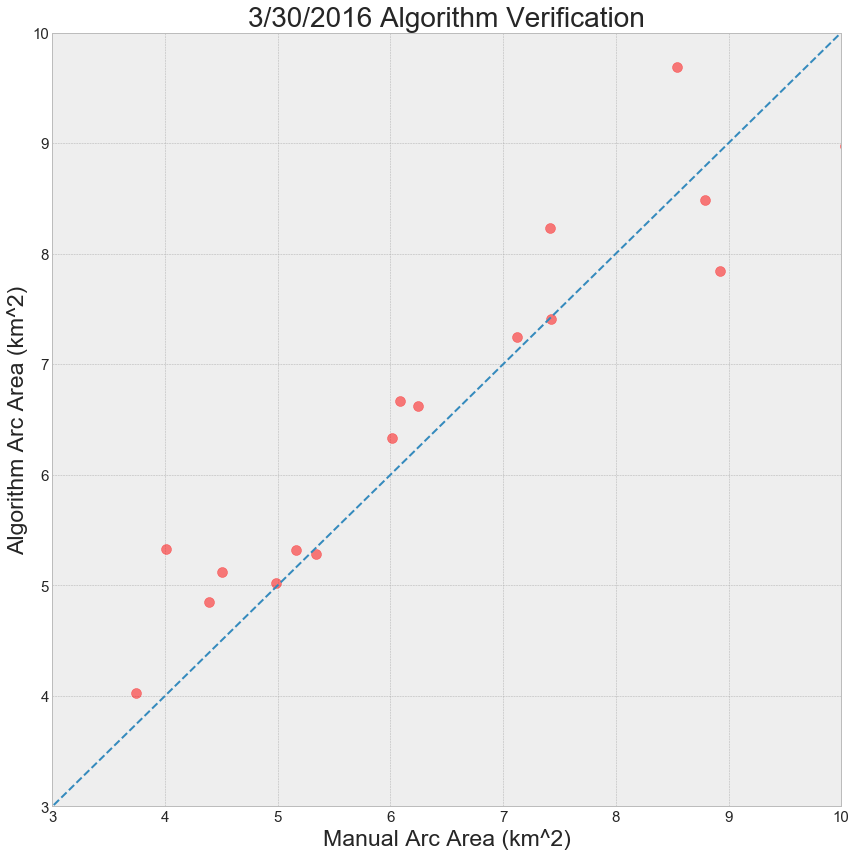

In [230]:
plt.style.use('bmh')
fig = plt.figure(1, (12, 12))
#x = np.arange(0, len(arcshapefiles[1:21]), 1)
#plt.scatter(np.asarray(areasc), storm3_alg_f[0:40], label='3.5 dB Alg')
plt.scatter(dist_kdp_zdr_obs, dist_kdp_zdr_alg, color='r', s=100, alpha=0.5)
#plt.scatter(np.asarray(areasc), storm5_alg_f[0:40], color='g', s=100, alpha=0.5)

plt.xlim(3,10)
plt.ylim(3,10)
plt.xticks(size=15)
plt.yticks(size=15)
plt.xlabel('Manual Arc Area (km^2)', size=23)
plt.ylabel('Algorithm Arc Area (km^2)', size=23)
plt.title('3/30/2016 Algorithm Verification', size=28)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
line = np.arange(0, 150, 1)
plt.plot(line, line, linestyle='--', linewidth=2)
#plt.text(100, 120, 'R=0.94', size=20)
plt.tight_layout()
#plt.savefig('AlgScatterVerif.png')
plt.show()

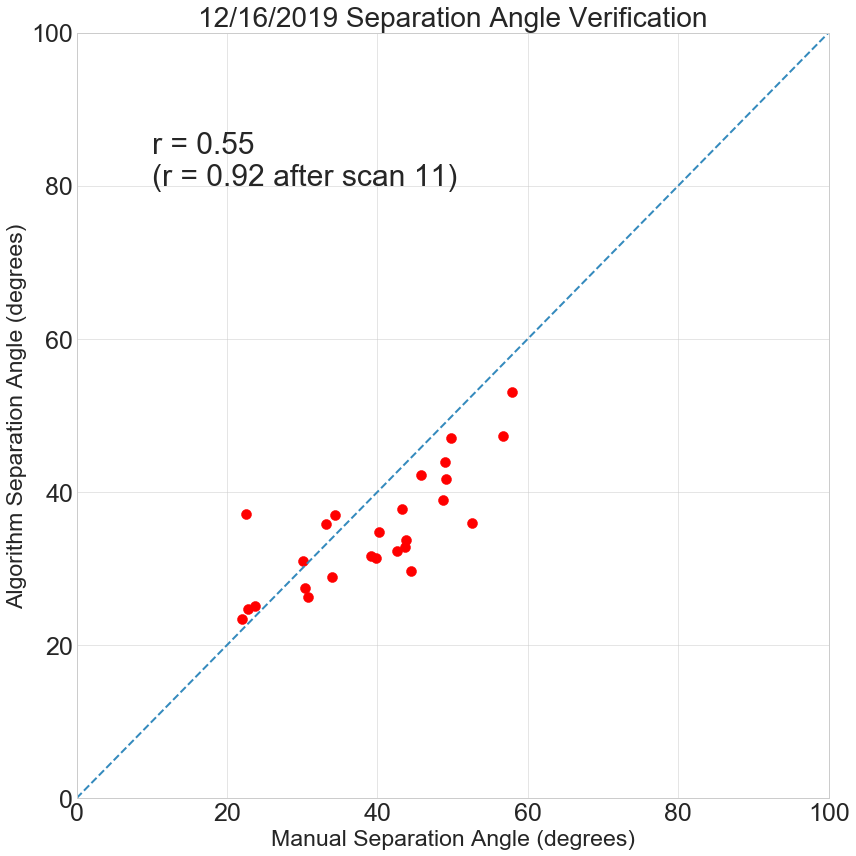

In [231]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
#x = np.arange(0, len(arcshapefiles[1:21]), 1)
#plt.scatter(np.asarray(areasc), storm3_alg_f[0:40], label='3.5 dB Alg')
plt.scatter(sep_obs, sep_alg, color='r', s=100, alpha=1.0)
#plt.scatter(sep_obs[10:], sep_alg[10:], color='k', s=100, alpha=0.5)

#plt.scatter(np.asarray(areasc), storm5_alg_f[0:40], color='g', s=100, alpha=0.5)

plt.xlim(0,100)
plt.ylim(0,100)
plt.xticks(size=25)
plt.yticks(size=25)
plt.xlabel('Manual Separation Angle (degrees)', size=23)
plt.ylabel('Algorithm Separation Angle (degrees)', size=23)
plt.title('12/16/2019 Separation Angle Verification', size=28)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
line = np.arange(0, 150, 1)
plt.plot(line, line, linestyle='--', linewidth=2)
plt.text(10, 80, 'r = 0.55 \n(r = 0.92 after scan 11)', size=30)
plt.tight_layout()
#plt.savefig('AlgAngleVerif.png')
plt.show()

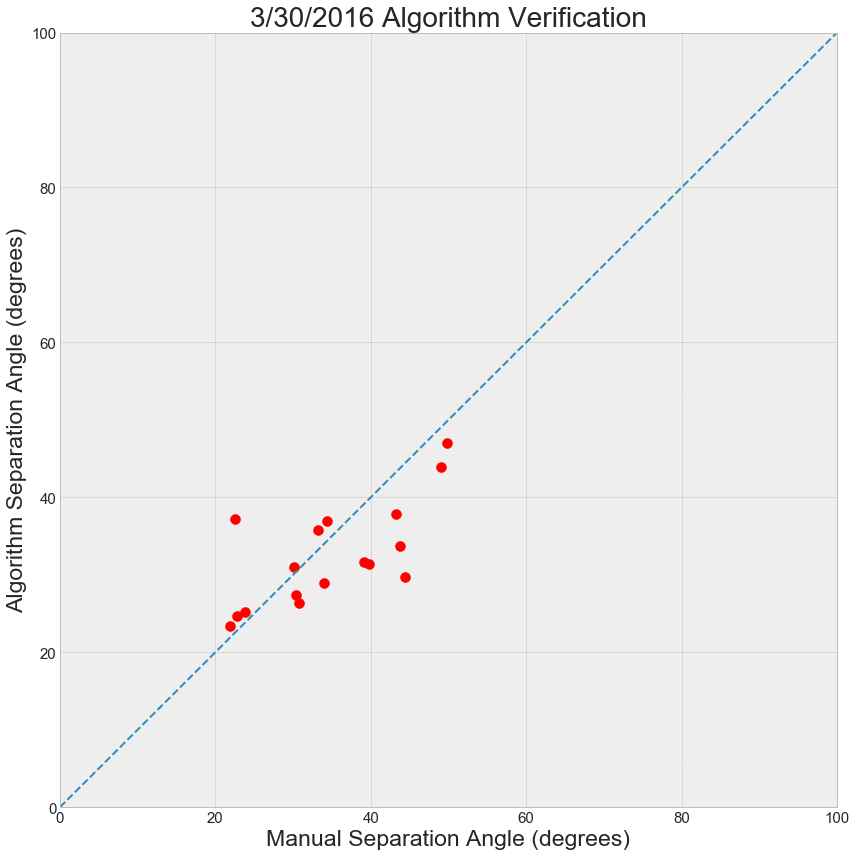

In [232]:
plt.style.use('bmh')
fig = plt.figure(1, (12, 12))
#x = np.arange(0, len(arcshapefiles[1:21]), 1)
#plt.scatter(np.asarray(areasc), storm3_alg_f[0:40], label='3.5 dB Alg')
plt.scatter(sep_obs[13:], sep_alg[13:], color='r', s=100, alpha=1.0)
#plt.scatter(sep_obs[10:], sep_alg[10:], color='k', s=100, alpha=0.5)

#plt.scatter(np.asarray(areasc), storm5_alg_f[0:40], color='g', s=100, alpha=0.5)

plt.xlim(0,100)
plt.ylim(0,100)
plt.xticks(size=15)
plt.yticks(size=15)
plt.xlabel('Manual Separation Angle (degrees)', size=23)
plt.ylabel('Algorithm Separation Angle (degrees)', size=23)
plt.title('3/30/2016 Algorithm Verification', size=28)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
line = np.arange(0, 150, 1)
plt.plot(line, line, linestyle='--', linewidth=2)
#plt.text(100, 120, 'R=0.94', size=20)
plt.tight_layout()
#plt.savefig('AlgAngleVerif.png')
plt.show()

In [233]:
ind_s = 0
sep_obs_s = sep_obs[ind_s:]
sep_alg_s = sep_alg[ind_s:]
sep_obs1s = sep_obs_s[~np.isnan(sep_obs_s)]
sep_alg1s = sep_alg_s[~np.isnan(sep_obs_s)]
sep_obs2s = sep_obs1s[~np.isnan(sep_alg1s)]
sep_alg2s = sep_alg1s[~np.isnan(sep_alg1s)]


sep_obs1 = sep_obs[~np.isnan(sep_obs)]
sep_alg1 = sep_alg[~np.isnan(sep_obs)]
sep_obs2 = sep_obs1[~np.isnan(sep_alg1)]
sep_alg2 = sep_alg1[~np.isnan(sep_alg1)]

sep_spr = stats.spearmanr(sep_obs2, sep_alg2)
sep_sprs = stats.spearmanr(sep_obs2s, sep_alg2s)

print(sep_spr)
print(sep_sprs)

SpearmanrResult(correlation=0.777094017094017, pvalue=3.0230115328317694e-06)
SpearmanrResult(correlation=0.777094017094017, pvalue=3.0230115328317694e-06)


In [234]:
dist_kdp_zdr_obs1 = dist_kdp_zdr_obs[~np.isnan(dist_kdp_zdr_obs)]
dist_kdp_zdr_alg1 = dist_kdp_zdr_alg[~np.isnan(dist_kdp_zdr_obs)]
dist_kdp_zdr_obs2 = dist_kdp_zdr_obs1[~np.isnan(dist_kdp_zdr_alg1)]
dist_kdp_zdr_alg2 = dist_kdp_zdr_alg1[~np.isnan(dist_kdp_zdr_alg1)]

dist_kdp_zdr_spr = stats.spearmanr(dist_kdp_zdr_obs2, dist_kdp_zdr_alg2)
print(dist_kdp_zdr_spr)

SpearmanrResult(correlation=0.76, pvalue=6.66307550682022e-06)


In [235]:
sepdiff = sep_obs - sep_alg

print(np.nanmean(np.abs(sepdiff)))
print(np.nanmedian(np.abs(sepdiff)))

6.546942055572946
5.238991668004303


In [236]:
print(arc_alg_cenlats)
print(np.nanmean(sep_alg[12:27]))
print(np.nanmedian(sep_alg[12:27]))

[nan, nan, nan, nan, nan, nan, 30.81791720308029, 30.83104769019548, 30.844122672215562, 30.856348671776985, 30.86542667522198, 30.866498097961337, 30.874783204670628, 30.87977199244051, 30.888325768388317, 30.900384070021893, 30.906820925831287, 30.918076103717045, 30.931503512712748, 30.940370909268314, 30.953030213356715, 30.953661349006605, 30.956616278121082, 30.967537804434603, 30.963906539245336, 30.987506497150214, 30.993538254277105, 31.00192941704266, 31.00419411459525, 31.013109653815416, 31.0181582485328, 31.0285906359967, 31.037684303006703, 31.04654267622598, 31.04609065728358, 31.057628854068817]
32.07751241524899
31.430749468284944


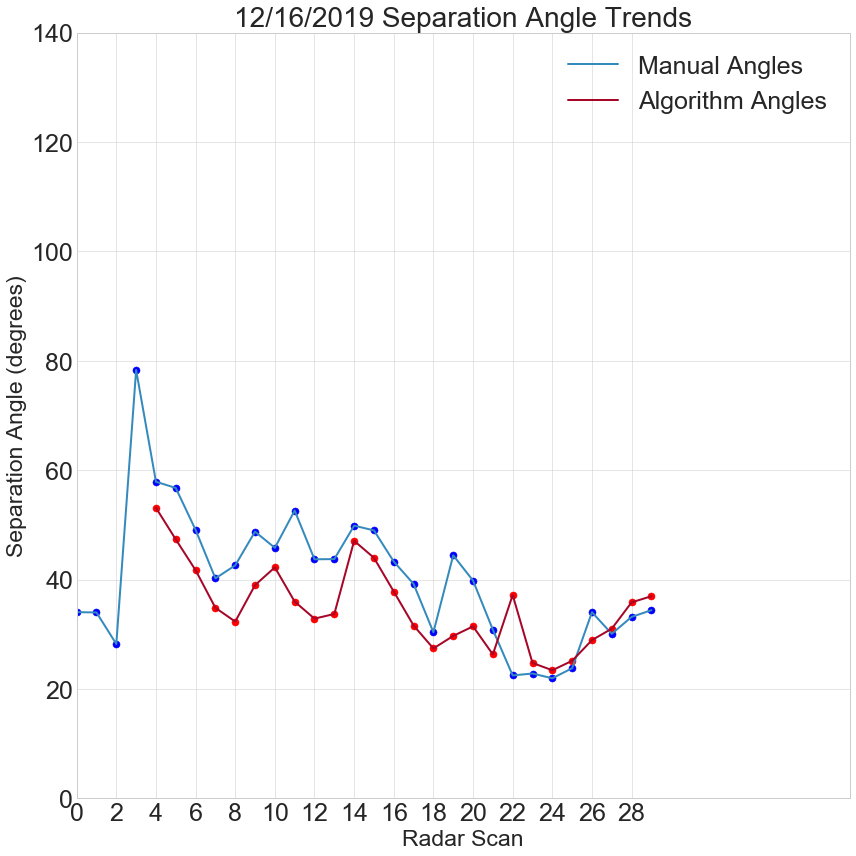

In [237]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(arcshapefilesc), 1)
x1 = np.arange(0, len(arcshapefiles[0:21]), 1)
plt.plot(x, sep_obs, label='Manual Angles')
plt.scatter(x, sep_obs, color='blue', s=50)

#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
plt.plot(x, sep_alg, label='Algorithm Angles')
plt.scatter(x, sep_alg, color='red', s=50)

#plt.plot(x, storm5_alg_f[0:40], label='Algorithm Areas')

plt.title('12/16/2019 Separation Angle Trends', size=28)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('Radar Scan', size=23)
plt.ylabel('Separation Angle (degrees)', size=23)
plt.ylim(0, 140)
plt.xlim(0, 39)
plt.xticks(x[::2], size=25)
plt.yticks(size=25)
plt.legend(fontsize=25)
plt.tight_layout()
#plt.savefig('SeparationAngleSeries.png')
plt.show()

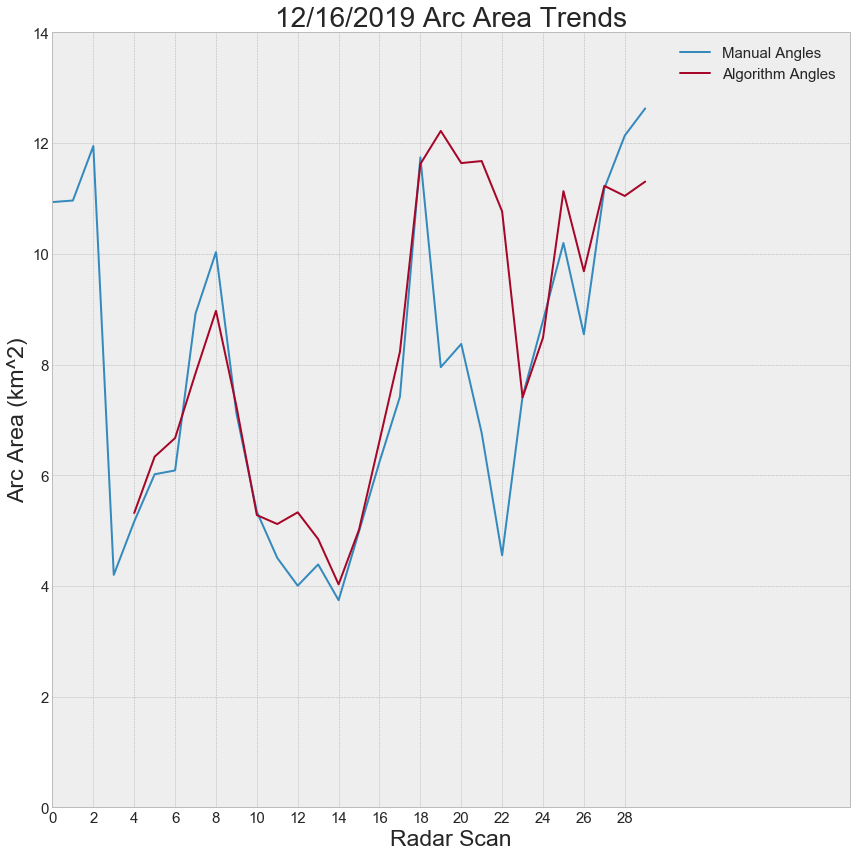

In [238]:
plt.style.use('bmh')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(arcshapefilesc), 1)
x1 = np.arange(0, len(arcshapefiles[0:21]), 1)
plt.plot(x, dist_kdp_zdr_obs, label='Manual Angles')
#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
plt.plot(x, dist_kdp_zdr_alg, label='Algorithm Angles')
#plt.plot(x, storm5_alg_f[0:40], label='Algorithm Areas')

plt.title('12/16/2019 Arc Area Trends', size=28)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('Radar Scan', size=23)
plt.ylabel('Arc Area (km^2)', size=23)
plt.ylim(0, 14)
plt.xlim(0, 39)
plt.xticks(x[::2], size=15)
plt.yticks(size=15)
plt.legend(fontsize=15)
plt.tight_layout()
#plt.savefig('ArcTimeSeries.png')
plt.show()

In [239]:
print(sepdiff)

[         nan          nan          nan          nan   4.76281767
   9.40442399   7.37468276   5.37650159  10.28034739   9.77911532
   3.57088213  16.65102694  10.84465647  10.03741452   2.76832106
   5.00861161   5.4817348    7.60445269   2.95328511  14.73639262
   8.36873965   4.51927569 -14.70088278  -1.92930892  -1.46950826
  -1.3511273    5.10148175  -0.93680949  -2.6560123   -2.55268062]


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([4., 5., 6., 0., 3., 4., 1., 0., 2., 1.]),
 array([ 0.93680949,  2.50823123,  4.07965298,  5.65107472,  7.22249647,
         8.79391821, 10.36533996, 11.9367617 , 13.50818345, 15.07960519,
        16.65102694]),
 <a list of 10 Patch objects>)

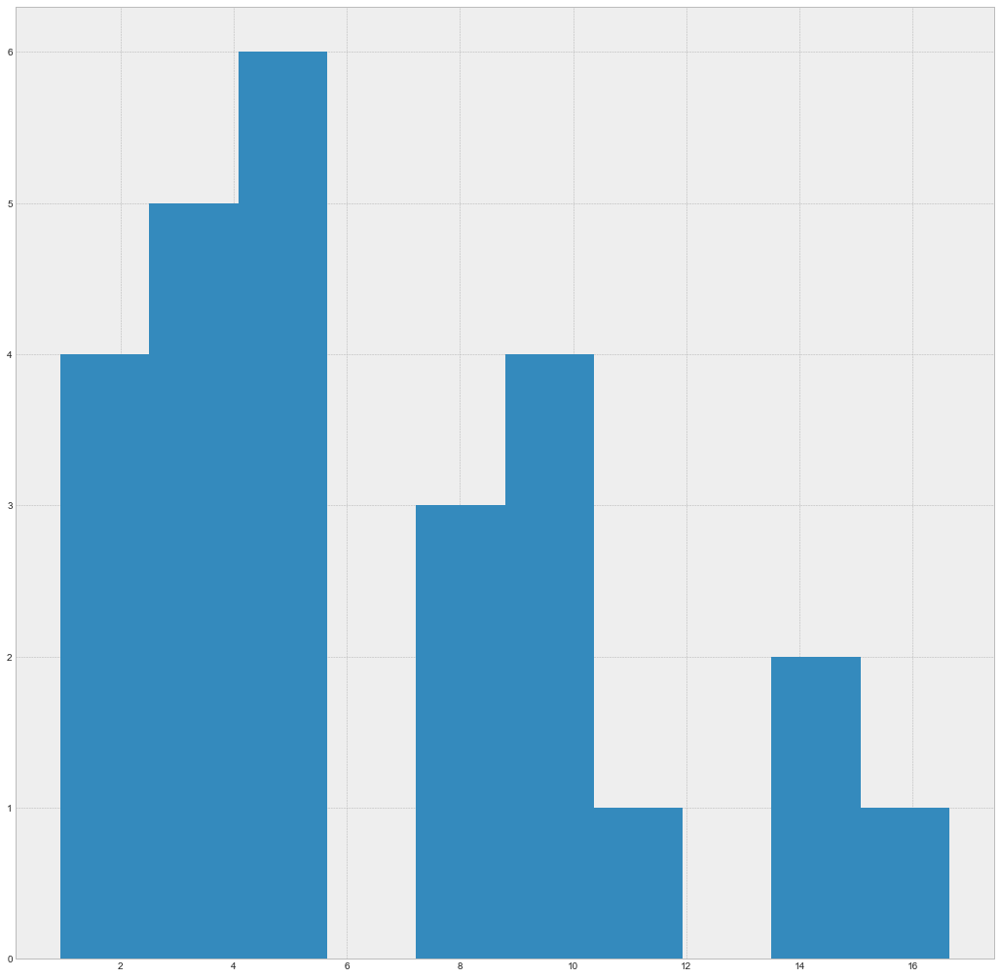

In [240]:
plt.figure(1, figsize=(18,18))
plt.hist(np.abs(sepdiff))

In [241]:
import pickle

In [242]:
# pickle.dump(areasc, open( "comp_arc_MW_area.pkl", "wb" ) )
# pickle.dump(footareasc, open( "comp_foot_MW_area.pkl", "wb" ) )
# pickle.dump(sep_obs, open( "comp_MW_angle.pkl", "wb" ) )


In [243]:
import numpy as np
from shapely import geometry
from shapely.ops import transform
from metpy.units import atleast_1d, check_units, concatenate, units
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from pyproj import Geod

In [244]:
masks_vdb = []
paul_e_gone = []
for file_3 in os.listdir('VDB_ZDR'):
    #print(file_3)
    if file_3.endswith('.shp'):
        
        file_1 = geopandas.read_file('VDB_ZDR/'+file_3)  
        filematrix1 = file_1['geometry']
        imasks = []
        for p in range(len(filematrix1)):
            polygon=filematrix1[p]
            boundary = np.asarray(polygon.boundary.xy)
            polypath = Path(boundary.transpose())
            #paul_e_gone.append(polypath)
            coord_map = np.vstack((rlons_2d.flatten(), rlats_2d.flatten())).T 
            mask = polypath.contains_points(coord_map).reshape(rlons_2d.shape)
            imasks.append(mask)
        print(imasks)
        sum_mask = np.sum(np.asarray(imasks), axis=0, dtype=bool)
        masks_vdb.append(sum_mask)

[array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       

[array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       

[array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       

       [False, False, False, ..., False, False, False]])]
[array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])]
[array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
    

[array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       

[array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       

In [245]:
print(filematrix1)

0    POLYGON ((-93.10788830010523 31.05361397770973...
1    POLYGON ((-92.97414194184044 31.04166713525035...
2    POLYGON ((-92.9027522734856 31.07051438899373,...
Name: geometry, dtype: object


In [246]:
lmasks_vdb = []
#paul_e_gone = []
u = 0
for file_3 in os.listdir('VDB_ZDR'):
    print(file_3)
    if file_3.endswith('.shp'):
        
        file_1 = geopandas.read_file('VDB_ZDR/'+file_3)  
        filematrix1 = file_1['geometry']
        imasks = []
        for p in range(len(filematrix1)):
            polygon=filematrix1[p]
            boundary = np.asarray(polygon.boundary.xy)
            polypath = Path(boundary.transpose())
            #paul_e_gone.append(polypath)
            coord_map = np.vstack((lon_arrays[u+2].flatten(), lat_arrays[u+2].flatten())).T 
            mask = polypath.contains_points(coord_map).reshape(lon_arrays[u+2].shape)
            imasks.append(mask)
        sum_mask = np.sum(imasks, axis=0, dtype=bool)
        lmasks_vdb.append(sum_mask)
        u = u+1

164451zdr.dbf
164451zdr.prj
164451zdr.qpj
164451zdr.shp
164451zdr.shx
164624zdr.dbf
164624zdr.prj
164624zdr.qpj
164624zdr.shp
164624zdr.shx
164802zdr.dbf
164802zdr.prj
164802zdr.qpj
164802zdr.shp
164802zdr.shx
164958zdr.dbf
164958zdr.prj
164958zdr.qpj
164958zdr.shp
164958zdr.shx
165119zdr.dbf
165119zdr.prj
165119zdr.qpj
165119zdr.shp
165119zdr.shx
165255zdr.dbf
165255zdr.prj
165255zdr.qpj
165255zdr.shp
165255zdr.shx
165435zdr.dbf
165435zdr.prj
165435zdr.qpj
165435zdr.shp
165435zdr.shx
165626zdr.dbf
165626zdr.prj
165626zdr.qpj
165626zdr.shp
165626zdr.shx
165745zdr.dbf
165745zdr.prj
165745zdr.qpj
165745zdr.shp
165745zdr.shx
165920zdr.dbf
165920zdr.prj
165920zdr.qpj
165920zdr.shp
165920zdr.shx
170058zdr.dbf
170058zdr.prj
170058zdr.qpj
170058zdr.shp
170058zdr.shx
170254zdr.dbf
170254zdr.prj
170254zdr.qpj
170254zdr.shp
170254zdr.shx
170415zdr.dbf
170415zdr.prj
170415zdr.qpj
170415zdr.shp
170415zdr.shx
170551zdr.dbf
170551zdr.prj
170551zdr.qpj
170551zdr.shp
170551zdr.shx
170732zdr.dbf
170732

In [247]:
lmasks_mw = []
#paul_e_gone = []
u = 0
for file_3 in os.listdir('Deridder_storm/MW_arcs'):
    print(file_3)
    if file_3.endswith('.shp'):
        
        file_1 = geopandas.read_file('Deridder_storm/MW_arcs/'+file_3)  
        filematrix1 = file_1['geometry']
        imasks = []
        for p in range(len(filematrix1)):
            polygon=filematrix1[p]
            boundary = np.asarray(polygon.boundary.xy)
            polypath = Path(boundary.transpose())
            #paul_e_gone.append(polypath)
            coord_map = np.vstack((lon_arrays[u+2].flatten(), lat_arrays[u+2].flatten())).T 
            mask = polypath.contains_points(coord_map).reshape(lon_arrays[u+2].shape)
            imasks.append(mask)
        sum_mask = np.sum(imasks, axis=0, dtype=bool)
        lmasks_mw.append(sum_mask)
        u = u+1

arcscan01.cpg
arcscan01.dbf
arcscan01.prj
arcscan01.qpj
arcscan01.shp
arcscan01.shx
arcscan02.cpg
arcscan02.dbf
arcscan02.prj
arcscan02.qpj
arcscan02.shp
arcscan02.shx
arcscan03.cpg
arcscan03.dbf
arcscan03.prj
arcscan03.qpj
arcscan03.shp
arcscan03.shx
arcscan04.cpg
arcscan04.dbf
arcscan04.prj
arcscan04.qpj
arcscan04.shp
arcscan04.shx
arcscan05.cpg
arcscan05.dbf
arcscan05.prj
arcscan05.qpj
arcscan05.shp
arcscan05.shx
arcscan06.cpg
arcscan06.dbf
arcscan06.prj
arcscan06.qpj
arcscan06.shp
arcscan06.shx
arcscan07.cpg
arcscan07.dbf
arcscan07.prj
arcscan07.qpj
arcscan07.shp
arcscan07.shx
arcscan08.cpg
arcscan08.dbf
arcscan08.prj
arcscan08.qpj
arcscan08.shp
arcscan08.shx
arcscan09.cpg
arcscan09.dbf
arcscan09.prj
arcscan09.qpj
arcscan09.shp
arcscan09.shx
arcscan10.cpg
arcscan10.dbf
arcscan10.prj
arcscan10.qpj
arcscan10.shp
arcscan10.shx
arcscan11.cpg
arcscan11.dbf
arcscan11.prj
arcscan11.qpj
arcscan11.shp
arcscan11.shx
arcscan12.cpg
arcscan12.dbf
arcscan12.prj
arcscan12.qpj
arcscan12.shp
arcsca

In [248]:
#print(paul_e_gone[20])

In [249]:
print(coord_map)

[[-92.99621604  31.14695868]
 [-92.99858095  31.14597982]
 [-93.0009458   31.14500092]
 ...
 [-97.21588979  29.25895589]
 [-97.21814723  29.25789015]
 [-97.22040491  29.25682423]]


In [250]:
print(masks_vdb[22][masks_vdb[22]==True])
print(lmasks_vdb[22][lmasks_vdb[22]==True])

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True]
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True 

In [251]:
print(filematrix[0])

POLYGON ((-96.00969805384136 36.3278398552242, -95.99947618252472 36.3278398552242, -95.99509538053188 36.31761798390756, -95.99436524686641 36.3081262462564, -95.99144471220451 36.29717424127429, -95.99144471220451 36.2854921026267, -96.00458711818304 36.27234969664817, -96.02065005882348 36.26504835999343, -96.03817326679486 36.25628675600774, -96.05715674209718 36.24752515202205, -96.07614021739953 36.23876354803636, -96.09731409369826 36.23219234504709, -96.10899623234585 36.22927181038519, -96.10534556401848 36.24022381536731, -96.09950449469468 36.24752515202205, -96.10388529668752 36.25044568668395, -96.11994823732796 36.24095394903278, -96.12359890565533 36.24679501835657, -96.10534556401848 36.25482648867679, -96.09293329170541 36.25993742433511, -96.08052101939235 36.26431822632795, -96.06591834608287 36.27307983031364, -96.05058553910791 36.28330170163028, -96.03890340046033 36.29206330561597, -96.03233219747106 36.30447557792903, -96.02503086081632 36.30885637992188, -96.00

In [252]:
zdr_VDB = np.copy(ZDRmasked1)
zdr_VDB[~masks_vdb[18]] = np.nan

C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:32: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


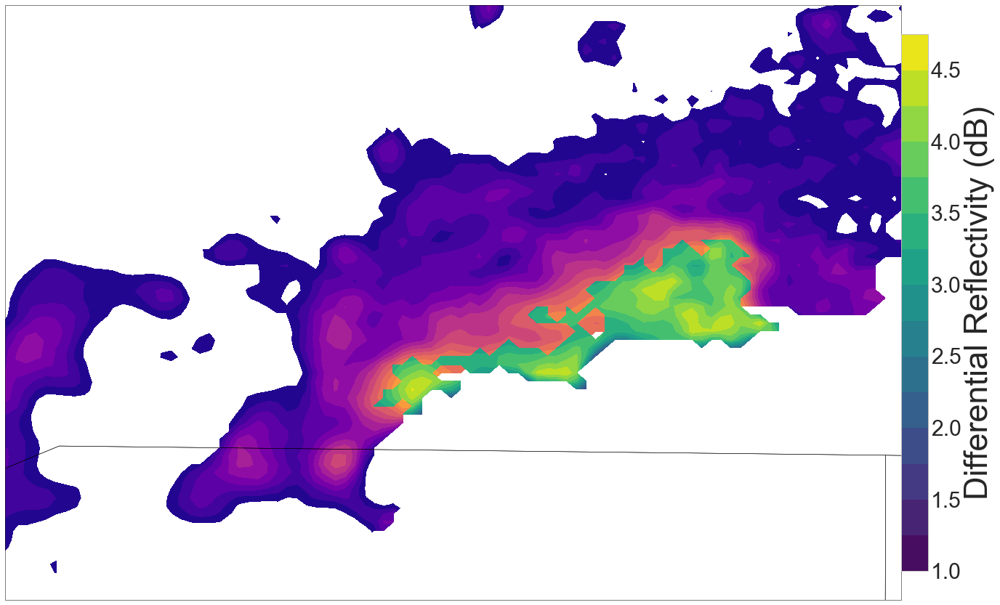

In [253]:
%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL1[0],UR1[0],LL1[1],UR1[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
#refp = ax.pcolormesh(lon_arrays[51], lat_arrays[51], zdr_arrays[51], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
zdrlevs = np.arange(1, 5, 0.25)
refg1 = ax.contourf(rlons_2d, rlats_2d, ZDRmasked1, zdrlevs, cmap=plt.cm.plasma)
refg = ax.contourf(rlons_2d, rlats_2d, zdr_VDB, zdrlevs, cmap=plt.cm.viridis)
cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Differential Reflectivity (dB)",size = 45)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)

#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
#patch = PathPatch(arc_outlines4[35][0], facecolor = 'none', edgecolor='purple', linewidth=7)
#ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('PapergridZDR.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
#plt.
plt.show()

In [254]:
#Get these fields for every grid
#Get the data out of the grid object we need
#Get the data from the grid
ZDRs = []
REFs = []
ZDRms = []
lon_g = []
lat_g = []
for grida in grids:
    ZDRg = grida.fields['differential_reflectivity']['data'][0]
    REFg = grida.fields['reflectivity']['data'][0]
    CCg = grida.fields['cross_correlation_ratio']['data'][0]
    KDPg = grida.fields['KDP']['data'][0]
    #Mask everything below 20dbz on the grid
    ZDRmaskedg = ma.masked_where(REFg < 20, ZDRg)
    REFmaskedg = ma.masked_where(REFg < 20, REFg)
    CCmaskedg = ma.masked_where(REFg < 20, CCg)
    KDPmaskedg = ma.masked_where(REFg < 35, KDPg)
    KDPmaskedg = ma.filled(KDPmaskedg, fill_value=-2)
    #Extract the gridded lats and lons
    rlonsg = grida.point_longitude['data']
    rlatsg = grida.point_latitude['data']
    rlons_2dg = rlonsg[0,:,:]
    rlats_2dg = rlatsg[0,:,:]
    ZDRs.append(ZDRg)
    REFs.append(REFg)
    ZDRms.append(ZDRmaskedg)
    lon_g.append(rlons_2dg)
    lat_g.append(rlats_2dg)


C:\Users\matts\AppData\Local\Continuum\anaconda3\envs\radar\lib\site-packages\ipykernel_launcher.py:41: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


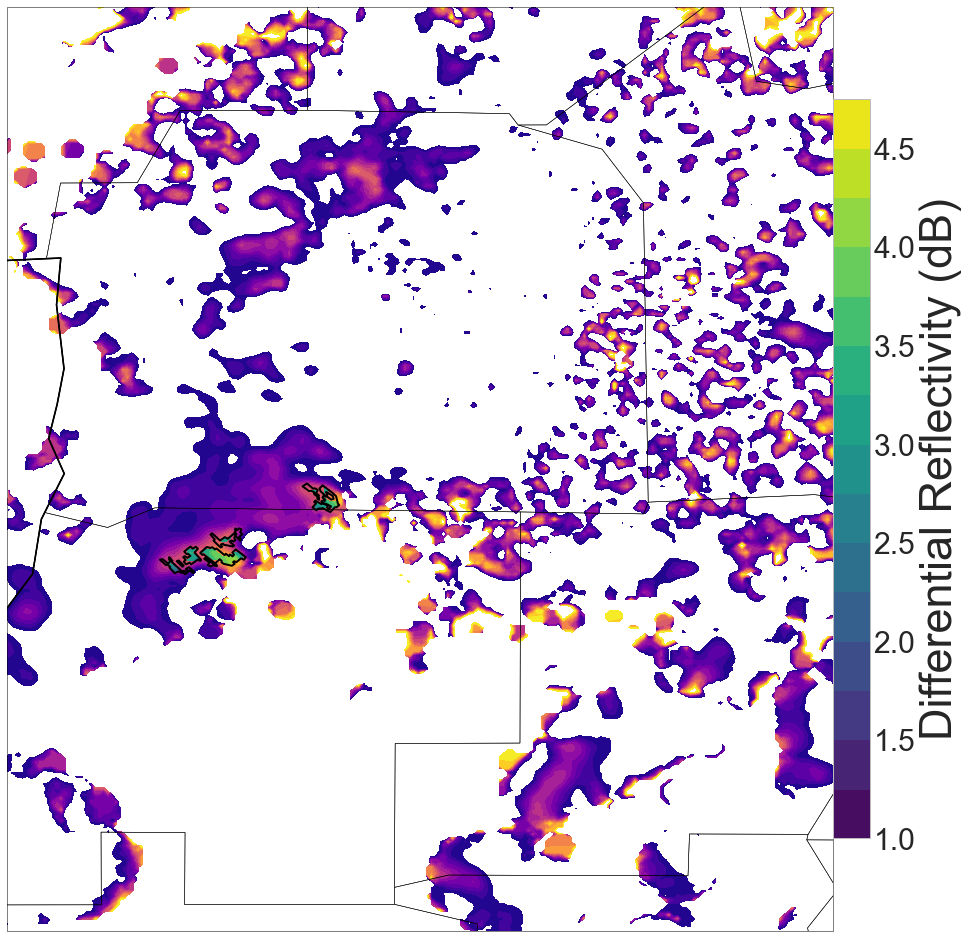

In [255]:
i_time = 7

zdr_VDB = np.copy(ZDRs[i_time])
zdr_VDB[~masks_vdb[i_time-2]] = np.nan


%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
LL2 = crs.transform_point(cenlon-0.5,cenlat-0.5,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon+0.5,cenlat+0.5,ccrs.PlateCarree())
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
#ax.add_feature(arcshapefiles[20], edgecolor = 'green', linewidth = 1.5)
#polygons = []
#for i in range(len(arcshapefiles)):
#    arc = ax.add_feature(arcshapefiles[i], edgecolor = plt.cm.inferno(i*10), facecolor = plt.cm.inferno(i*10), linewidth=1.5, alpha=0.5)
#    polygons.append(arc)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
#refp = ax.pcolormesh(ungrid_lons, ungrid_lats, zdr_c, cmap=plt.cm.magma, vmin = 1, vmax = 6)
#refp = ax.pcolormesh(lon_arrays[51], lat_arrays[51], zdr_arrays[51], cmap=plt.cm.viridis, vmin = 1, vmax = 5)
zdrlevs = np.arange(1, 5, 0.25)
refg1 = ax.contourf(lon_g[i_time], lat_g[i_time], ZDRs[i_time], zdrlevs, cmap=plt.cm.plasma)
refg = ax.contourf(lon_g[i_time], lat_g[i_time], zdr_VDB, zdrlevs, cmap=plt.cm.viridis)
cg1 = plt.colorbar(refg, shrink=0.80, pad=0)
cg1.ax.tick_params(labelsize=30)
cg1.set_label("Differential Reflectivity (dB)",size = 45)
#refp = ax.pcolormesh(tlons, tlats, ref_c, cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
ax.add_feature(VDB_arc_outlines[i_time-2], edgecolor = 'k', facecolor='none', alpha=1.0, linewidth = 2, zorder=3)

#ax.add_feature(arcshapefilesc[35], edgecolor = 'blue', facecolor='none', alpha=0.5, linewidth = 7)
#patch = PathPatch(arc_outlines4[35][0], facecolor = 'none', edgecolor='purple', linewidth=7)
#ax.add_patch(patch)
plt.tight_layout()
#plt.savefig('PapergridZDR.png')
#ax.add_feature(arcshapefiles[2], edgecolor = 'red', linewidth = 1.5)
#ax.add_feature(arcshapefiles[9], edgecolor = 'gold', linewidth = 1.5)
#ax.add_feature(arcshapefiles[15], edgecolor = 'blue', linewidth = 1.5)
#plt.
plt.show()

In [256]:
print(np.nanmean(zdr_VDB))
print(zdr_VDB[~np.isnan(zdr_VDB)])

3.152425
[2.19157   2.2318976 1.4510579 2.6099026 2.5993927 2.7607536 2.8756752
 2.3826556 3.7720888 4.0723515 2.4422097 2.818605  3.0965369 2.9660568
 2.599762  2.6444118 3.3739052 3.8072307 3.895604  3.973331  4.0771008
 4.1840253 3.8866956 3.1792996 3.0043538 3.3916242 3.7058365 3.9089465
 3.9633634 4.021448  4.0280714 3.856637  3.1872385 2.3819723 3.217574
 3.285493  3.1091177 3.2142289 3.4849546 3.8770168 3.8428216 3.0824363
 2.7653472 2.844737  2.9825516 3.0648303 3.0206723 3.3477736 3.5942264
 2.7848184 3.1530254 3.2670367 3.1954389 3.1520312 3.0205772 1.6858281
 2.5370991 2.0842881 2.2919195 2.5877573 2.8011336 3.059732  3.046137
 2.9408014 2.9973958 3.1981626 3.2823708 3.6269214 3.7768037 3.1256952
 3.209504  3.572034  3.734265  4.0422783 3.016425  3.032684  3.1509264
 3.2755969 3.0317185 3.0928178 3.1589212 3.2036    2.916393  2.6761599]


Text(0.5, 1.0, '17:17 UTC / Scan 20')

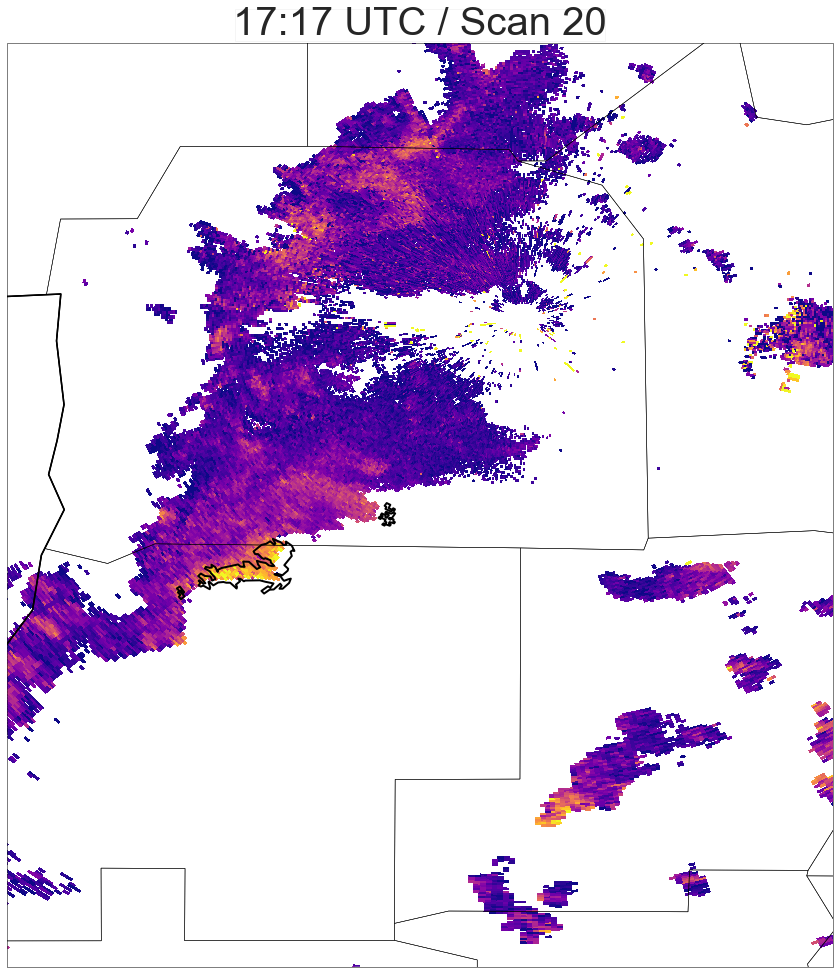

In [257]:
time1 = 7

zdr_VDBr = np.copy(zdr_arrays[time1+2])
zdr_VDBr[~lmasks_vdb[time1]] = np.nan

%matplotlib inline
#plt.style.use('bmh')
# Choose Forecast Hour (FH), FH = 0 is the first hour of dataset
# You can change and rerun this cell to get the different forecast hour
# LL2 = crs.transform_point(cenlon-0.20,cenlat-0.13,ccrs.PlateCarree())
# UR2 = crs.transform_point(cenlon+0.08,cenlat+0.13,ccrs.PlateCarree())
LL2 = crs.transform_point(cenlon-0.5,cenlat-0.5,ccrs.PlateCarree())
UR2 = crs.transform_point(cenlon+0.5,cenlat+0.5,ccrs.PlateCarree())
FH = 0
fig=plt.figure(1,figsize=(26.,17.))
ax = plt.subplot(111,projection=ccrs.PlateCarree())
#   ax.set_extent([west long, east long, south lat, north lat])
ax.set_extent([LL2[0],UR2[0],LL2[1],UR2[1]],crs)
ax.coastlines('50m',edgecolor='black',linewidth=0.75)
ax.add_feature(counties, edgecolor = 'black', linewidth = 0.5)
ax.add_feature(states, edgecolor = 'black', linewidth = 1.5)
refp = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], zdr_arrays[time1+2], cmap=plt.cm.plasma, vmin = 0, vmax = 5)
#refp1 = ax.pcolormesh(lon_arrays[time1+2], lat_arrays[time1+2], zdr_VDBr, cmap=plt.cm.viridis, vmin = 0, vmax = 5)

#refp = ax.pcolormesh(lon_arrays[time1], lat_arrays[time1], refl_arrays[time1], cmap=plt.cm.gist_ncar, vmin = 10, vmax = 73)
# ax.add_feature(arcshapefilesc[time1], edgecolor = 'blue', facecolor='none', alpha=1.0, linewidth = 7, zorder=4)
ax.add_feature(VDB_arc_outlines[time1], edgecolor = 'k', facecolor='none', alpha=1.0, linewidth = 2, zorder=3)
# for j in range(len(arc_outlines4[time1+2])):
#             patch = PathPatch(arc_outlines4[time1+2][j], facecolor = 'none', alpha=1.0, edgecolor='cyan', linewidth=7, linestyle='--', zorder=10)
#             ax.add_patch(patch)
plt.title('17:17 UTC / Scan 20', size = 40, bbox={'facecolor':'white','pad':-2})
#plt.savefig("ZDR_catastrophe.png")

In [258]:
print(np.nanmean(zdr_VDBr))

4.090161


In [259]:
VDB_zdrmeans_r = []
VDB_zdrmeans_rm = []
VDB_zdr10max_rm = []
VDB_zdr10max_r = []

for time1 in range(0, len(lmasks_vdb), 1):
    print(time1)
    zdr_VDBr = np.copy(zdr_arrays[time1+2])
    zdr_VDBr[~lmasks_vdb[time1]] = np.nan
    
    zdr_VDBrm = np.copy(zdr_arrays[time1+2])
    zdr_VDBrm[refl_arrays[time1+2] < 20] = np.nan
    zdr_VDBrm[~lmasks_vdb[time1]] = np.nan
    
    mean_zdr_vdbr = np.nanmean(zdr_VDBr)
    VDB_zdrmeans_r.append(mean_zdr_vdbr)
    
    mean_zdr_vdbrm = np.nanmean(zdr_VDBrm)
    VDB_zdrmeans_rm.append(mean_zdr_vdbrm)
    
    ZDRsorted = np.sort(zdr_VDBrm[~np.isnan(zdr_VDBrm)])[::-1]
    print(np.nanmean(ZDRsorted[0:10]))
    VDB_zdr10max_rm.append(np.nanmean(ZDRsorted[0:10]))
    
    ZDRsortedr = np.sort(zdr_VDBr[~np.isnan(zdr_VDBr)])[::-1]
    print(np.nanmean(ZDRsortedr[0:10]))
    VDB_zdr10max_r.append(np.nanmean(ZDRsortedr[0:10]))

0
4.68125
7.225
1
4.8625
5.9375
2
4.24375
6.05
3
4.58125
5.725
4
5.06875
6.15
5
5.9125
7.5625
6
5.96875
7.6
7
5.85625
7.29375
8
5.35
6.0625
9
5.8375
6.70625
10
5.49375
7.20625
11
5.45
6.73125
12
5.4
6.05
13
6.2875
7.075
14
5.64375
5.93125
15
6.275
6.88125
16
6.08125
7.06875
17
6.3
6.51875
18
5.91875
6.4125
19
5.4375
6.6625
20
5.6875
6.575
21
5.225
6.2625
22
4.86875
5.275
23
5.575
7.14375
24
6.41875
6.41875
25
6.1875
6.1875
26
6.83125
6.83125
27
7.3
7.3375
28
6.6875
7.0
29
7.3625
7.93125


In [260]:
MW_zdrmeans_r = []
MW_zdrmeans_rm = []
MW_zdr10max_rm = []
MW_zdr10max_r = []

for time1 in range(0, len(lmasks_mw), 1):
    print(time1)
    zdr_MWr = np.copy(zdr_arrays[time1+2])
    zdr_MWr[~lmasks_mw[time1]] = np.nan
    
    zdr_MWrm = np.copy(zdr_arrays[time1+2])
    zdr_MWrm[refl_arrays[time1+2] < 20] = np.nan
    zdr_MWrm[~lmasks_mw[time1]] = np.nan
    
    mean_zdr_mwr = np.nanmean(zdr_MWr)
    MW_zdrmeans_r.append(mean_zdr_mwr)
    
    mean_zdr_mwrm = np.nanmean(zdr_MWrm)
    MW_zdrmeans_rm.append(mean_zdr_mwrm)
    
    ZDRsorted = np.sort(zdr_MWrm[~np.isnan(zdr_MWrm)])[::-1]
    print(np.nanmean(ZDRsorted[0:10]))
    MW_zdr10max_rm.append(np.nanmean(ZDRsorted[0:10]))
    
    ZDRsortedr = np.sort(zdr_MWr[~np.isnan(zdr_MWr)])[::-1]
    print(np.nanmean(ZDRsortedr[0:10]))
    MW_zdr10max_r.append(np.nanmean(ZDRsortedr[0:10]))

0
4.55
7.3
1
4.625
5.9375
2
4.24375
5.64375
3
4.45
4.69375
4
5.06875
5.69375
5
5.9125
6.99375
6
5.96875
7.06875
7
5.85625
7.0125
8
5.35
6.3
9
5.875
6.2125
10
5.49375
5.9375
11
5.44375
6.73125
12
5.35
6.05
13
6.325
6.55625
14
5.64375
5.93125
15
6.20625
6.84375
16
6.08125
7.06875
17
6.3
6.51875
18
5.91875
6.4125
19
5.4375
6.35625
20
5.625
6.36875
21
5.10625
5.2625
22
4.70625
4.71875
23
5.71875
5.71875
24
6.41875
6.41875
25
5.98125
5.98125
26
6.875
6.875
27
7.3
7.3375
28
6.6875
7.0375
29
7.3625
7.9375


In [261]:
VDB_zdrmeans_grid = []
for time1 in range(0, len(masks_vdb), 1):
    print(time1)
    zdr_VDB = np.copy(ZDRs[time1])
    zdr_VDB[~masks_vdb[time1-2]] = np.nan
    
    mean_zdr_vdb = np.nanmean(zdr_VDB)
    VDB_zdrmeans_grid.append(mean_zdr_vdb)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29


In [262]:
print(VDB_zdrmeans_r)
print(VDB_zdrmeans_rm)

print(VDB_zdrmeans_grid)

[4.5775, 4.242857, 4.0490055, 3.941265, 3.9762168, 4.213289, 4.266591, 4.090161, 3.7108696, 3.9451478, 3.808609, 3.9546568, 3.8996794, 4.0053573, 3.9153302, 3.9922593, 3.8675077, 3.8907237, 3.7909737, 3.6716418, 3.5525618, 3.3756473, 3.4048533, 3.5885978, 3.7566922, 3.5976374, 3.7949162, 3.8052278, 3.8478541, 3.7246568]
[3.828629, 4.0128675, 3.661111, 3.747845, 3.8060663, 3.9561298, 4.0927286, 3.9988937, 3.790519, 3.9076798, 3.8290815, 3.8406458, 3.7935855, 3.9722633, 3.8828502, 3.9464285, 3.8559833, 3.8947523, 3.778392, 3.6226938, 3.5349677, 3.4386892, 3.4480715, 3.5915291, 3.7566922, 3.5976374, 3.7949088, 3.8172584, 3.8622556, 3.727107]
[0.14481102, 0.5155757, 2.8870873, 3.2829964, 3.1467516, 2.5324774, 2.800663, 3.152425, 3.534977, 3.4645023, 3.2871938, 3.2791297, 2.998584, 3.1447866, 3.1263378, 3.1979425, 3.338422, 3.4866974, 3.5205076, 3.555137, 3.6171165, 3.4631734, 3.3324556, 3.143304, 3.0386367, 3.2833693, 3.4229648, 3.398237, 3.6317284, 3.7213795]


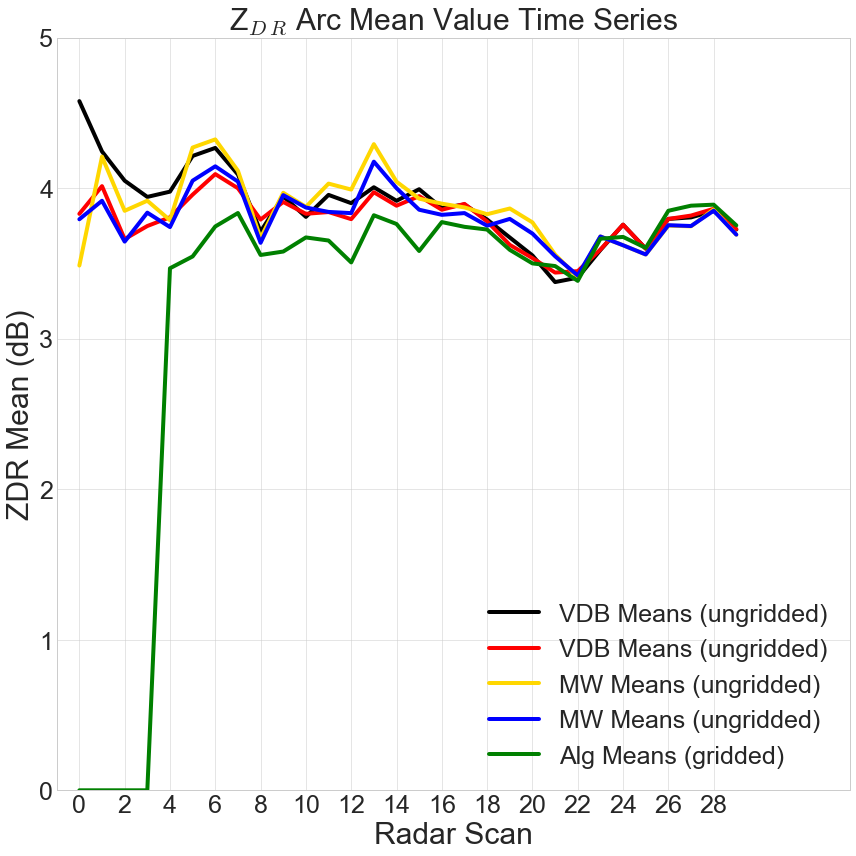

In [296]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(VDB_zdrmeans_r), 1)
#x2 = np.arange(0, len(alg_footarea), 1)
plt.plot(x, np.asarray(VDB_zdrmeans_r), color='k',label='VDB Means (ungridded)', linewidth=4)
plt.plot(x, np.asarray(VDB_zdrmeans_rm), color='r',label='VDB Means (ungridded)', linewidth=4)
plt.plot(x, np.asarray(MW_zdrmeans_r), color='gold',label='MW Means (ungridded)', linewidth=4)
plt.plot(x, np.asarray(MW_zdrmeans_rm), color='b',label='MW Means (ungridded)', linewidth=4)
#plt.plot(x, np.asarray(VDB_zdrmeans_grid), color='blue',label='VDB Means (gridded)', linewidth=4)
plt.plot(x[:], np.asarray(storm1_mean_f[2:32]), color='green',label='Alg Means (gridded)', linewidth=4)

#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
#plt.plot(x, storm4_alg_f[0:40], label='Algorithm Areas')
#plt.plot(x2[2:32]-2, alg_footarea[2:32], color='cyan',label='Algorithm Areas', linestyle='--', linewidth=4)

plt.title('Z$_D$$_R$ Arc Mean Value Time Series', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('Radar Scan', size=30)
plt.ylabel('ZDR Mean (dB)', size=30)
plt.ylim(0, 5)
plt.xlim(-1, 34)
plt.xticks(x[::2], size=25)
plt.yticks(size=25)
plt.legend(fontsize=25)
plt.tight_layout()
#plt.savefig('PaperFootTimeSeries_revised_cyan.png')
plt.show()

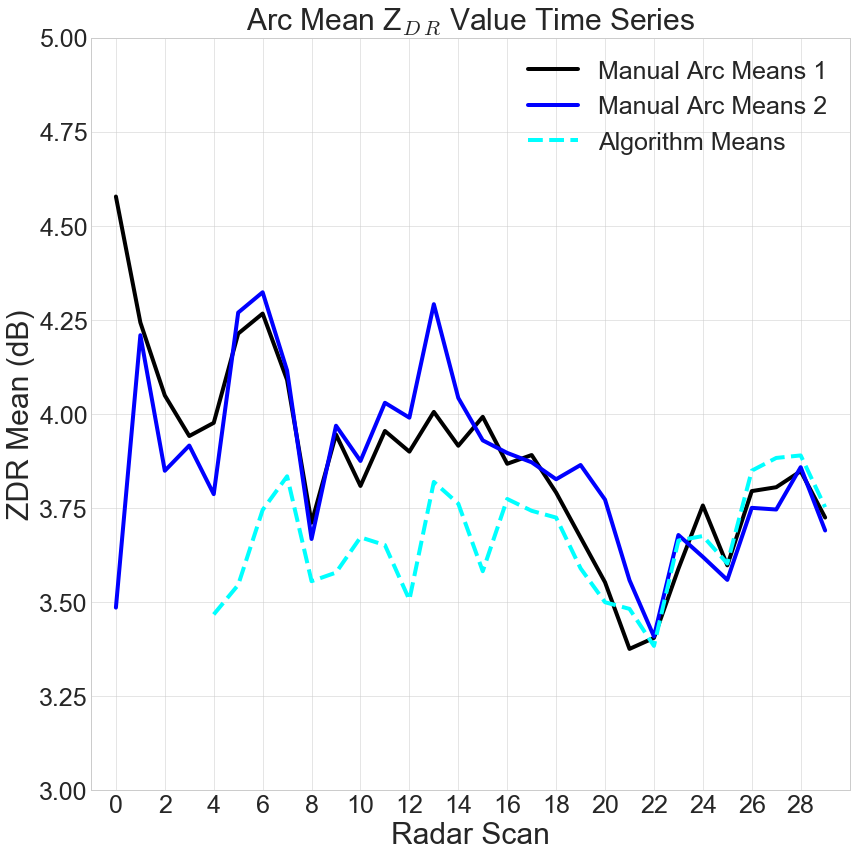

In [297]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(VDB_zdrmeans_r), 1)
#x2 = np.arange(0, len(alg_footarea), 1)
plt.plot(x, np.asarray(VDB_zdrmeans_r), color='k',label='Manual Arc Means 1', linewidth=4)
#plt.plot(x, np.asarray(VDB_zdrmeans_rm), color='r',label='VDB Means (ungridded)', linewidth=4)
storm1_zdrmeansr_adj = np.copy(storm1_mean_f)
storm1_zdrmeansr_adj[storm1_zdrmeansr_adj==0] = np.nan
plt.plot(x, np.asarray(MW_zdrmeans_r), color='blue',label='Manual Arc Means 2', linewidth=4)
#plt.plot(x, np.asarray(MW_zdrmeans_rm), color='b',label='MW Means (ungridded)', linewidth=4)
#plt.plot(x, np.asarray(VDB_zdrmeans_grid), color='blue',label='VDB Means (gridded)', linewidth=4)
plt.plot(x[:], np.asarray(storm1_zdrmeansr_adj[2:32]), color='cyan',label='Algorithm Means', linewidth=4, linestyle='--')

#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
#plt.plot(x, storm4_alg_f[0:40], label='Algorithm Areas')
#plt.plot(x2[2:32]-2, alg_footarea[2:32], color='cyan',label='Algorithm Areas', linestyle='--', linewidth=4)

plt.title('Arc Mean Z$_D$$_R$ Value Time Series', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('Radar Scan', size=30)
plt.ylabel('ZDR Mean (dB)', size=30)
plt.ylim(3, 5)
plt.xlim(-1, 30)
plt.xticks(x[::2], size=25)
plt.yticks(size=25)
plt.legend(fontsize=25)
plt.tight_layout()
#plt.savefig('PaperArcMeanTimeSeries_revised_r.png')
plt.show()

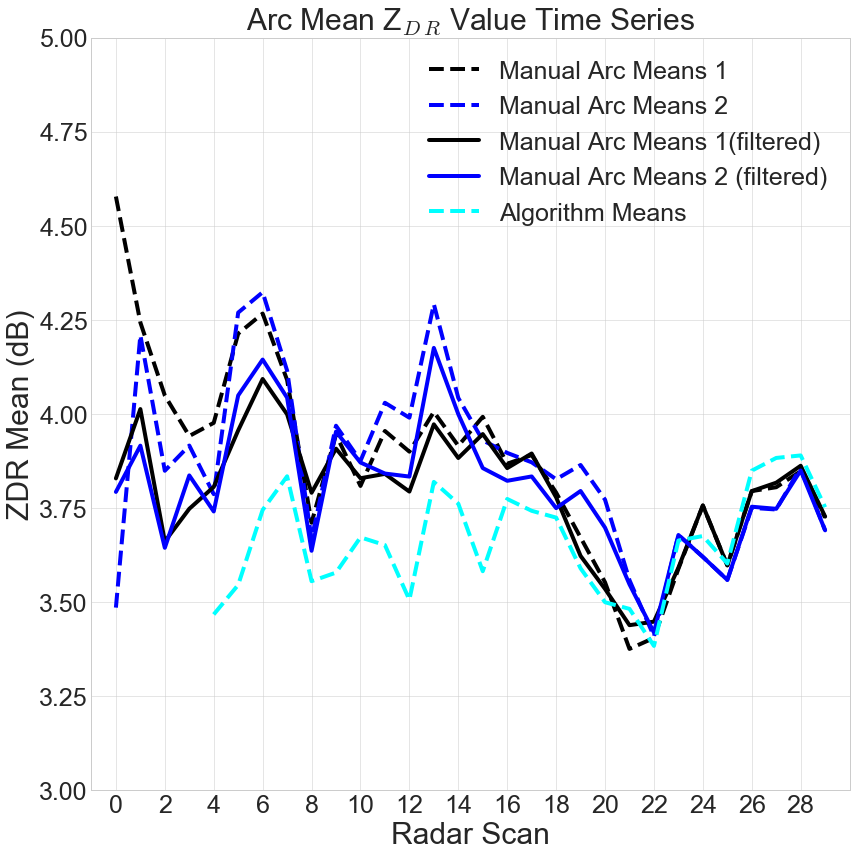

In [298]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(VDB_zdrmeans_r), 1)
#x2 = np.arange(0, len(alg_footarea), 1)
plt.plot(x, np.asarray(VDB_zdrmeans_r), color='k',label='Manual Arc Means 1', linewidth=4, linestyle='--')
plt.plot(x, np.asarray(MW_zdrmeans_r), color='blue',label='Manual Arc Means 2', linewidth=4, linestyle='--')
plt.plot(x, np.asarray(VDB_zdrmeans_rm), color='k',label='Manual Arc Means 1(filtered)', linewidth=4)
#plt.plot(x, np.asarray(VDB_zdrmeans_rm), color='r',label='VDB Means (ungridded)', linewidth=4)
storm1_zdrmeansr_adj = np.copy(storm1_mean_f)
storm1_zdrmeansr_adj[storm1_zdrmeansr_adj==0] = np.nan
plt.plot(x, np.asarray(MW_zdrmeans_rm), color='blue',label='Manual Arc Means 2 (filtered)', linewidth=4)
#plt.plot(x, np.asarray(MW_zdrmeans_rm), color='b',label='MW Means (ungridded)', linewidth=4)
#plt.plot(x, np.asarray(VDB_zdrmeans_grid), color='blue',label='VDB Means (gridded)', linewidth=4)
plt.plot(x[:], np.asarray(storm1_zdrmeansr_adj[2:32]), color='cyan',label='Algorithm Means', linewidth=4, linestyle='--')

#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
#plt.plot(x, storm4_alg_f[0:40], label='Algorithm Areas')
#plt.plot(x2[2:32]-2, alg_footarea[2:32], color='cyan',label='Algorithm Areas', linestyle='--', linewidth=4)

plt.title('Arc Mean Z$_D$$_R$ Value Time Series', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('Radar Scan', size=30)
plt.ylabel('ZDR Mean (dB)', size=30)
plt.ylim(3, 5)
plt.xlim(-1, 30)
plt.xticks(x[::2], size=25)
plt.yticks(size=25)
plt.legend(fontsize=25)
plt.tight_layout()
#plt.savefig('PaperArcMeanTimeSeries_newforest_all.png')
plt.show()

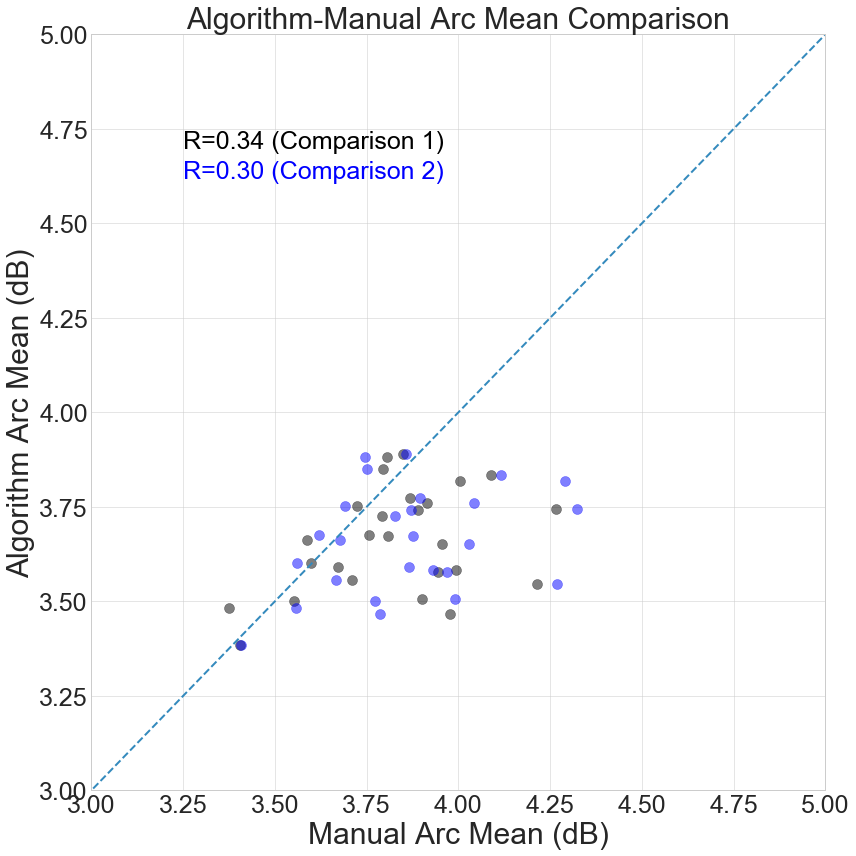

In [299]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
#x = np.arange(0, len(arcshapefiles[1:21]), 1)
#plt.scatter(np.asarray(areasc), storm3_alg_f[0:40], label='3.5 dB Alg')
plt.scatter(np.asarray(VDB_zdrmeans_r), storm1_zdrmeansr_adj[2:32], color='k', s=100, alpha=0.5, label='Manual Comparison 1')
plt.scatter(np.asarray(MW_zdrmeans_r), storm1_zdrmeansr_adj[2:32], color='b', s=100, alpha=0.5, label='Manual Comparison 2')

#plt.scatter(np.asarray(areasc), storm5_alg_f[0:40], color='g', s=100, alpha=0.5)

plt.xlim(3,5)
plt.ylim(3,5)
plt.xticks(size=25)
plt.yticks(size=25)
plt.xlabel('Manual Arc Mean (dB)', size=30)
plt.ylabel('Algorithm Arc Mean (dB)', size=30)
plt.title('Algorithm-Manual Arc Mean Comparison', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
line = np.arange(0, 140, 1)
plt.plot(line, line, linestyle='--', linewidth=2)
plt.text(3.25, 4.7, 'R=0.34 (Comparison 1)', size=25, color='k')
plt.text(3.25, 4.62, 'R=0.30 (Comparison 2)', size=25, color='b')

plt.tight_layout()
#plt.savefig('PaperMeanScatterVerif_revised_r.png')
plt.show()

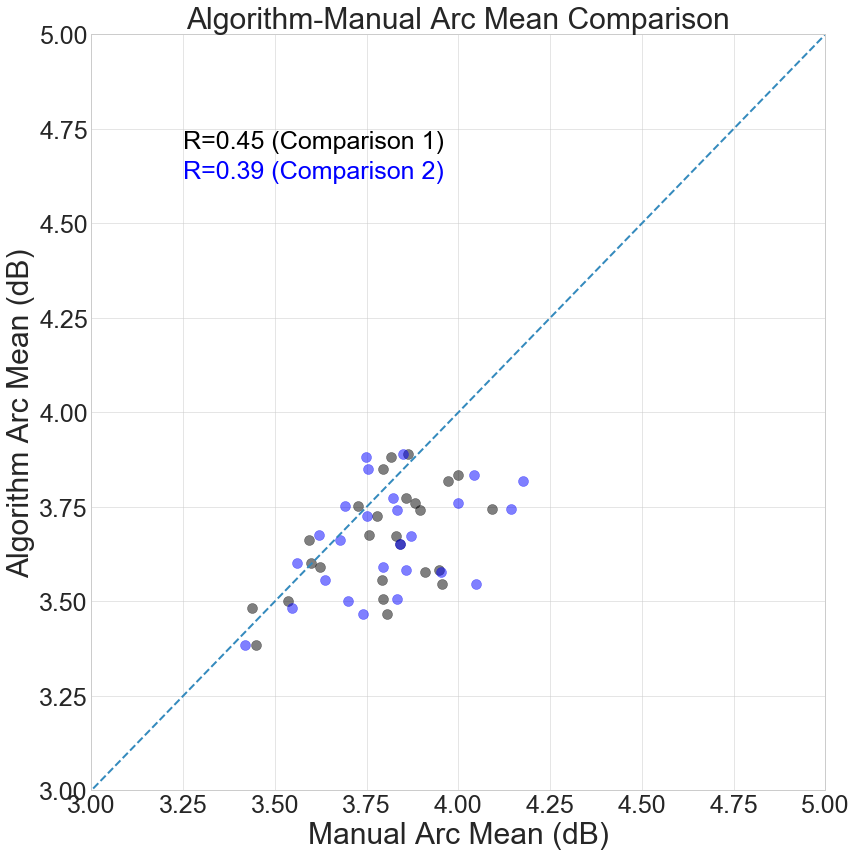

In [320]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
#x = np.arange(0, len(arcshapefiles[1:21]), 1)
#plt.scatter(np.asarray(areasc), storm3_alg_f[0:40], label='3.5 dB Alg')
plt.scatter(np.asarray(VDB_zdrmeans_rm), storm1_zdrmeansr_adj[2:32], color='k', s=100, alpha=0.5, label='Manual Comparison 1')
plt.scatter(np.asarray(MW_zdrmeans_rm), storm1_zdrmeansr_adj[2:32], color='b', s=100, alpha=0.5, label='Manual Comparison 2')

#plt.scatter(np.asarray(areasc), storm5_alg_f[0:40], color='g', s=100, alpha=0.5)

plt.xlim(3,5)
plt.ylim(3,5)
plt.xticks(size=25)
plt.yticks(size=25)
plt.xlabel('Manual Arc Mean (dB)', size=30)
plt.ylabel('Algorithm Arc Mean (dB)', size=30)
plt.title('Algorithm-Manual Arc Mean Comparison', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
line = np.arange(0, 140, 1)
plt.plot(line, line, linestyle='--', linewidth=2)
plt.text(3.25, 4.7, 'R=0.45 (Comparison 1)', size=25, color='k')
plt.text(3.25, 4.62, 'R=0.39 (Comparison 2)', size=25, color='b')

plt.tight_layout()
#plt.savefig('PaperMeanScatterVerif_newforest_rm.png')
plt.show()

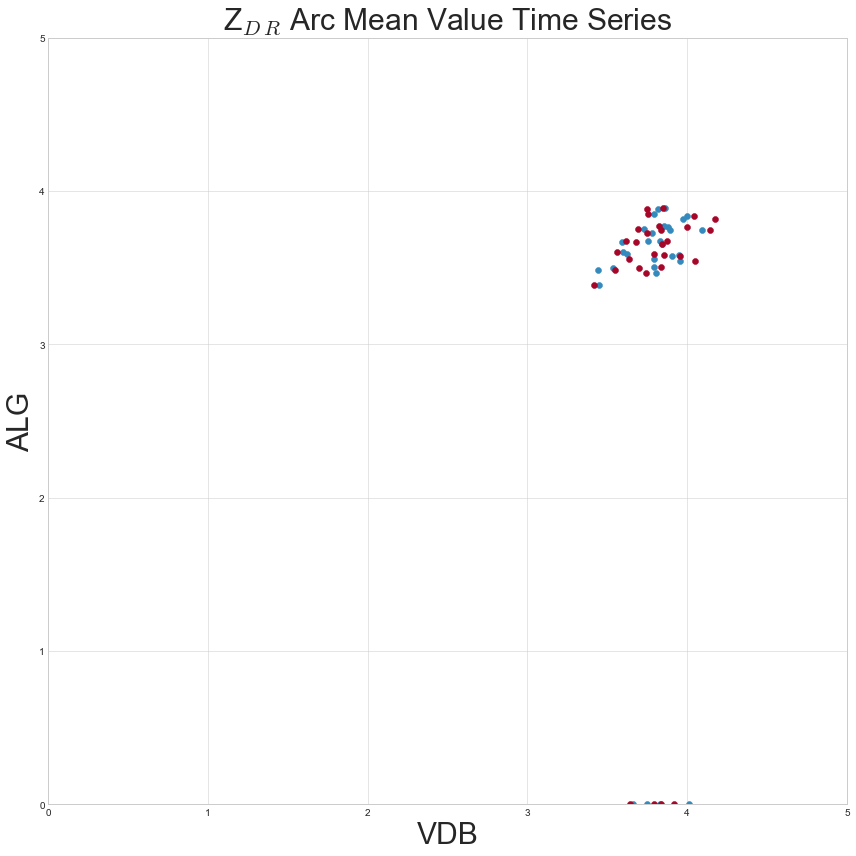

In [301]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(VDB_zdrmeans_r), 1)
#x2 = np.arange(0, len(alg_footarea), 1)
plt.scatter(VDB_zdrmeans_rm, storm1_mean_f[2:32])
plt.scatter(MW_zdrmeans_rm, storm1_mean_f[2:32])

#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
#plt.plot(x, storm4_alg_f[0:40], label='Algorithm Areas')
#plt.plot(x2[2:32]-2, alg_footarea[2:32], color='cyan',label='Algorithm Areas', linestyle='--', linewidth=4)

plt.title('Z$_D$$_R$ Arc Mean Value Time Series', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('VDB', size=30)
plt.ylabel('ALG', size=30)
plt.ylim(0, 5)
plt.xlim(0, 5)
plt.legend(fontsize=25)
plt.tight_layout()
#plt.savefig('PaperFootTimeSeries_revised_cyan.png')
plt.show()

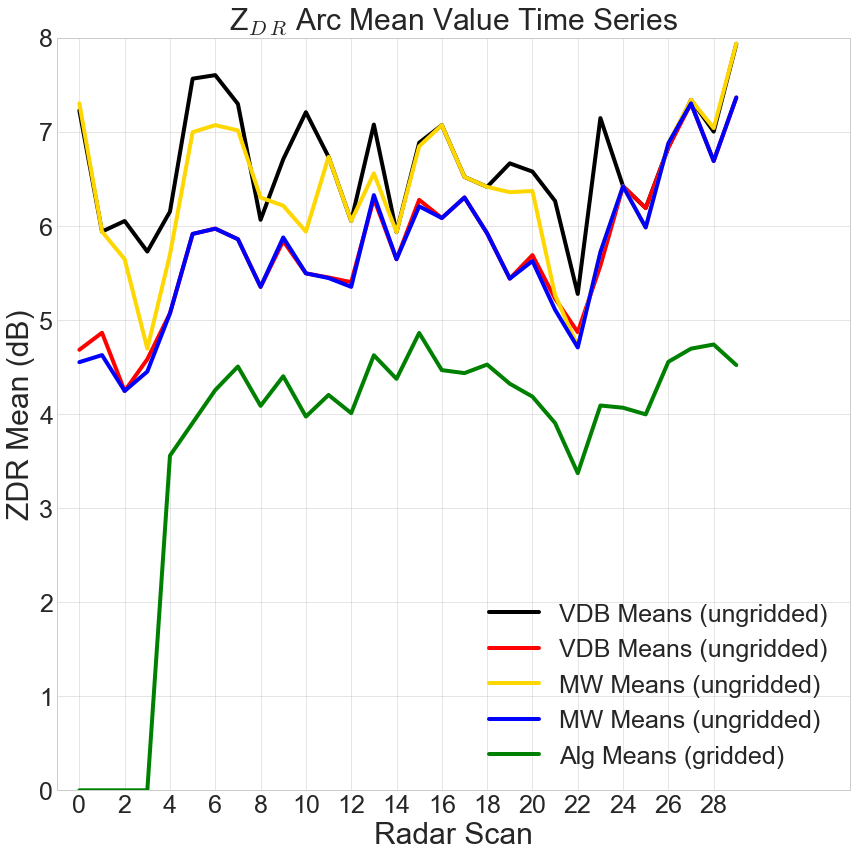

In [302]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(VDB_zdrmeans_r), 1)
#x2 = np.arange(0, len(alg_footarea), 1)
plt.plot(x, np.asarray(VDB_zdr10max_r), color='k',label='VDB Means (ungridded)', linewidth=4)
plt.plot(x, np.asarray(VDB_zdr10max_rm), color='r',label='VDB Means (ungridded)', linewidth=4)
plt.plot(x, np.asarray(MW_zdr10max_r), color='gold',label='MW Means (ungridded)', linewidth=4)
plt.plot(x, np.asarray(MW_zdr10max_rm), color='b',label='MW Means (ungridded)', linewidth=4)
#plt.plot(x, np.asarray(VDB_zdrmeans_grid), color='blue',label='VDB Means (gridded)', linewidth=4)
plt.plot(x[:], np.asarray(storm1_max_f[2:32]), color='green',label='Alg Means (gridded)', linewidth=4)

#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
#plt.plot(x, storm4_alg_f[0:40], label='Algorithm Areas')
#plt.plot(x2[2:32]-2, alg_footarea[2:32], color='cyan',label='Algorithm Areas', linestyle='--', linewidth=4)

plt.title('Z$_D$$_R$ Arc Mean Value Time Series', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('Radar Scan', size=30)
plt.ylabel('ZDR Mean (dB)', size=30)
plt.ylim(0, 8)
plt.xlim(-1, 34)
plt.xticks(x[::2], size=25)
plt.yticks(size=25)
plt.legend(fontsize=25)
plt.tight_layout()
#plt.savefig('PaperFootTimeSeries_revised_cyan.png')
plt.show()

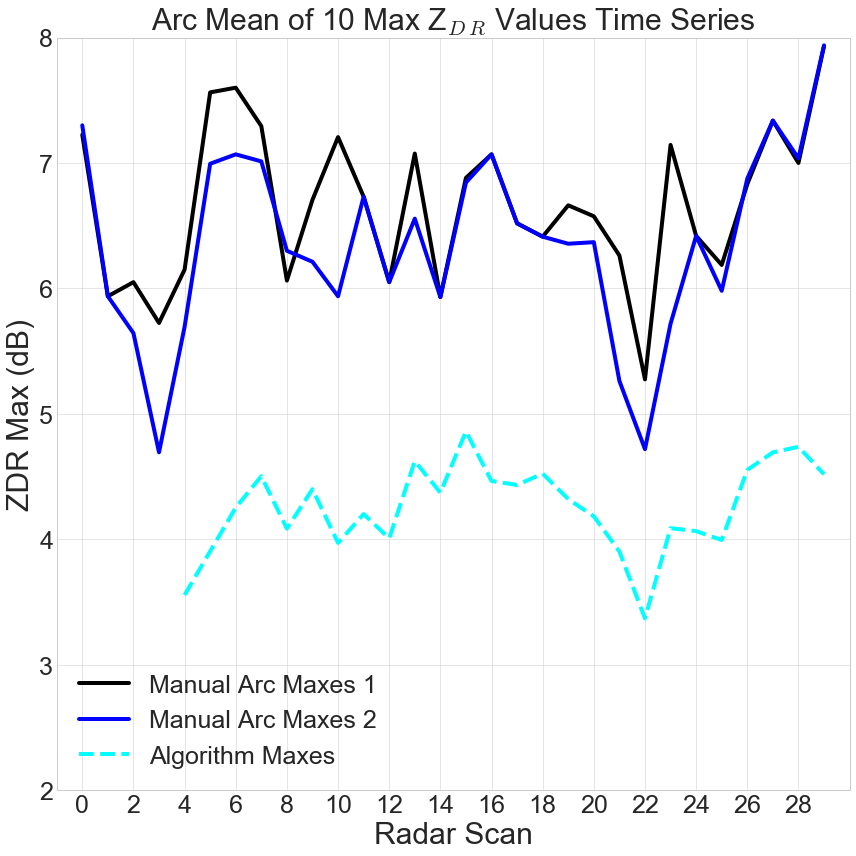

In [303]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(VDB_zdr10max_r), 1)
#x2 = np.arange(0, len(alg_footarea), 1)
plt.plot(x, np.asarray(VDB_zdr10max_r), color='k',label='Manual Arc Maxes 1', linewidth=4)
#plt.plot(x, np.asarray(VDB_zdrmeans_rm), color='r',label='VDB Means (ungridded)', linewidth=4)
storm1_zdrmaxesr_adj = np.copy(storm1_max_f)
storm1_zdrmaxesr_adj[storm1_zdrmaxesr_adj==0] = np.nan
plt.plot(x, np.asarray(MW_zdr10max_r), color='blue',label='Manual Arc Maxes 2', linewidth=4)
#plt.plot(x, np.asarray(MW_zdrmeans_rm), color='b',label='MW Means (ungridded)', linewidth=4)
#plt.plot(x, np.asarray(VDB_zdrmeans_grid), color='blue',label='VDB Means (gridded)', linewidth=4)
plt.plot(x[:], np.asarray(storm1_zdrmaxesr_adj[2:32]), color='cyan',label='Algorithm Maxes', linewidth=4, linestyle='--')

#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
#plt.plot(x, storm4_alg_f[0:40], label='Algorithm Areas')
#plt.plot(x2[2:32]-2, alg_footarea[2:32], color='cyan',label='Algorithm Areas', linestyle='--', linewidth=4)

plt.title('Arc Mean of 10 Max Z$_D$$_R$ Values Time Series', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('Radar Scan', size=30)
plt.ylabel('ZDR Max (dB)', size=30)
plt.ylim(2, 8)
plt.xlim(-1, 30)
plt.xticks(x[::2], size=25)
plt.yticks(size=25)
plt.legend(fontsize=25)
plt.tight_layout()
#plt.savefig('PaperMaxTimeSeries_revised_cyanr.png')
plt.show()

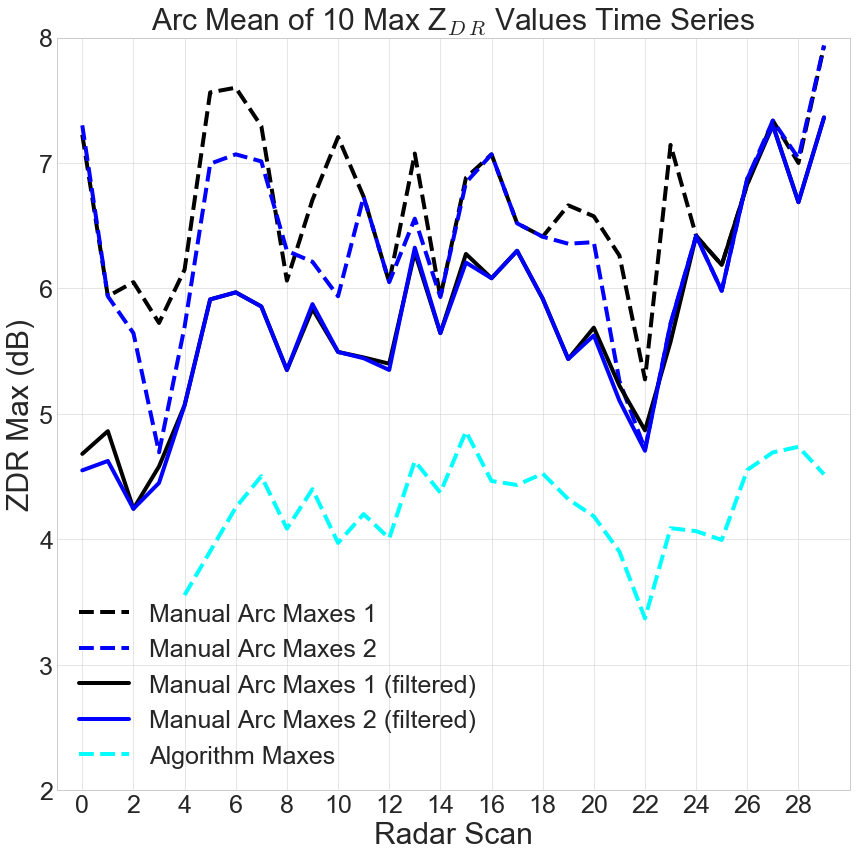

In [322]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(VDB_zdr10max_rm), 1)
#x2 = np.arange(0, len(alg_footarea), 1)
plt.plot(x, np.asarray(VDB_zdr10max_r), color='k',label='Manual Arc Maxes 1', linewidth=4, linestyle = '--')
plt.plot(x, np.asarray(MW_zdr10max_r), color='blue',label='Manual Arc Maxes 2', linewidth=4, linestyle = '--')
plt.plot(x, np.asarray(VDB_zdr10max_rm), color='k',label='Manual Arc Maxes 1 (filtered)', linewidth=4)
#plt.plot(x, np.asarray(VDB_zdrmeans_rm), color='r',label='VDB Means (ungridded)', linewidth=4)
storm1_zdrmaxesr_adj = np.copy(storm1_max_f)
storm1_zdrmaxesr_adj[storm1_zdrmaxesr_adj==0] = np.nan
plt.plot(x, np.asarray(MW_zdr10max_rm), color='blue',label='Manual Arc Maxes 2 (filtered)', linewidth=4)
#plt.plot(x, np.asarray(MW_zdrmeans_rm), color='b',label='MW Means (ungridded)', linewidth=4)
#plt.plot(x, np.asarray(VDB_zdrmeans_grid), color='blue',label='VDB Means (gridded)', linewidth=4)
plt.plot(x[:], np.asarray(storm1_zdrmaxesr_adj[2:32]), color='cyan',label='Algorithm Maxes', linewidth=4, linestyle='--')

#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
#plt.plot(x, storm4_alg_f[0:40], label='Algorithm Areas')
#plt.plot(x2[2:32]-2, alg_footarea[2:32], color='cyan',label='Algorithm Areas', linestyle='--', linewidth=4)

plt.title('Arc Mean of 10 Max Z$_D$$_R$ Values Time Series', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('Radar Scan', size=30)
plt.ylabel('ZDR Max (dB)', size=30)
plt.ylim(2, 8)
plt.xlim(-1, 30)
plt.xticks(x[::2], size=25)
plt.yticks(size=25)
plt.legend(fontsize=25)
plt.tight_layout()
#plt.savefig('PaperMaxTimeSeries_newforest_cyanall.png')
plt.show()

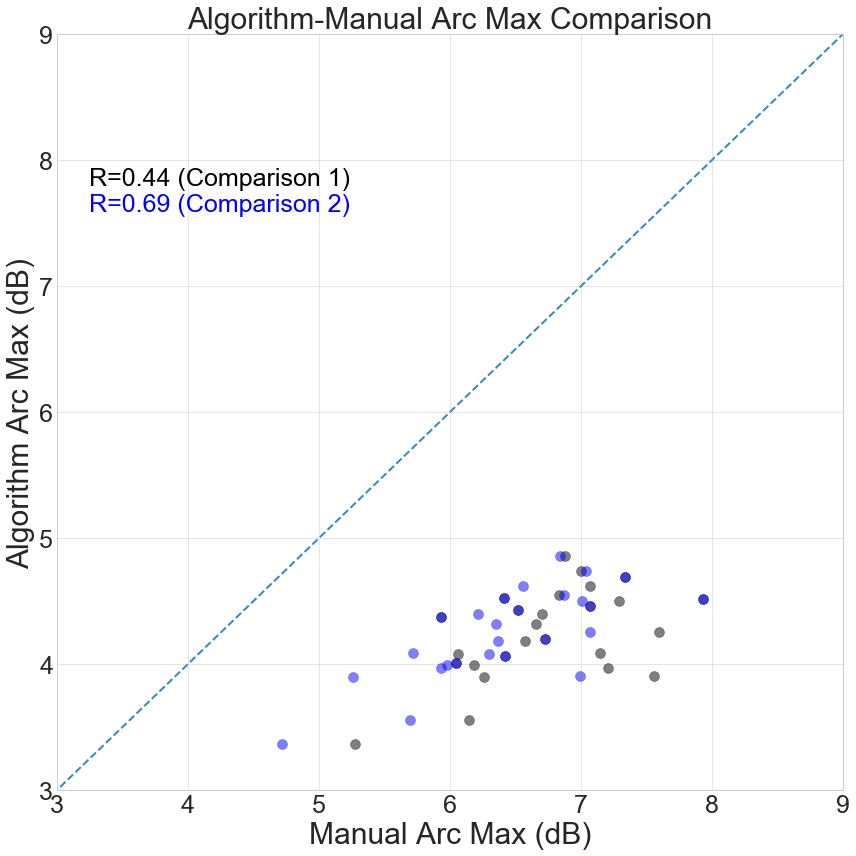

In [305]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
#x = np.arange(0, len(arcshapefiles[1:21]), 1)
#plt.scatter(np.asarray(areasc), storm3_alg_f[0:40], label='3.5 dB Alg')
plt.scatter(np.asarray(VDB_zdr10max_r), storm1_zdrmaxesr_adj[2:32], color='k', s=100, alpha=0.5, label='Manual Comparison 1')
plt.scatter(np.asarray(MW_zdr10max_r), storm1_zdrmaxesr_adj[2:32], color='b', s=100, alpha=0.5, label='Manual Comparison 2')

#plt.scatter(np.asarray(areasc), storm5_alg_f[0:40], color='g', s=100, alpha=0.5)

plt.xlim(3,9)
plt.ylim(3,9)
plt.xticks(size=25)
plt.yticks(size=25)
plt.xlabel('Manual Arc Max (dB)', size=30)
plt.ylabel('Algorithm Arc Max (dB)', size=30)
plt.title('Algorithm-Manual Arc Max Comparison', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
line = np.arange(0, 140, 1)
plt.plot(line, line, linestyle='--', linewidth=2)
plt.text(3.25, 7.8, 'R=0.44 (Comparison 1)', size=25, color='k')
plt.text(3.25, 7.60, 'R=0.69 (Comparison 2)', size=25, color='b')

plt.tight_layout()
#plt.savefig('PaperMaxScatterVerif_revised_r.png')
plt.show()

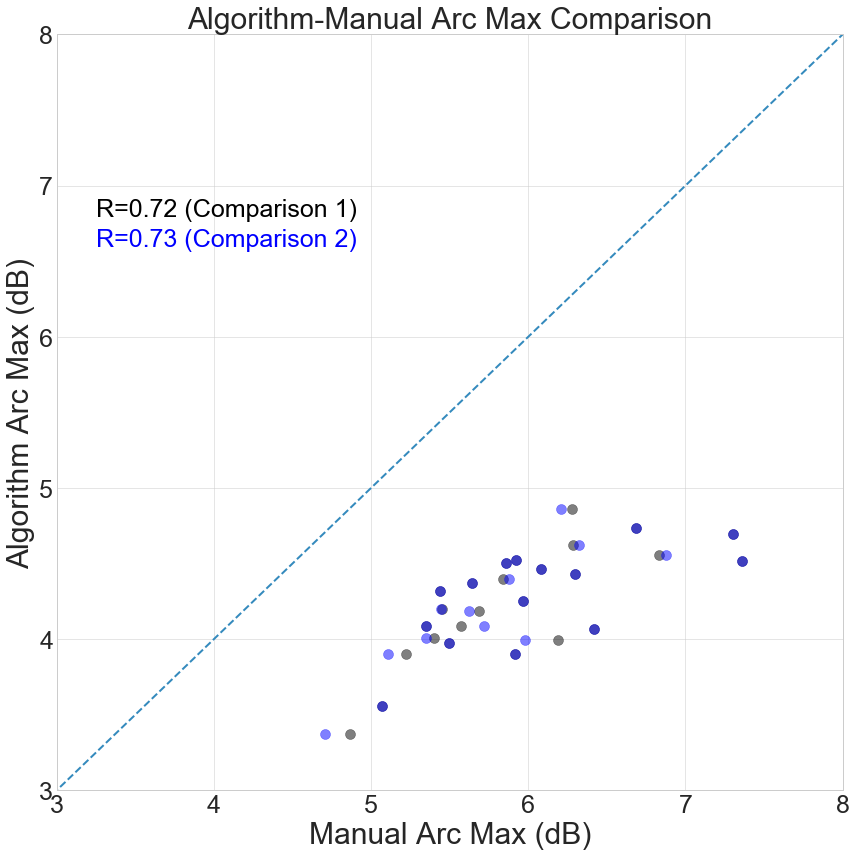

In [327]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
#x = np.arange(0, len(arcshapefiles[1:21]), 1)
#plt.scatter(np.asarray(areasc), storm3_alg_f[0:40], label='3.5 dB Alg')
plt.scatter(np.asarray(VDB_zdr10max_rm), storm1_zdrmaxesr_adj[2:32], color='k', s=100, alpha=0.5, label='Manual Comparison 1')
plt.scatter(np.asarray(MW_zdr10max_rm), storm1_zdrmaxesr_adj[2:32], color='b', s=100, alpha=0.5, label='Manual Comparison 2')

#plt.scatter(np.asarray(areasc), storm5_alg_f[0:40], color='g', s=100, alpha=0.5)

plt.xlim(3,8)
plt.ylim(3,8)
plt.xticks(size=25)
plt.yticks(size=25)
plt.xlabel('Manual Arc Max (dB)', size=30)
plt.ylabel('Algorithm Arc Max (dB)', size=30)
plt.title('Algorithm-Manual Arc Max Comparison', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
line = np.arange(0, 140, 1)
plt.plot(line, line, linestyle='--', linewidth=2)
plt.text(3.25, 6.8, 'R=0.72 (Comparison 1)', size=25, color='k')
plt.text(3.25, 6.6, 'R=0.73 (Comparison 2)', size=25, color='b')

plt.tight_layout()
#plt.savefig('PaperMaxScatterVerif_newforestrm.png')
plt.show()

In [307]:
print(VDB_zdr10max_rm)

[4.68125, 4.8625, 4.24375, 4.58125, 5.06875, 5.9125, 5.96875, 5.85625, 5.35, 5.8375, 5.49375, 5.45, 5.4, 6.2875, 5.64375, 6.275, 6.08125, 6.3, 5.91875, 5.4375, 5.6875, 5.225, 4.86875, 5.575, 6.41875, 6.1875, 6.83125, 7.3, 6.6875, 7.3625]


In [308]:
print(~np.isnan(storm1_zdrmaxesr_adj[2:32]))

[False False False False  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True]


In [309]:
vdb_zdrmax_r = np.copy(VDB_zdr10max_r)
alg_zdrmax_r = np.copy(storm1_zdrmaxesr_adj[2:32])
vdb_zdrmax_rm = np.copy(VDB_zdr10max_rm)

vdb_zdrmax_r = vdb_zdrmax_r[~np.isnan(alg_zdrmax_r)]
vdb_zdrmax_rm = vdb_zdrmax_rm[~np.isnan(alg_zdrmax_r)]
alg_zdrmax_r = alg_zdrmax_r[~np.isnan(alg_zdrmax_r)]


In [323]:
#Get correlations for these
vdb_10mr = stats.spearmanr(vdb_zdrmax_r, alg_zdrmax_r)
vdb_10mrm = stats.spearmanr(vdb_zdrmax_rm, alg_zdrmax_r)

print(vdb_10mr)
print(vdb_10mrm)

SpearmanrResult(correlation=0.4372649572649573, pvalue=0.025497092790828162)
SpearmanrResult(correlation=0.7230769230769231, pvalue=3.0055272683414066e-05)


In [324]:
mw_zdrmax_r = np.copy(MW_zdr10max_r)
alg_zdrmax_r = np.copy(storm1_zdrmaxesr_adj[2:32])
mw_zdrmax_rm = np.copy(MW_zdr10max_rm)

mw_zdrmax_r = mw_zdrmax_r[~np.isnan(alg_zdrmax_r)]
mw_zdrmax_rm = mw_zdrmax_rm[~np.isnan(alg_zdrmax_r)]
alg_zdrmax_r = alg_zdrmax_r[~np.isnan(alg_zdrmax_r)]


In [325]:
#Get correlations for these
mw_10mr = stats.spearmanr(mw_zdrmax_r, alg_zdrmax_r)
mw_10mrm = stats.spearmanr(mw_zdrmax_rm, alg_zdrmax_r)

print(mw_10mr)
print(mw_10mrm)

SpearmanrResult(correlation=0.6927680046539688, pvalue=8.767346162136227e-05)
SpearmanrResult(correlation=0.7327748440145386, pvalue=2.0717341204356075e-05)


In [313]:
vdb_zdrmean_r = np.copy(VDB_zdrmeans_r)
alg_zdrmean_r = np.copy(storm1_zdrmeansr_adj[2:32])
vdb_zdrmean_rm = np.copy(VDB_zdrmeans_rm)

vdb_zdrmean_r = vdb_zdrmean_r[~np.isnan(alg_zdrmean_r)]
vdb_zdrmean_rm = vdb_zdrmean_rm[~np.isnan(alg_zdrmean_r)]
alg_zdrmean_r = alg_zdrmean_r[~np.isnan(alg_zdrmean_r)]


In [314]:
#Get correlations for these
vdb_10mer = stats.spearmanr(vdb_zdrmean_r, alg_zdrmean_r)
vdb_10merm = stats.spearmanr(vdb_zdrmean_rm, alg_zdrmean_r)

print(vdb_10mer)
print(vdb_10merm)

SpearmanrResult(correlation=0.2676923076923077, pvalue=0.1861284492408197)
SpearmanrResult(correlation=0.4468376068376068, pvalue=0.022108222251016788)


In [315]:
mw_zdrmean_r = np.copy(MW_zdrmeans_r)
alg_zdrmean_r = np.copy(storm1_zdrmeansr_adj[2:32])
mw_zdrmean_rm = np.copy(MW_zdrmeans_rm)

mw_zdrmean_r = mw_zdrmean_r[~np.isnan(alg_zdrmean_r)]
mw_zdrmean_rm = mw_zdrmean_rm[~np.isnan(alg_zdrmean_r)]
alg_zdrmean_r = alg_zdrmean_r[~np.isnan(alg_zdrmean_r)]


In [316]:
#Get correlations for these
mw_10mer = stats.spearmanr(mw_zdrmean_r, alg_zdrmean_r)
mw_10merm = stats.spearmanr(mw_zdrmean_rm, alg_zdrmean_r)

print(mw_10mer)
print(mw_10merm)

SpearmanrResult(correlation=0.2656410256410256, pvalue=0.18965338229698442)
SpearmanrResult(correlation=0.3887179487179487, pvalue=0.04969681589973404)


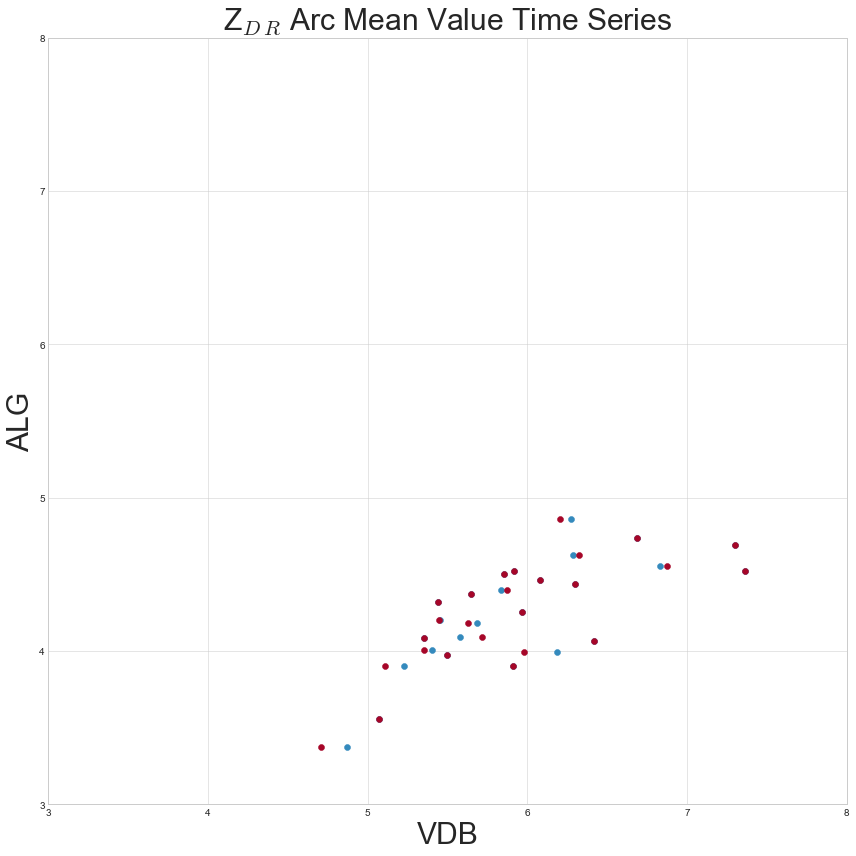

In [317]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(1, (12, 12))
x = np.arange(0, len(VDB_zdrmeans_r), 1)
#x2 = np.arange(0, len(alg_footarea), 1)
plt.scatter(VDB_zdr10max_rm, storm1_max_f[2:32])
#plt.scatter(VDB_zdr10max_r, storm1_max_f[2:32])
plt.scatter(MW_zdr10max_rm, storm1_max_f[2:32])

#plt.plot(x1+19, np.asarray(areas[0:21]))
#plt.plot(x1[1:21]+19, storm1_alg_f[0:20])
#plt.plot(x1[1:21]+19, storm2_alg_f[0:20])
#plt.plot(x, storm3_alg_f[0:40])
#plt.plot(x, storm4_alg_f[0:40], label='Algorithm Areas')
#plt.plot(x2[2:32]-2, alg_footarea[2:32], color='cyan',label='Algorithm Areas', linestyle='--', linewidth=4)

plt.title('Z$_D$$_R$ Arc Mean Value Time Series', size=30)
#plt.plot(x[::4], np.asarray(areas)[::4])
#plt.plot(x[1::4], np.asarray(areas)[1::4])
plt.xlabel('VDB', size=30)
plt.ylabel('ALG', size=30)
plt.ylim(3, 8)
plt.xlim(3, 8)
plt.legend(fontsize=25)
plt.tight_layout()
#plt.savefig('PaperFootTimeSeries_revised_cyan.png')
plt.show()

In [318]:
#pickle.dump(storm1_alg_f, open( "comp_arc_alg_area_newforest.pkl", "wb" ) )

In [288]:
#pickle.dump(sep_alg, open( "comp_alg_angle_newforest.pkl", "wb" ) )